In [1]:
#importing essential scripts for data analysis
import pandas as pd
import numpy as np
from data_manipulations import DataTransform
from data_manipulations import DataFrameInfo
from data_manipulations import Plotter
from data_manipulations import DataFrameTransform
from data_manipulations import LoanAnalyzer



In [2]:
#Loan payments csv file path 
file_path = 'loan_payments.csv'

#obtaining the dataframe from the csv file
loan_df = pd.read_csv(file_path)

# Set to display all columns
pd.set_option('display.max_columns', None)  


In [3]:
#the view of dataframe in form it is obtained from AI Core online repository
loan_df

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term,int_rate,instalment,grade,sub_grade,employment_length,home_ownership,annual_inc,verification_status,issue_date,loan_status,payment_plan,purpose,dti,delinq_2yrs,earliest_credit_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_accounts,total_accounts,out_prncp,out_prncp_inv,total_payment,total_payment_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_payment_date,last_payment_amount,next_payment_date,last_credit_pull_date,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type
0,38676116,41461848,8000,8000.0,8000.0,36 months,7.49,248.82,A,A4,5 years,MORTGAGE,46000.0,Not Verified,Jan-2021,Current,n,credit_card,19.54,2,Oct-1987,1,5.0,NaN,12,27,5529.70,5529.70,2982.51,2982.51,2470.30,512.21,0.000000,0.00,0.00,Jan-2022,248.82,Feb-2022,Jan-2022,0.0,5.0,1,INDIVIDUAL
1,38656203,41440010,13200,13200.0,13200.0,36 months,6.99,407.52,A,A3,9 years,RENT,50000.0,Not Verified,Jan-2021,Current,n,credit_card,24.20,0,Sep-2001,0,NaN,NaN,15,31,9102.83,9102.83,4885.11,4885.11,4097.17,787.94,0.000000,0.00,0.00,Jan-2022,407.52,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
2,38656154,41439961,16000,16000.0,16000.0,36 months,7.49,497.63,A,A4,8 years,MORTGAGE,73913.0,Source Verified,Jan-2021,Fully Paid,n,credit_card,16.92,0,Sep-1998,0,69.0,NaN,7,18,0.00,0.00,16824.54,16824.54,16000.00,824.54,0.000000,0.00,0.00,Oct-2021,12850.16,NaN,Oct-2021,0.0,NaN,1,INDIVIDUAL
3,38656128,41439934,15000,15000.0,15000.0,36 months,14.31,514.93,C,C4,1 year,RENT,42000.0,Source Verified,Jan-2021,Fully Paid,n,debt_consolidation,35.52,0,Jun-2008,0,74.0,NaN,6,13,0.00,0.00,15947.47,15947.47,15000.00,947.47,0.000000,0.00,0.00,Jun-2021,13899.67,NaN,Jun-2021,0.0,NaN,1,INDIVIDUAL
4,38656121,41439927,15000,15000.0,15000.0,36 months,6.03,456.54,A,A1,10+ years,MORTGAGE,145000.0,Verified,Jan-2021,Current,n,debt_consolidation,3.33,0,Apr-2002,1,37.0,NaN,23,50,10297.47,10297.47,5473.46,5473.46,4702.53,770.93,0.000000,0.00,0.00,Jan-2022,456.54,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54226,76597,76583,5000,5000.0,1775.0,36 months,9.01,159.03,B,B2,1 year,MORTGAGE,250000.0,Not Verified,Jul-2013,Fully Paid,n,other,10.00,2,Apr-2003,0,5.0,NaN,5,7,0.00,0.00,5724.82,2032.29,5000.00,724.82,0.000000,0.00,0.00,Jul-2016,160.61,NaN,Jul-2016,NaN,NaN,1,INDIVIDUAL
54227,142608,74724,5000,5000.0,2350.0,36 months,10.59,162.73,C,C2,< 1 year,RENT,15000.0,Not Verified,Oct-2013,Fully Paid,n,other,24.40,0,Jan-1999,3,0.0,0.0,6,6,0.00,0.00,5931.25,2787.47,5000.00,826.31,104.942381,0.00,0.00,Oct-2016,490.01,NaN,Sep-2016,0.0,NaN,1,INDIVIDUAL
54228,117045,70978,3500,3500.0,2225.0,36 months,7.43,108.77,A,A2,10+ years,MORTGAGE,300000.0,Not Verified,Aug-2013,Does not meet the credit policy. Status:Fully ...,n,debt_consolidation,1.00,0,Feb-1984,0,NaN,NaN,8,18,0.00,0.00,3915.37,2489.01,3500.00,415.37,0.000000,0.00,0.00,Sep-2016,110.58,Sep-2016,May-2013,NaN,NaN,1,INDIVIDUAL
54229,88854,70699,5000,5000.0,225.0,36 months,7.43,155.38,A,A2,4 years,RENT,200000.0,Not Verified,Aug-2013,Fully Paid,n,house,0.28,0,Mar-1995,0,0.0,0.0,2,2,0.00,0.00,5174.18,232.84,5000.00,174.18,0.000000,0.00,0.00,Mar-2014,0.00,NaN,May-2013,NaN,NaN,1,INDIVIDUAL


In [4]:
#Transforming the term and employment length columns in to an integer representation (null values preserved)

#instance of data tansfer class
transformation_instance=DataTransform(loan_df)

#getting a version of dataframe with the transformed columns
data_df=transformation_instance.column_conversions()


In [5]:
#Verifying if the structure of the new dataframe is correct.

#Make sure that when displaying the dataframe all columns are displayed
pd.set_option('display.width', 1000)      

#printing the dataframe
print(data_df)

             id  member_id  loan_amount  funded_amount  funded_amount_inv  term  int_rate  instalment grade sub_grade  employment_length home_ownership  annual_inc verification_status issue_date                                        loan_status payment_plan             purpose    dti  delinq_2yrs earliest_credit_line  inq_last_6mths  mths_since_last_delinq  mths_since_last_record  open_accounts  total_accounts  out_prncp  out_prncp_inv  total_payment  total_payment_inv  total_rec_prncp  total_rec_int  total_rec_late_fee  recoveries  collection_recovery_fee last_payment_date  last_payment_amount next_payment_date last_credit_pull_date  collections_12_mths_ex_med  mths_since_last_major_derog  policy_code application_type
0      38676116   41461848         8000         8000.0             8000.0    36      7.49      248.82     A        A4                5.0       MORTGAGE     46000.0        Not Verified   Jan-2021                                            Current            n         cre

In [6]:
#obtaining statistical parameters describing the nature of numerical columns
data_df.describe()

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term,int_rate,instalment,employment_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_accounts,total_accounts,out_prncp,out_prncp_inv,total_payment,total_payment_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_payment_amount,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code
count,5.423100e+04,5.423100e+04,54231.000000,51224.000000,54231.000000,49459.0,49062.000000,54231.000000,52113.000000,5.423100e+04,54231.000000,54231.000000,54231.000000,23229.00000,6181.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54231.000000,54180.000000,7499.000000,54231.0
mean,7.621797e+06,8.655350e+06,13333.076100,13229.509117,12952.622979,42.606199,13.507328,400.013953,5.787347,7.222085e+04,15.867087,0.241799,0.893843,34.01920,74.829154,10.559809,24.168206,2753.964172,2752.568147,12079.208480,11788.946618,9407.048589,2577.757101,0.901512,93.501288,10.859057,3130.706393,0.004208,42.253634,1.0
std,9.571362e+06,1.031281e+07,8082.196709,8019.017599,8099.473527,10.719573,4.392893,238.920012,3.508065,5.158934e+04,7.623124,0.706706,1.261421,21.92324,36.137264,4.797169,11.587025,5154.893646,5153.043643,8391.043845,8363.508506,6958.124264,2581.657345,6.215792,630.843636,120.193950,5323.801675,0.070990,21.052360,0.0
min,5.552100e+04,7.069400e+04,500.000000,500.000000,0.000000,36.0,5.420000,15.670000,1.000000,3.300000e+03,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,7.594330e+05,9.587720e+05,7000.000000,7000.000000,6700.000000,36.0,10.370000,224.205000,2.000000,4.500000e+04,10.200000,0.000000,0.000000,15.00000,53.000000,7.000000,16.000000,0.000000,0.000000,5895.210000,5658.815000,4264.350000,889.560000,0.000000,0.000000,0.000000,289.790000,0.000000,26.000000,1.0
50%,7.084590e+06,8.709873e+06,12000.000000,12000.000000,11300.000000,36.0,13.160000,347.150000,6.000000,6.100000e+04,15.600000,0.000000,1.000000,31.00000,87.000000,10.000000,23.000000,0.000000,0.000000,10113.250000,9835.830000,7644.920000,1734.640000,0.000000,0.000000,0.000000,562.670000,0.000000,42.000000,1.0
75%,8.860616e+06,1.052714e+07,18000.000000,18000.000000,18000.000000,60.0,16.200000,527.550000,10.000000,8.600000e+04,21.260000,0.000000,1.000000,49.00000,103.000000,13.000000,31.000000,3397.325000,3394.980000,16272.895000,15978.200000,12505.625000,3323.765000,0.000000,0.000000,0.000000,3738.120000,0.000000,59.000000,1.0
max,3.867612e+07,4.146185e+07,35000.000000,35000.000000,35000.000000,60.0,26.060000,1407.010000,10.000000,2.039784e+06,39.910000,18.000000,33.000000,146.00000,119.000000,53.000000,108.000000,32399.940000,32399.940000,55758.222084,55061.000000,35000.020000,23062.450000,358.680000,27750.000000,7002.190000,36115.200000,4.000000,146.000000,1.0


In [7]:
#printing data types for each column
print(data_df.dtypes)

id                               int64
member_id                        int64
loan_amount                      int64
funded_amount                  float64
funded_amount_inv              float64
term                             Int64
int_rate                       float64
instalment                     float64
grade                           object
sub_grade                       object
employment_length              float64
home_ownership                  object
annual_inc                     float64
verification_status             object
issue_date                      object
loan_status                     object
payment_plan                    object
purpose                         object
dti                            float64
delinq_2yrs                      int64
earliest_credit_line            object
inq_last_6mths                   int64
mths_since_last_delinq         float64
mths_since_last_record         float64
open_accounts                    int64
total_accounts           

In [8]:
# Rows number, Columns Number
rows,cols=data_df.shape
print(f'Number of rows is: {rows}, columns: {cols}')


Number of rows is: 54231, columns: 43


In [9]:
#For Categorical Columns counting the distinct values

# Select only categorical columns (dtype: object)
categorical_columns = data_df.select_dtypes(include='object')

# Count distinct values in each categorical column
distinct_counts = categorical_columns.nunique()

# Display the result
print(distinct_counts)


grade                      7
sub_grade                 35
home_ownership             5
verification_status        3
issue_date                61
loan_status                9
payment_plan               2
purpose                   14
earliest_credit_line     587
last_payment_date         98
next_payment_date         96
last_credit_pull_date    101
application_type           1
dtype: int64


In [10]:
#intialising instance of the class to obtain the missing_percentage a number of missing values in each column
info=DataFrameInfo(data_df)

# Set to display all columns
pd.set_option('display.max_columns', None)  

#display info by calling method
info.column_statistics()


Column: id
Missing Percentage: 0.00%, Missing Value Count: 0
Normality Test - Statistics=25327.749, p=0.000
The data does not appear to follow a normal distribution (reject H0).

Column: member_id
Missing Percentage: 0.00%, Missing Value Count: 0
Normality Test - Statistics=23353.917, p=0.000
The data does not appear to follow a normal distribution (reject H0).

Column: loan_amount
Missing Percentage: 0.00%, Missing Value Count: 0
Normality Test - Statistics=4586.019, p=0.000
The data does not appear to follow a normal distribution (reject H0).

Column: funded_amount
Missing Percentage: 5.54%, Missing Value Count: 3007
Normality Test - Statistics=4491.436, p=0.000
The data does not appear to follow a normal distribution (reject H0).

Column: funded_amount_inv
Missing Percentage: 0.00%, Missing Value Count: 0
Normality Test - Statistics=4685.476, p=0.000
The data does not appear to follow a normal distribution (reject H0).

Column: term
Missing Percentage: 8.80%, Missing Value Count: 4

/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1606: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = skew(a, axis)
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1808: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = kurtosis(a, axis, fisher=False)


### Columns with High Missing Percentage
Looking at the missing percentage of values in columns it is zero or close to zero for most columns and less 10% except for columns "mths_since_last_delinq", "mths_since_last_record", "next_payment_date" and "mths_since_last_major_derog". The 4 columns have more then 50% missing data values, hence I will be dropping those variables, as imputations risks making up too much erronous data.

### Categorical Columns with Null Values
There are two categorical columns with null values left which contain 80 null values across them. Entire rows will be dropped from the dataframe where last_payment_date and last_credit_pull_date have null values. Given there is over 50000 rows in dataframe dropping 80 will be of no-consequence, but imputing dates might not have been the right approach due their inherent variability. 

### Numeric Columns with Null Values
Remaining columns missing values are numeric. They will be imputed with median. Median was chosen rather then mean as according to D'Agostino's K^2 Test no numeric columns follow normal distribution making median a more effective measure of central tendency. 

### Columns with No Dseful Data
Policy code and Application Type, contain constant values throught with zero variation.
Hence those columns are dropped as they produce no useful information.

For further confirmation that no variables follow normal distribtuion historgrams and q-qplots have been plotted. 

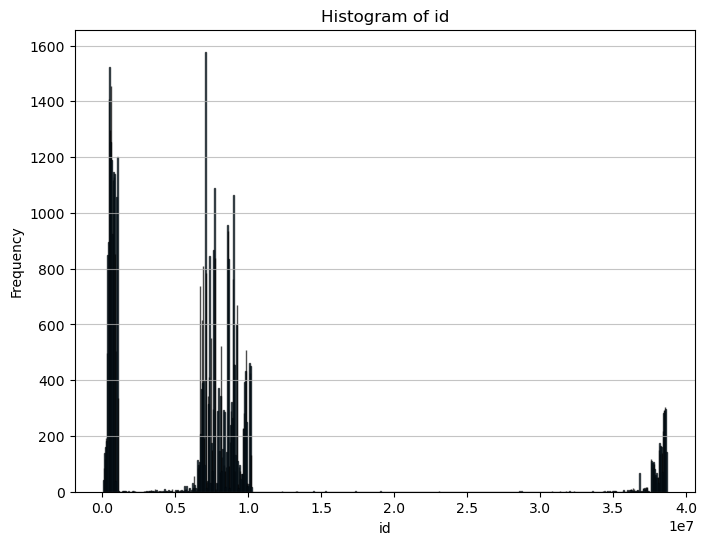

The skew of id column is 2.370336021094686


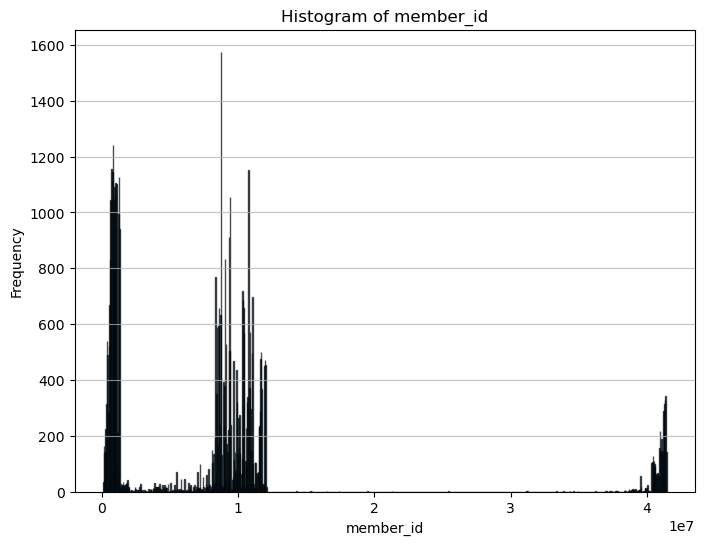

The skew of member_id column is 2.205422084785879


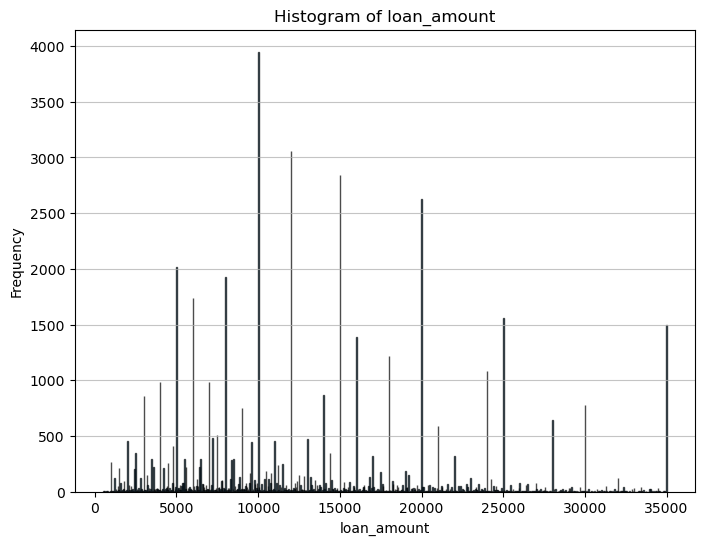

The skew of loan_amount column is 0.8052592257800115


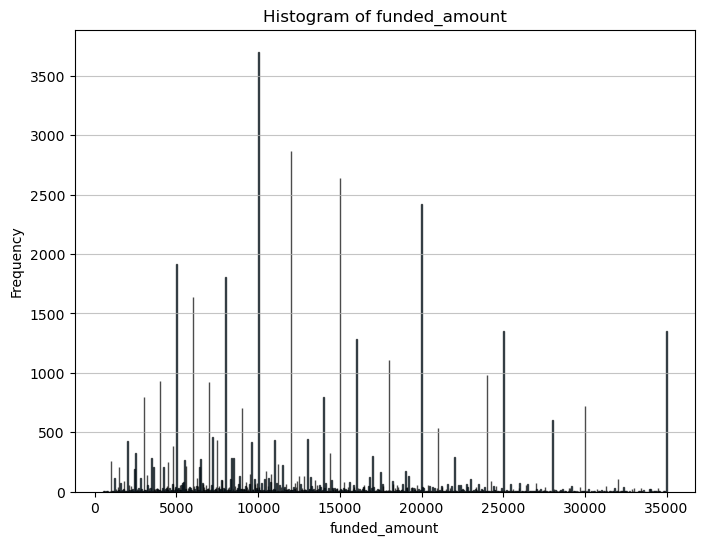

The skew of funded_amount column is 0.8217873460284143


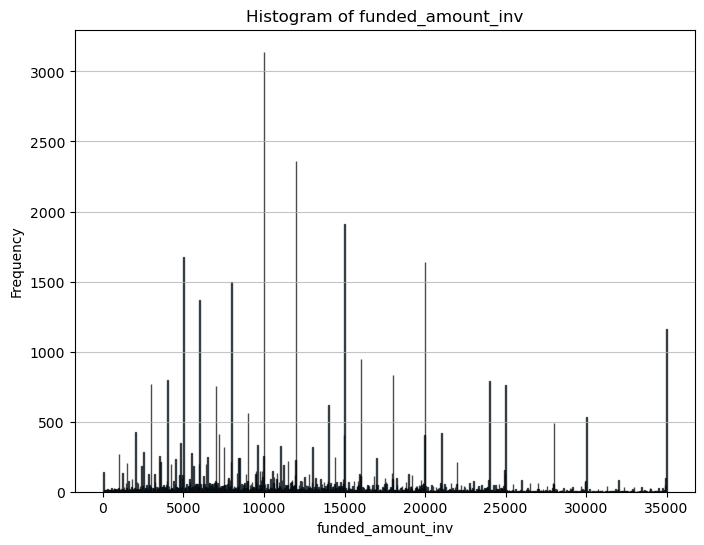

The skew of funded_amount_inv column is 0.8139274222318484


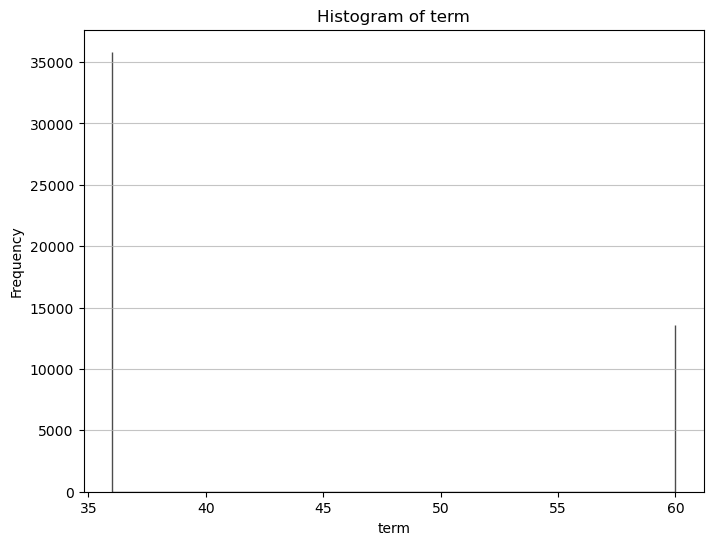

The skew of term column is 1.0063869691734089


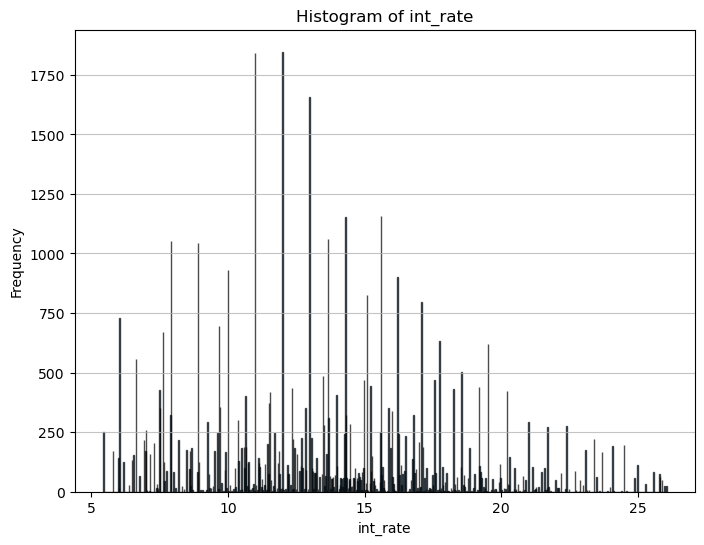

The skew of int_rate column is 0.41203240981473305


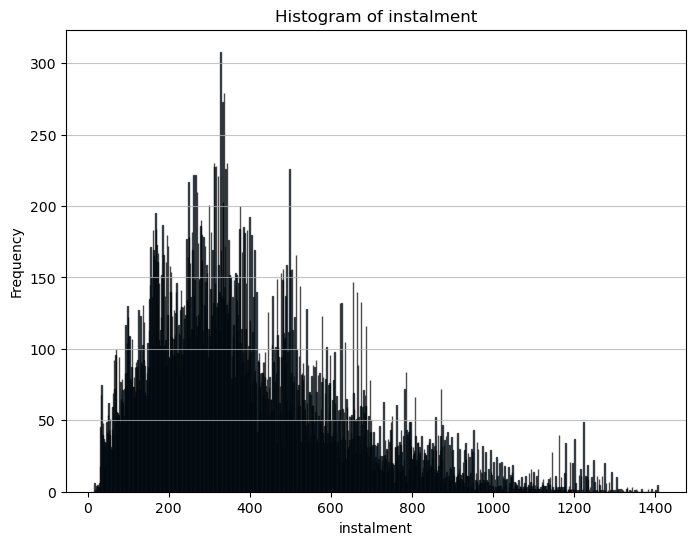

The skew of instalment column is 0.9969813991920319
Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


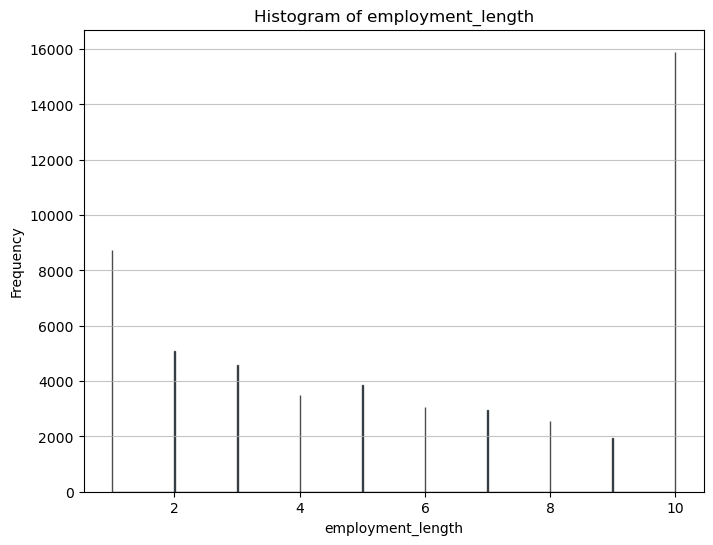

The skew of employment_length column is -0.030887781130908728
Skipping non-numeric column: home_ownership


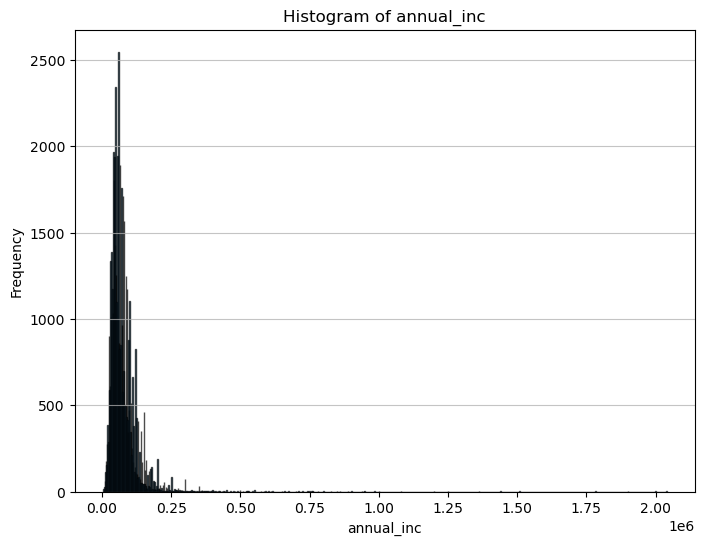

The skew of annual_inc column is 8.711831033809583
Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


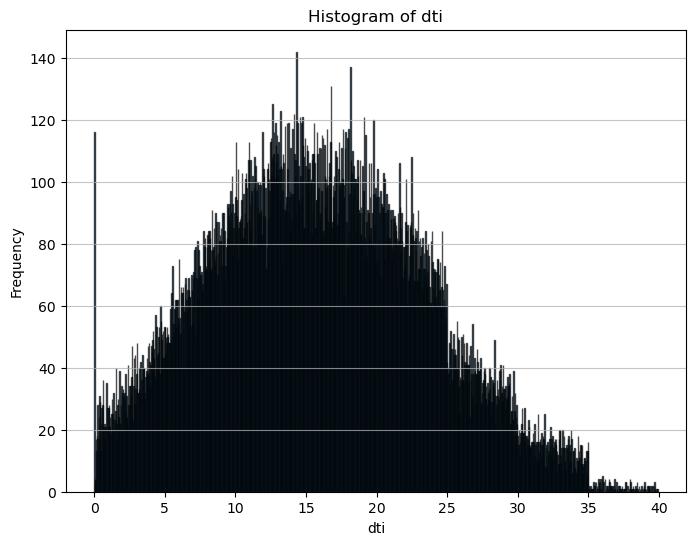

The skew of dti column is 0.18941964982496076


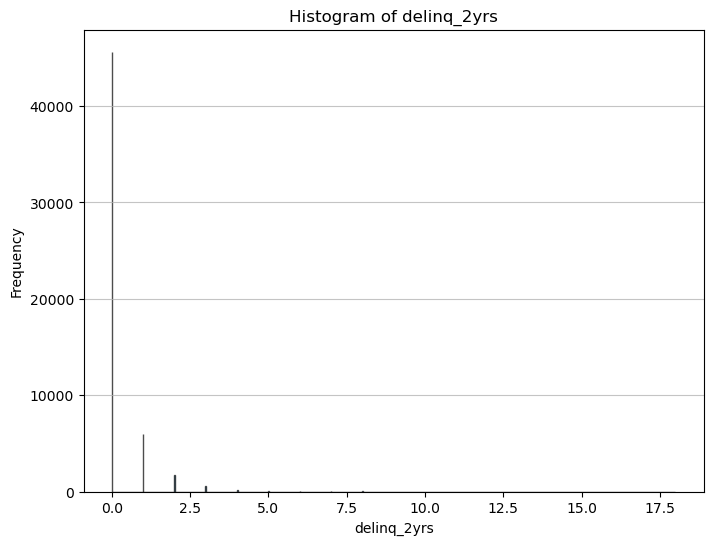

The skew of delinq_2yrs column is 5.370001885877136
Skipping non-numeric column: earliest_credit_line


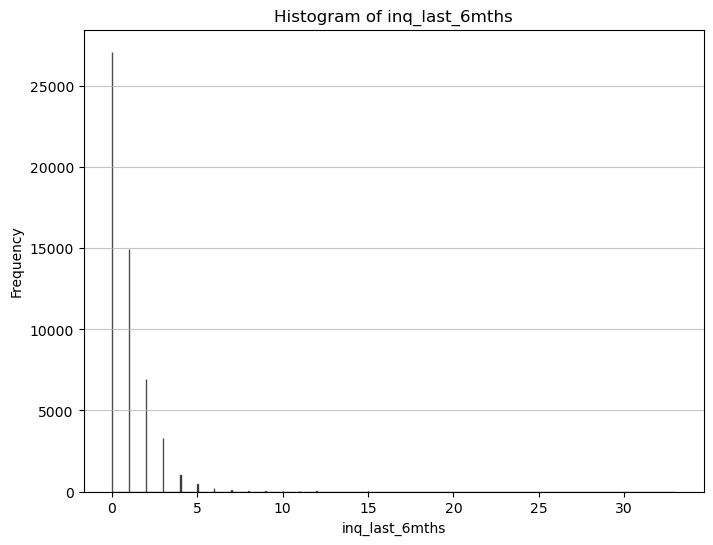

The skew of inq_last_6mths column is 3.248918364007299


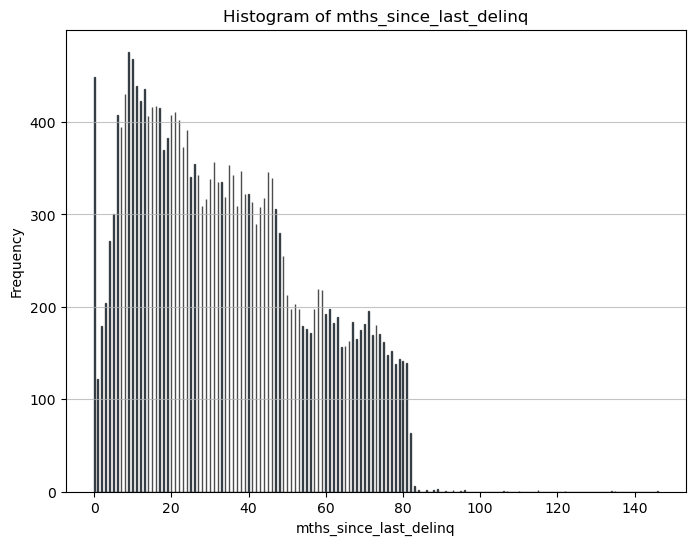

The skew of mths_since_last_delinq column is 0.4381092867649046


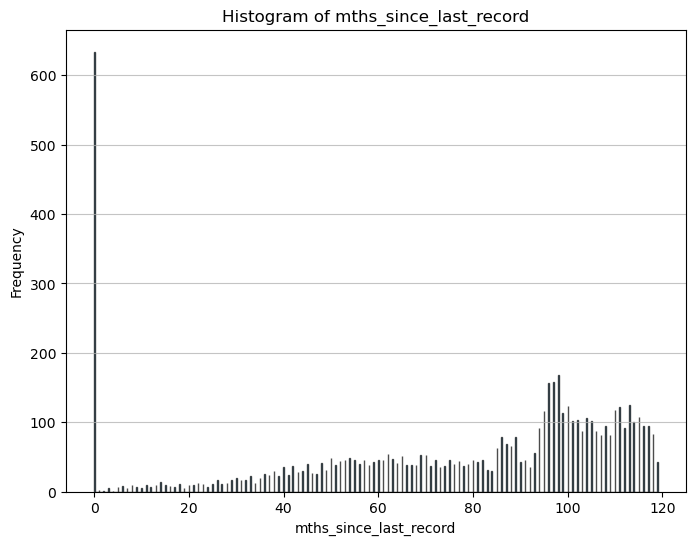

The skew of mths_since_last_record column is -0.8399954833849785


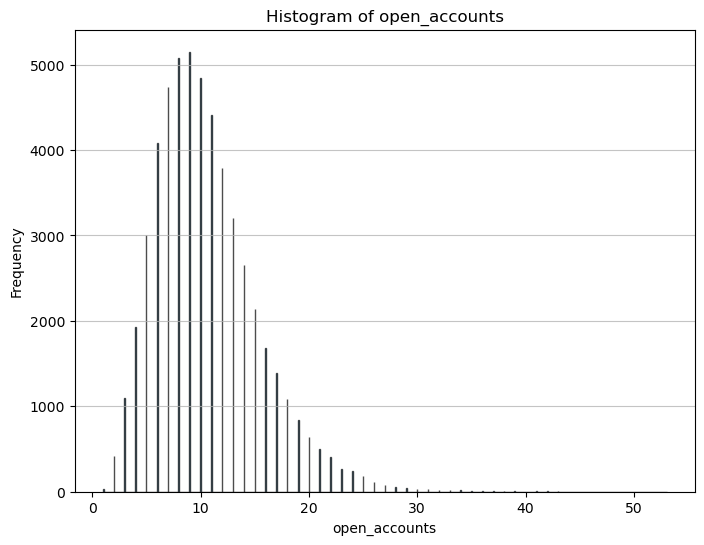

The skew of open_accounts column is 1.0592820053165104


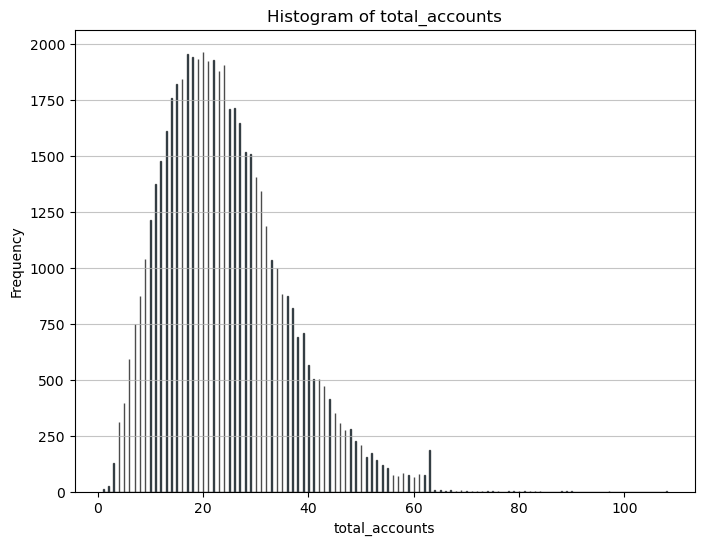

The skew of total_accounts column is 0.7790139244121327


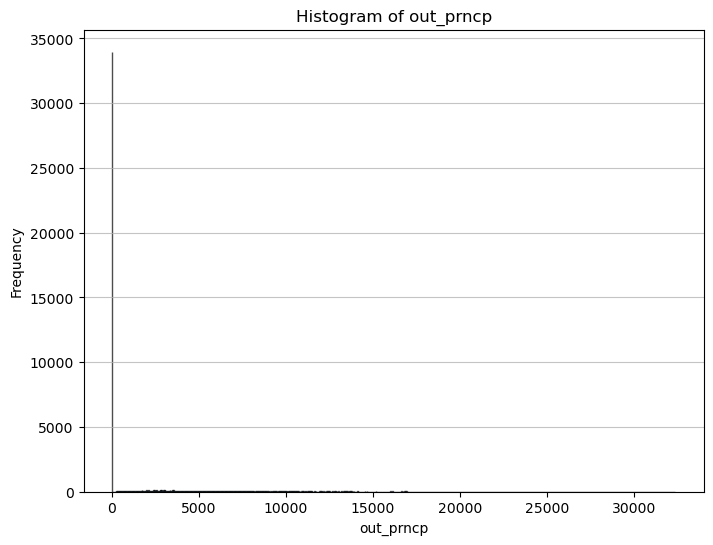

The skew of out_prncp column is 2.356426188671512


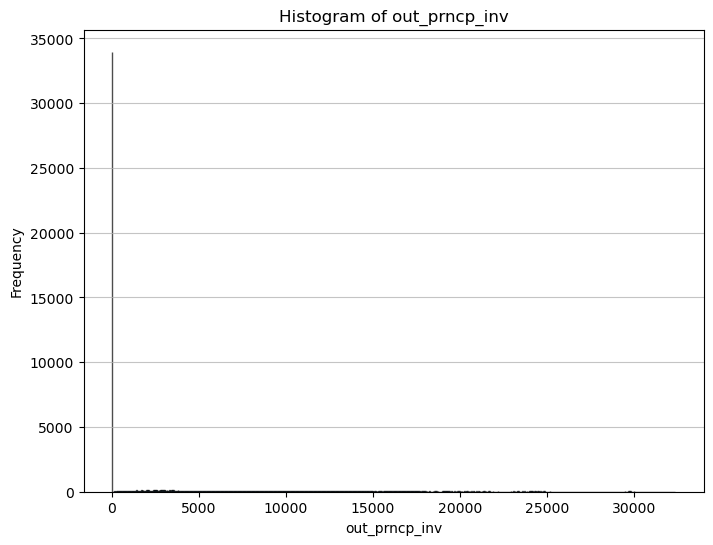

The skew of out_prncp_inv column is 2.3568475131007687


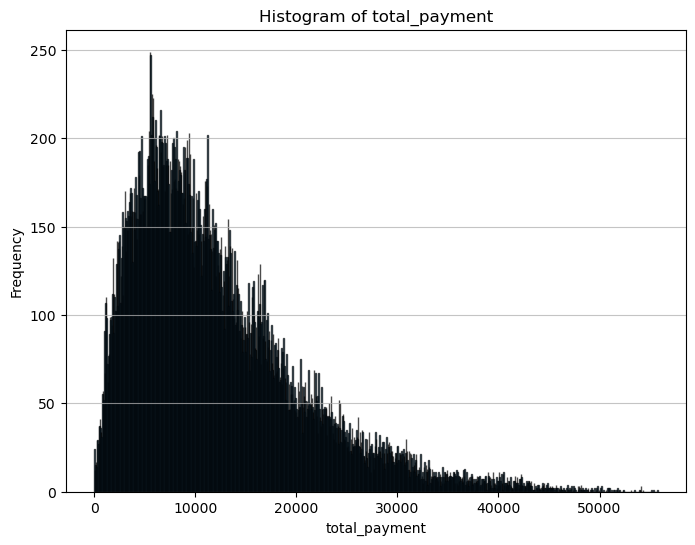

The skew of total_payment column is 1.267890957776937


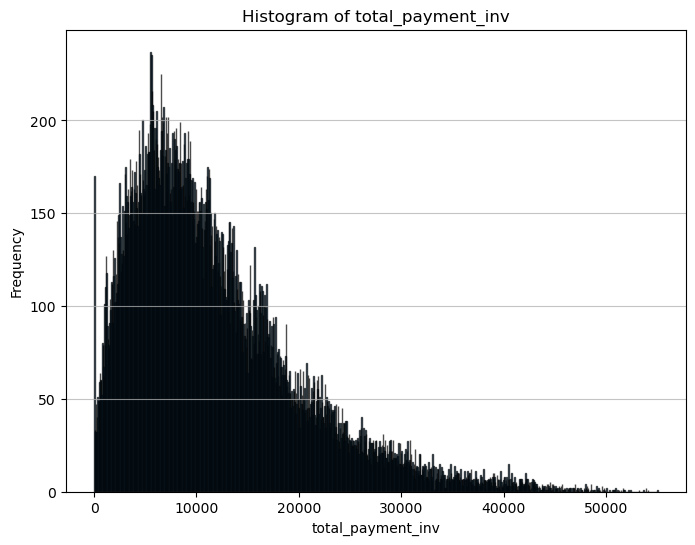

The skew of total_payment_inv column is 1.256196603509513


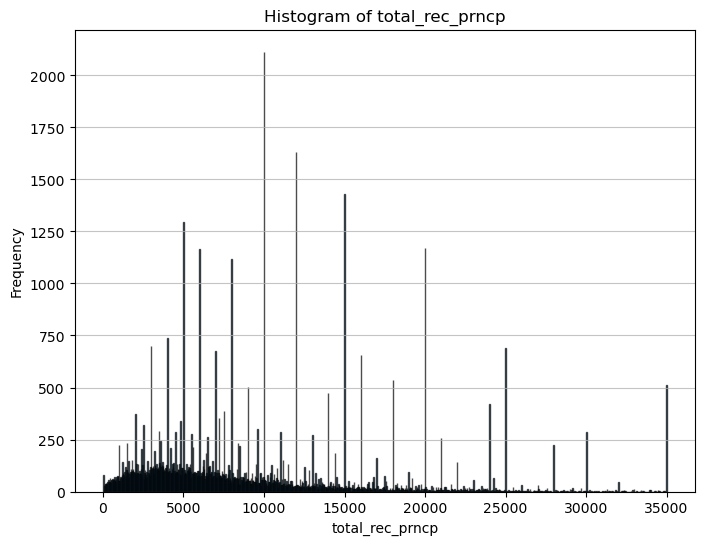

The skew of total_rec_prncp column is 1.2610146774673532


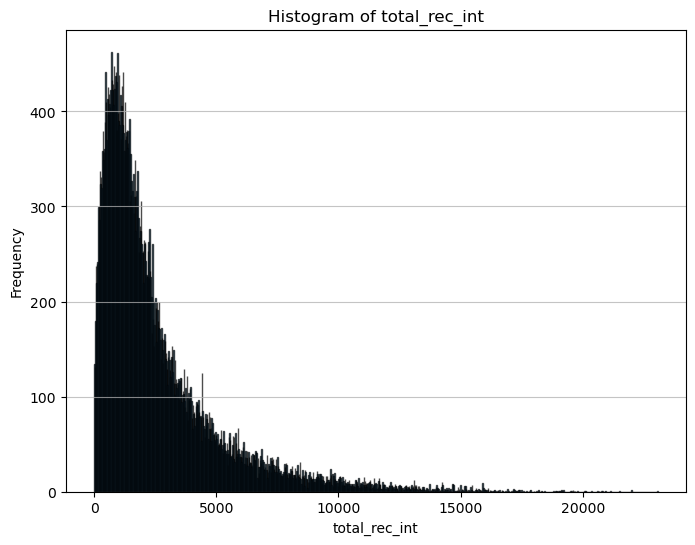

The skew of total_rec_int column is 2.204322035306792


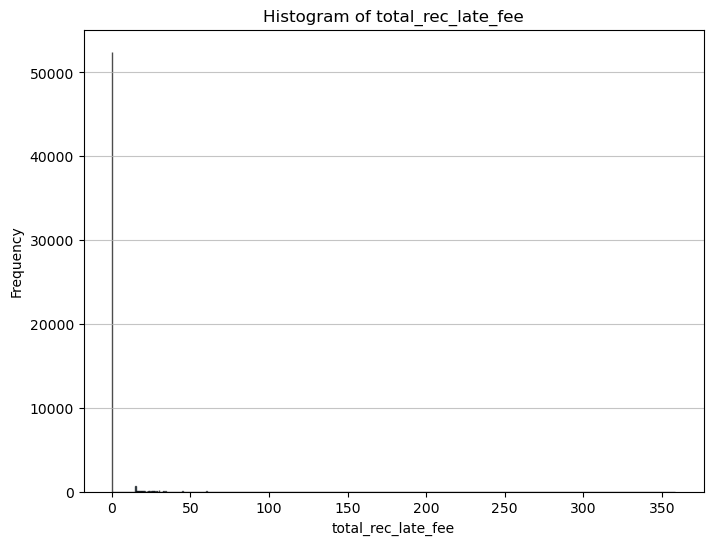

The skew of total_rec_late_fee column is 13.184304523859357


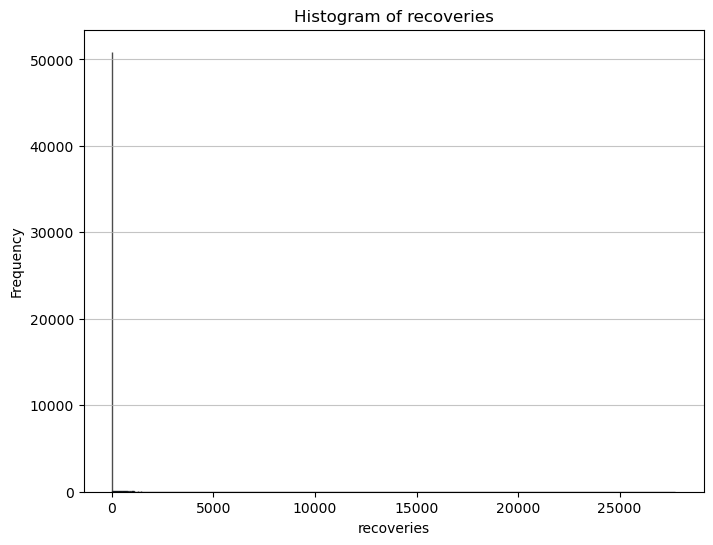

The skew of recoveries column is 14.58979334668037


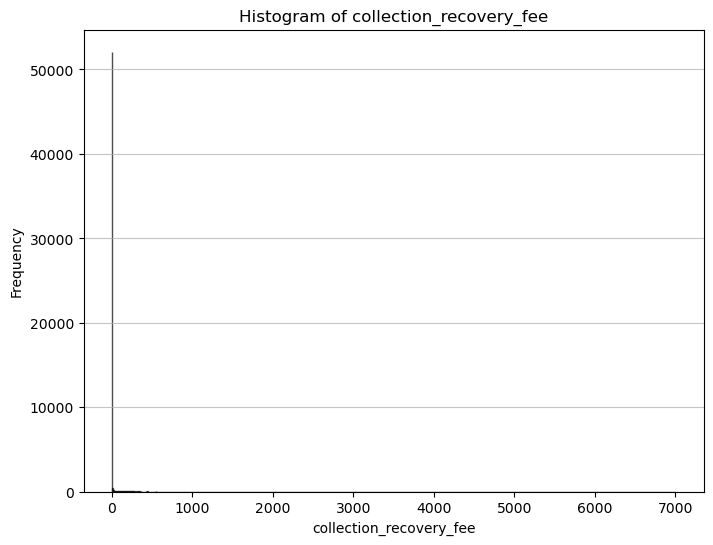

The skew of collection_recovery_fee column is 27.63684310809756
Skipping non-numeric column: last_payment_date


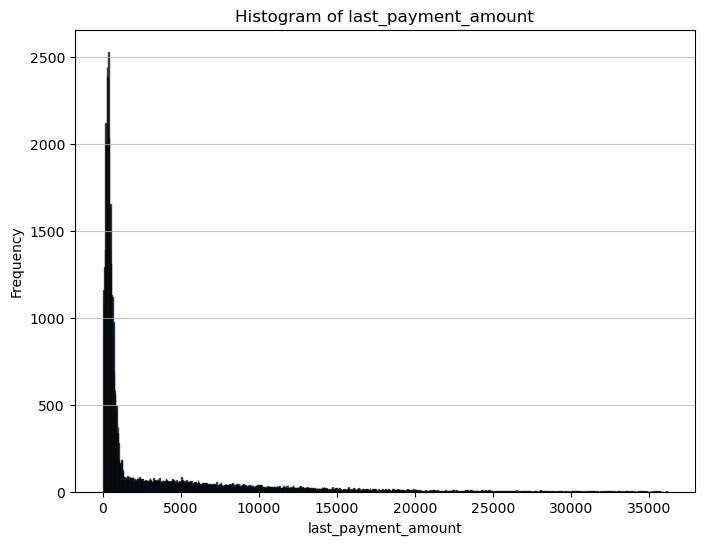

The skew of last_payment_amount column is 2.4993811438984834
Skipping non-numeric column: next_payment_date
Skipping non-numeric column: last_credit_pull_date


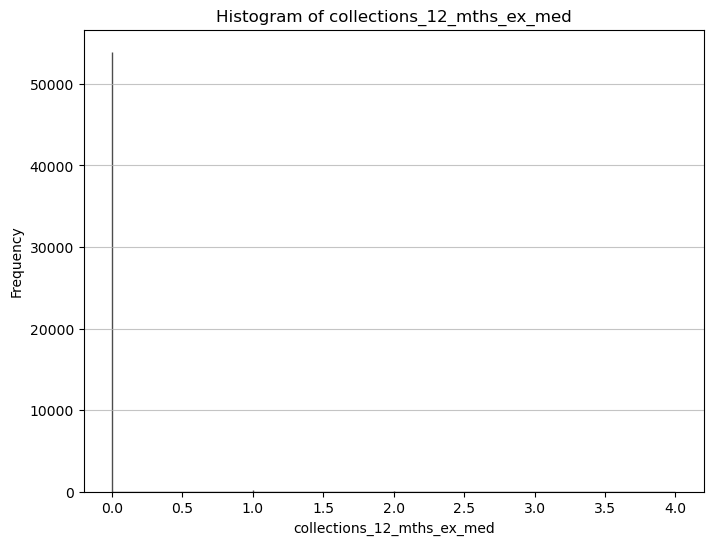

The skew of collections_12_mths_ex_med column is 20.252780275751494


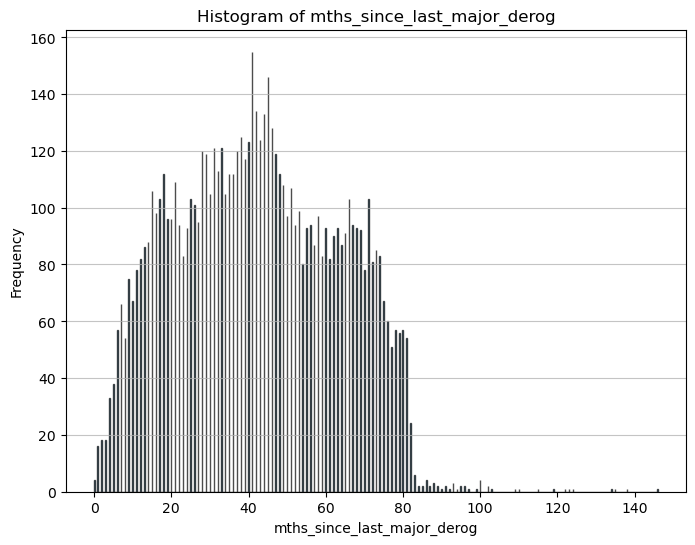

The skew of mths_since_last_major_derog column is 0.16417600133538526


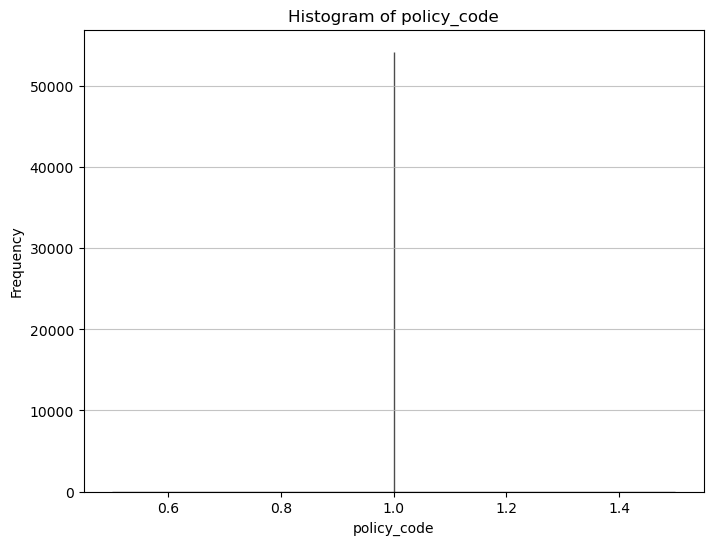

The skew of policy_code column is 0.0
Skipping non-numeric column: application_type


In [11]:
#obtaining historgram plots of the data to confirm it's nature

#creating a plot instance of Plotter class
plot=Plotter(data_df)

plot.histogram()

It is clear from those histogram plots neither distribution is normal, except for maybe policy_code and collections 12_mths_ex_med, but on those graphs x-variable range is too small to be able to tell. 

<Figure size 800x600 with 0 Axes>

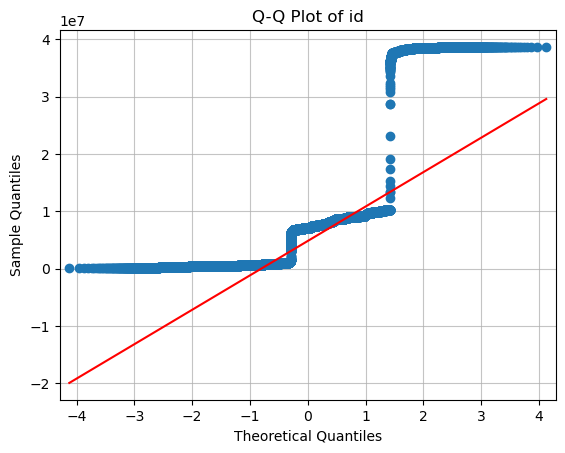

<Figure size 800x600 with 0 Axes>

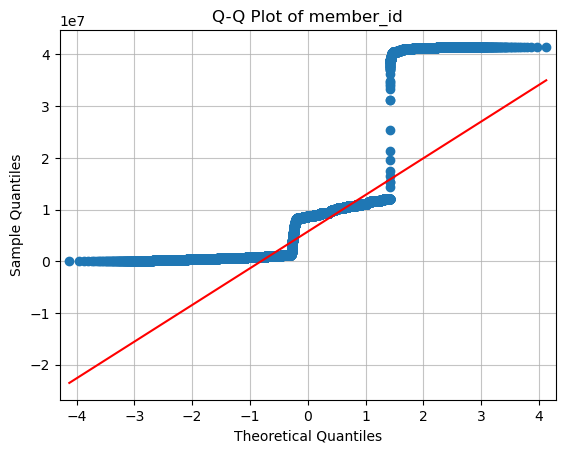

<Figure size 800x600 with 0 Axes>

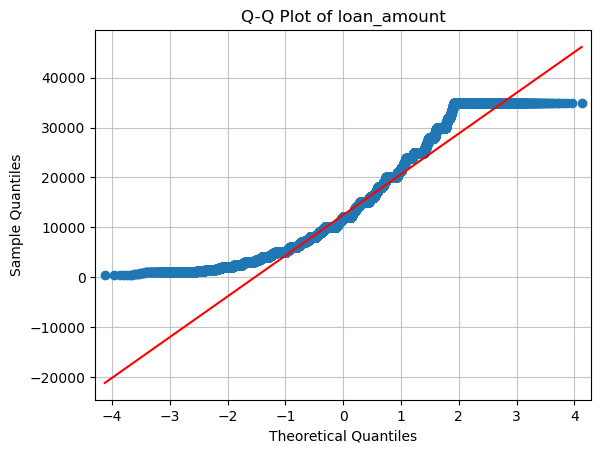

<Figure size 800x600 with 0 Axes>

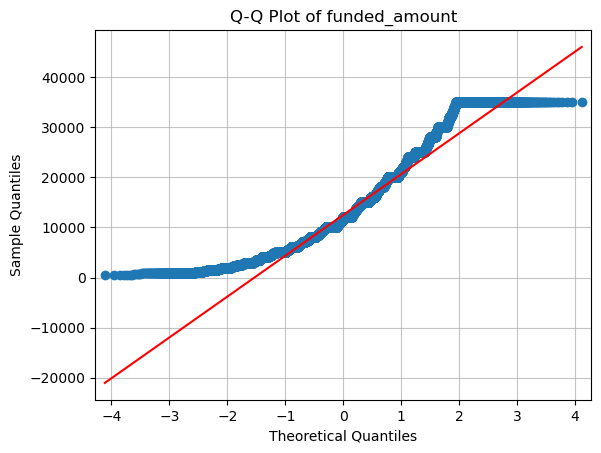

<Figure size 800x600 with 0 Axes>

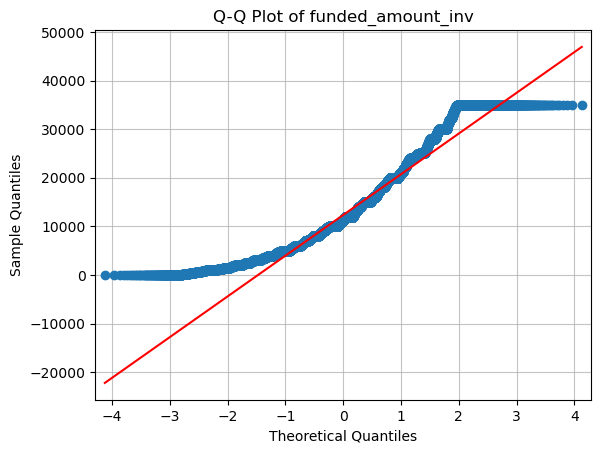

<Figure size 800x600 with 0 Axes>

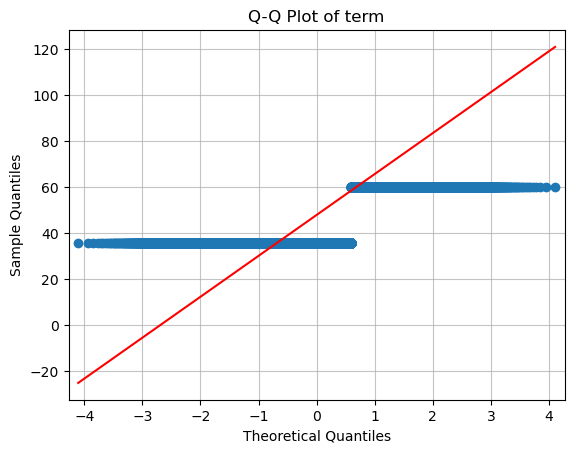

<Figure size 800x600 with 0 Axes>

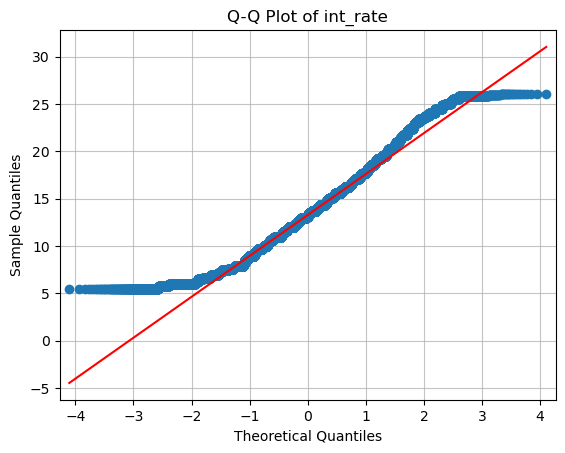

<Figure size 800x600 with 0 Axes>

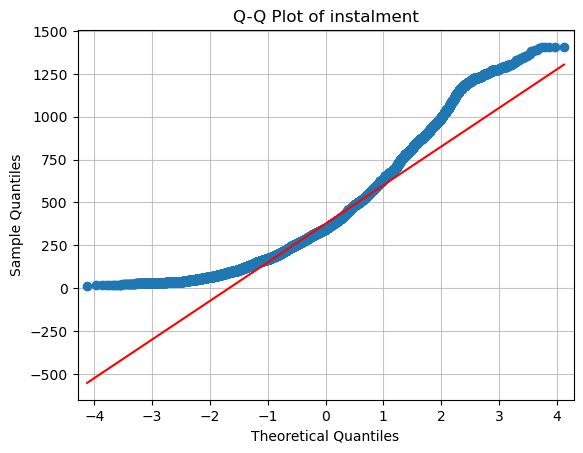

Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


<Figure size 800x600 with 0 Axes>

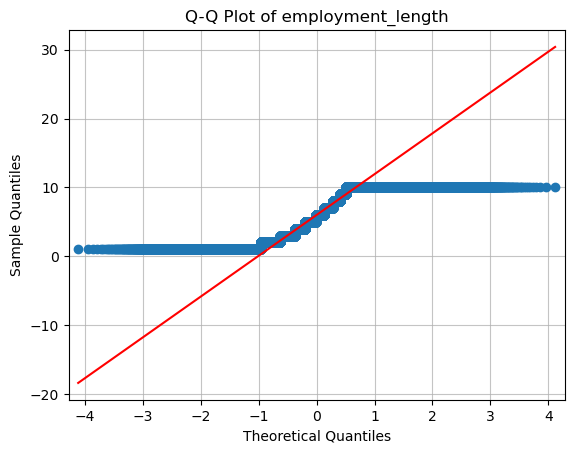

Skipping non-numeric column: home_ownership


<Figure size 800x600 with 0 Axes>

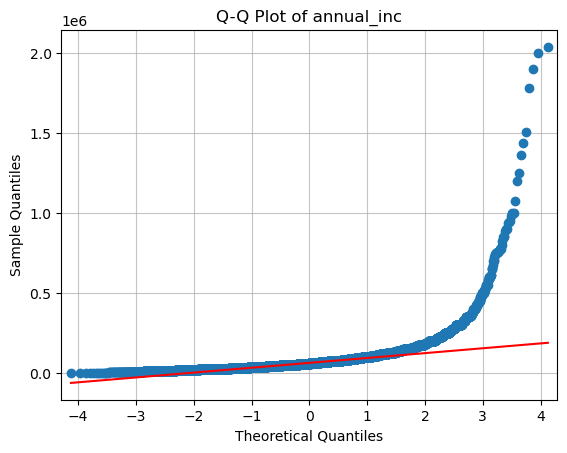

Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


<Figure size 800x600 with 0 Axes>

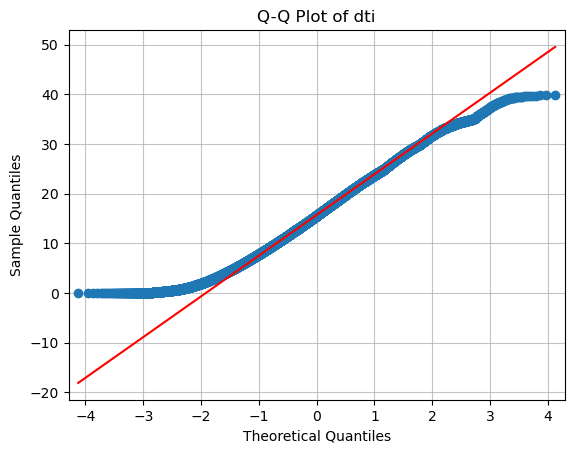

<Figure size 800x600 with 0 Axes>

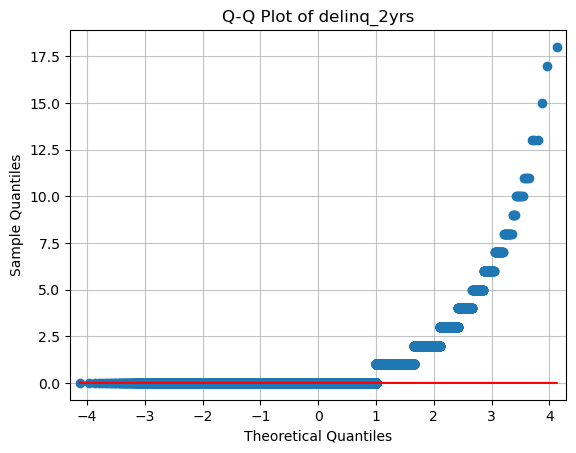

Skipping non-numeric column: earliest_credit_line


<Figure size 800x600 with 0 Axes>

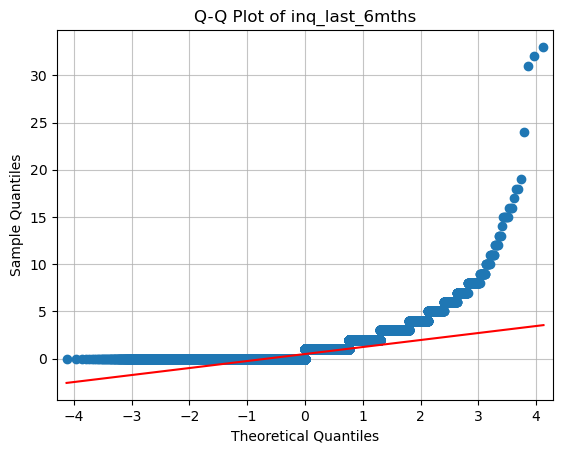

<Figure size 800x600 with 0 Axes>

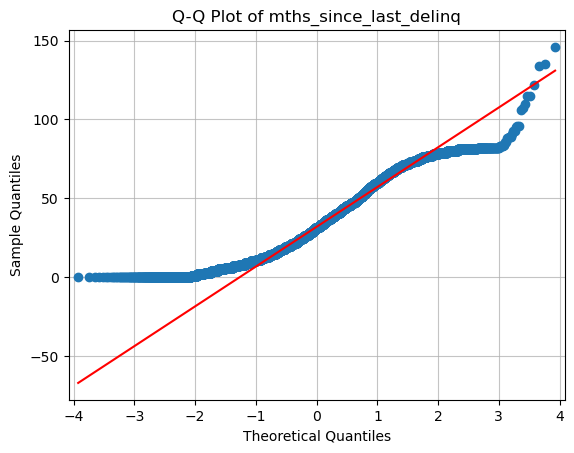

<Figure size 800x600 with 0 Axes>

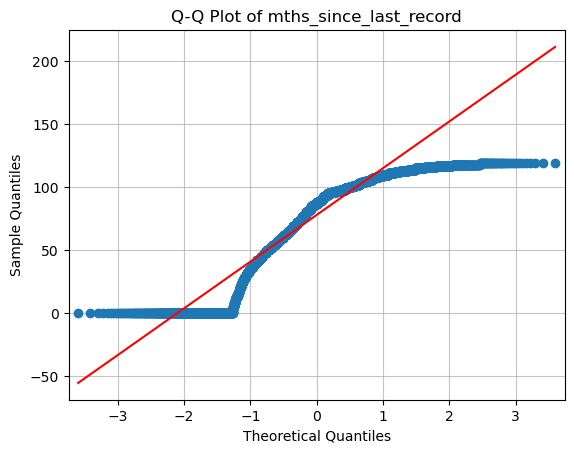

<Figure size 800x600 with 0 Axes>

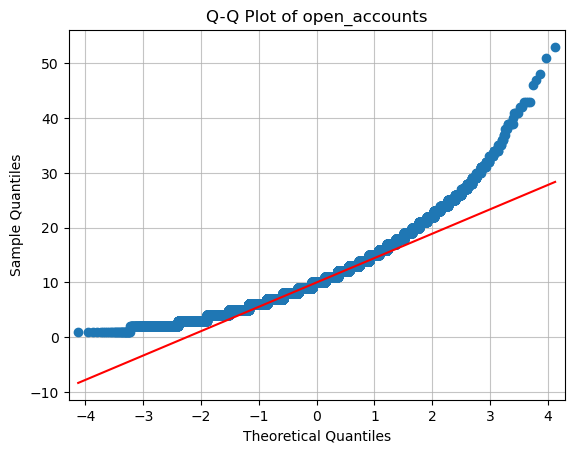

<Figure size 800x600 with 0 Axes>

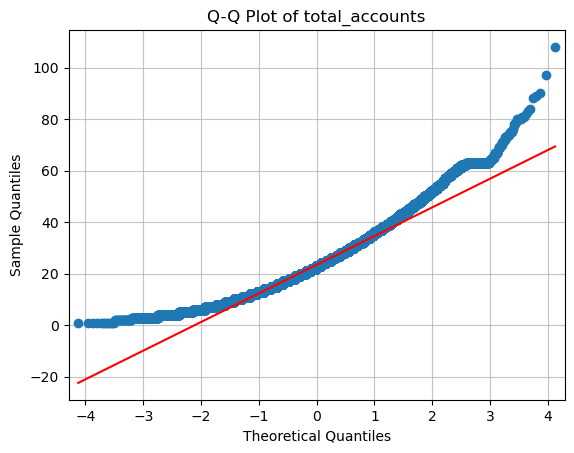

<Figure size 800x600 with 0 Axes>

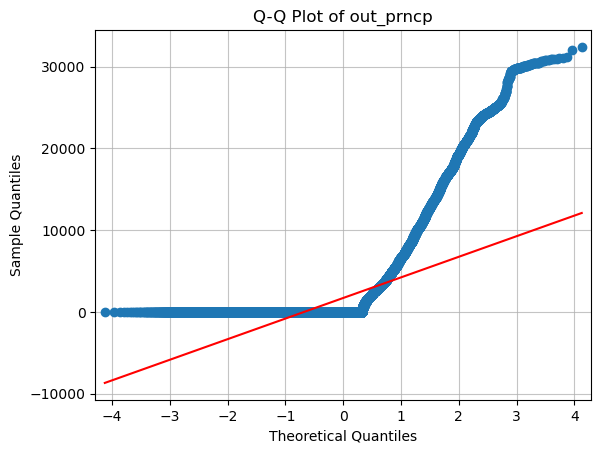

<Figure size 800x600 with 0 Axes>

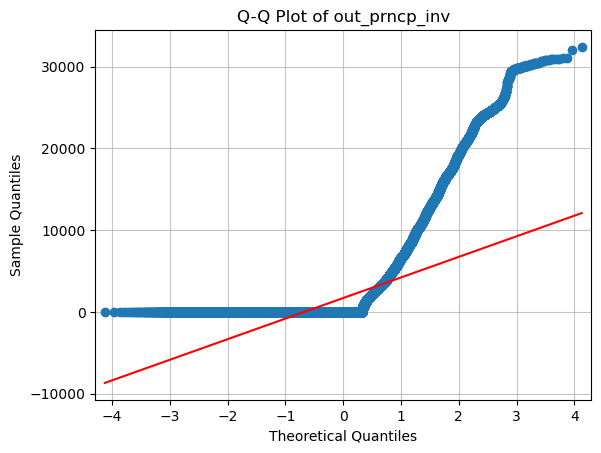

<Figure size 800x600 with 0 Axes>

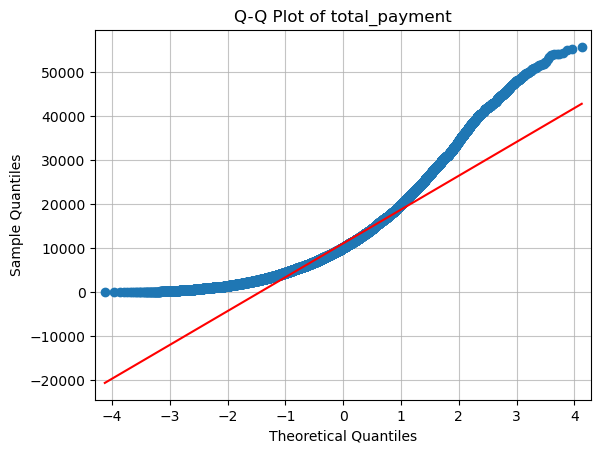

<Figure size 800x600 with 0 Axes>

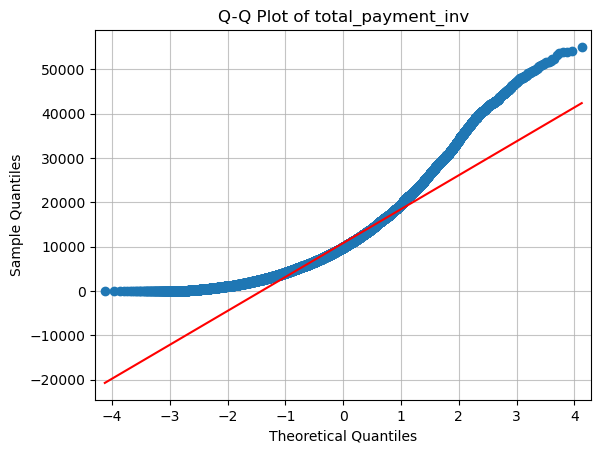

<Figure size 800x600 with 0 Axes>

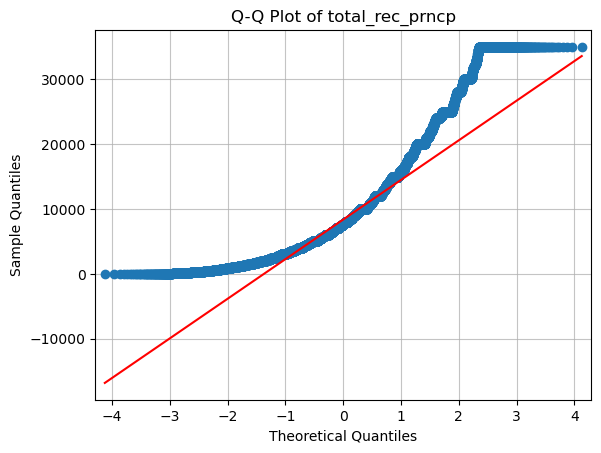

<Figure size 800x600 with 0 Axes>

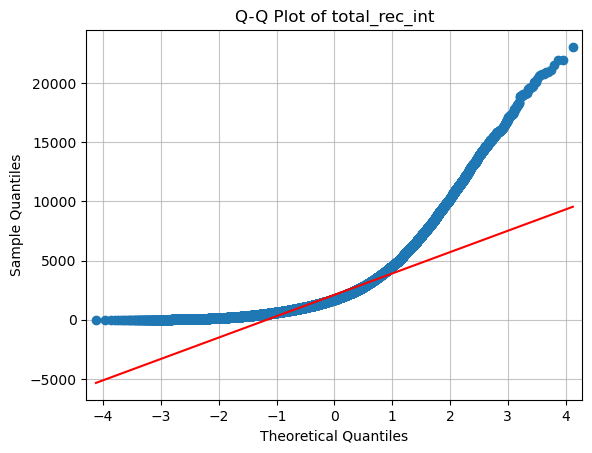

<Figure size 800x600 with 0 Axes>

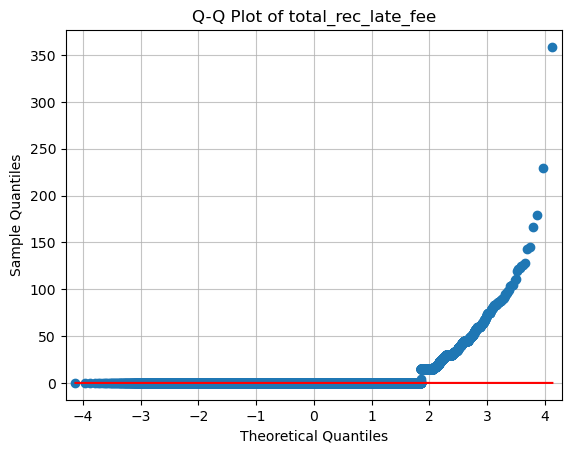

<Figure size 800x600 with 0 Axes>

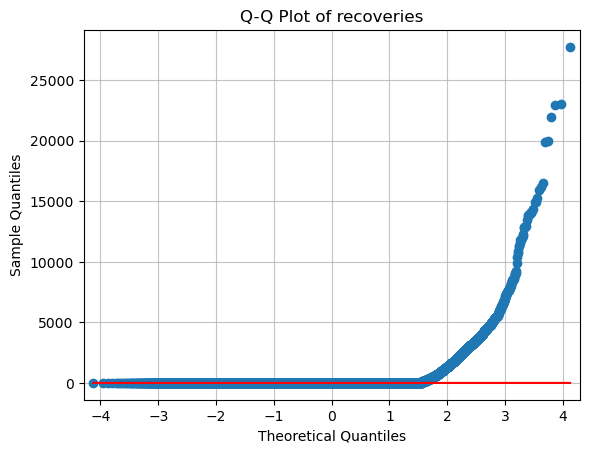

<Figure size 800x600 with 0 Axes>

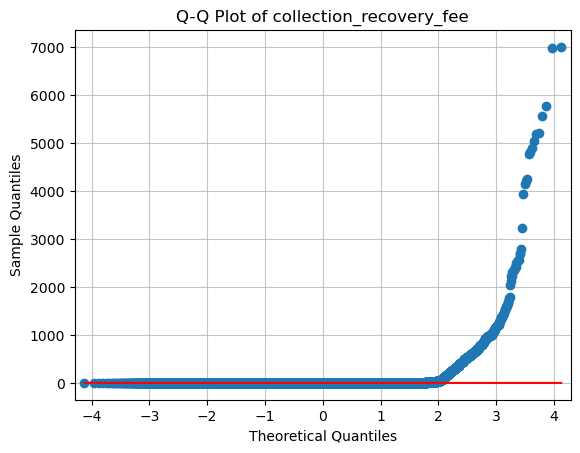

Skipping non-numeric column: last_payment_date


<Figure size 800x600 with 0 Axes>

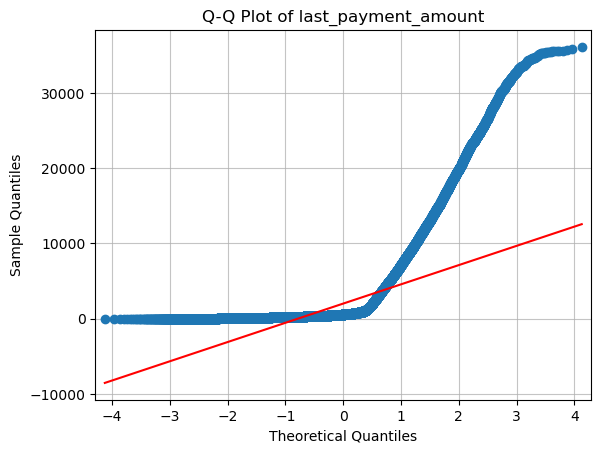

Skipping non-numeric column: next_payment_date
Skipping non-numeric column: last_credit_pull_date


<Figure size 800x600 with 0 Axes>

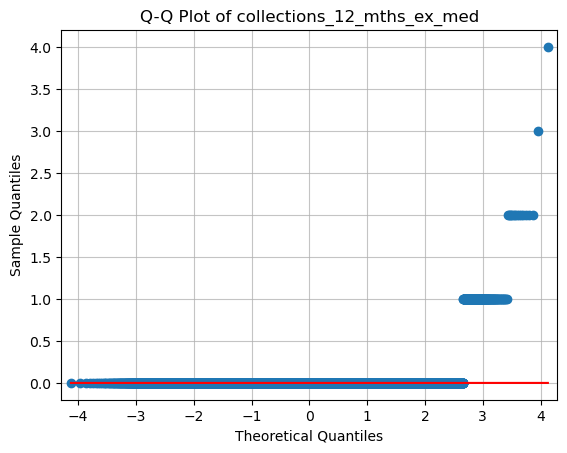

<Figure size 800x600 with 0 Axes>

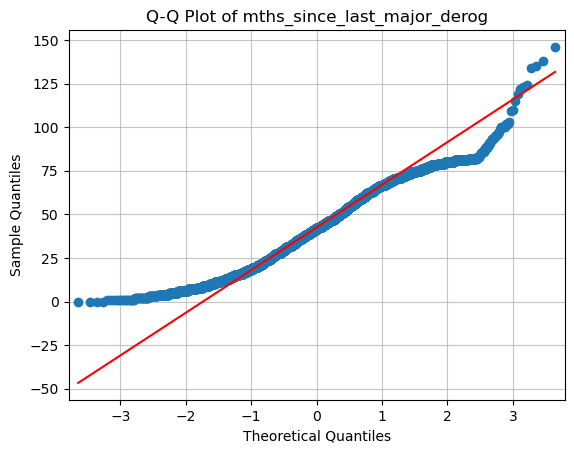

<Figure size 800x600 with 0 Axes>

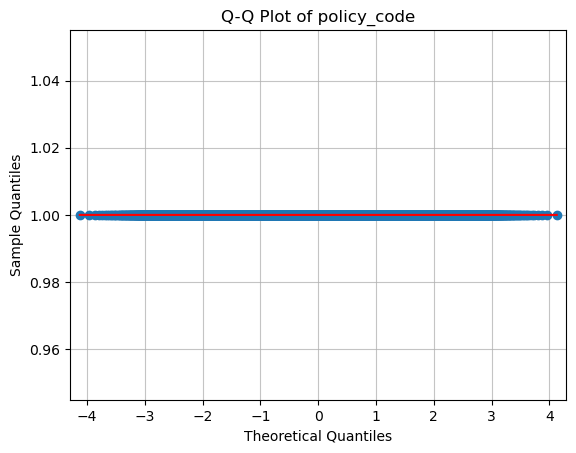

Skipping non-numeric column: application_type


In [12]:
#obtaining q-q plots of the data
plot.q_q_plot()

Except for policy code the red and blue lines do not align all through out the graph suggesting that normal distribution is not being followed for all of the data range. As policy code has no missing values and no other variables seem to follow normal distribution we are ok to impute other columns with median values. 

In [13]:
#creating an instance of the class to transform the value removing columns with 50% nulls and imputing missing values in other columns with median
transform=DataFrameTransform(data_df)

#drops columns 
transform.drop_columns_with_missing_and_constant_values()

#remove the 80 rows where null values occur for categorical data (dates).
transform.drop_rows_with_nulls_in_columns(['last_payment_date','last_credit_pull_date'])

#imputes with median coulmns that have less then 10% missing values. 
revised_df=transform.impute_missing_values(10,'median')

#creating new instance of info class with new revised daframe
info=DataFrameInfo(revised_df)

#cheking that there are no more null values
info.column_statistics()

Dropped columns: ['mths_since_last_delinq', 'mths_since_last_record', 'next_payment_date', 'mths_since_last_major_derog', 'policy_code', 'application_type']
Dropped 80 rows due to null values in columns: ['last_payment_date', 'last_credit_pull_date']
Imputed missing values in column 'id' with its median.
Imputed missing values in column 'member_id' with its median.
Imputed missing values in column 'loan_amount' with its median.
Imputed missing values in column 'funded_amount' with its median.
Imputed missing values in column 'funded_amount_inv' with its median.
Imputed missing values in column 'term' with its median.
Imputed missing values in column 'int_rate' with its median.
Imputed missing values in column 'instalment' with its median.
Skipped non-numeric column: 'grade'.
Skipped non-numeric column: 'sub_grade'.
Imputed missing values in column 'employment_length' with its median.
Skipped non-numeric column: 'home_ownership'.
Imputed missing values in column 'annual_inc' with its me

/home/micha/Exploratory-Data-Analysis---Customer-Loans-in-Finance/data_manipulations.py:648: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  self.eda_data_frame[col].fillna(replacement_value, inplace=True)
/home/micha/Exploratory-Data-Analysis---Customer-Loans-in-Finance/data_manipulations.py:648: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate obje

The count of mssing values is now zero for all remaining varaibles, hence the imputations have been successful. Furthermore mths_since_last_delinq', 'mths_since_last_record', 'next_payment_date', 'mths_since_last_major_derog' are no longer present hence they have been succesfully removed. 

Generating a heatmap of null values before and after to confirm those findings.

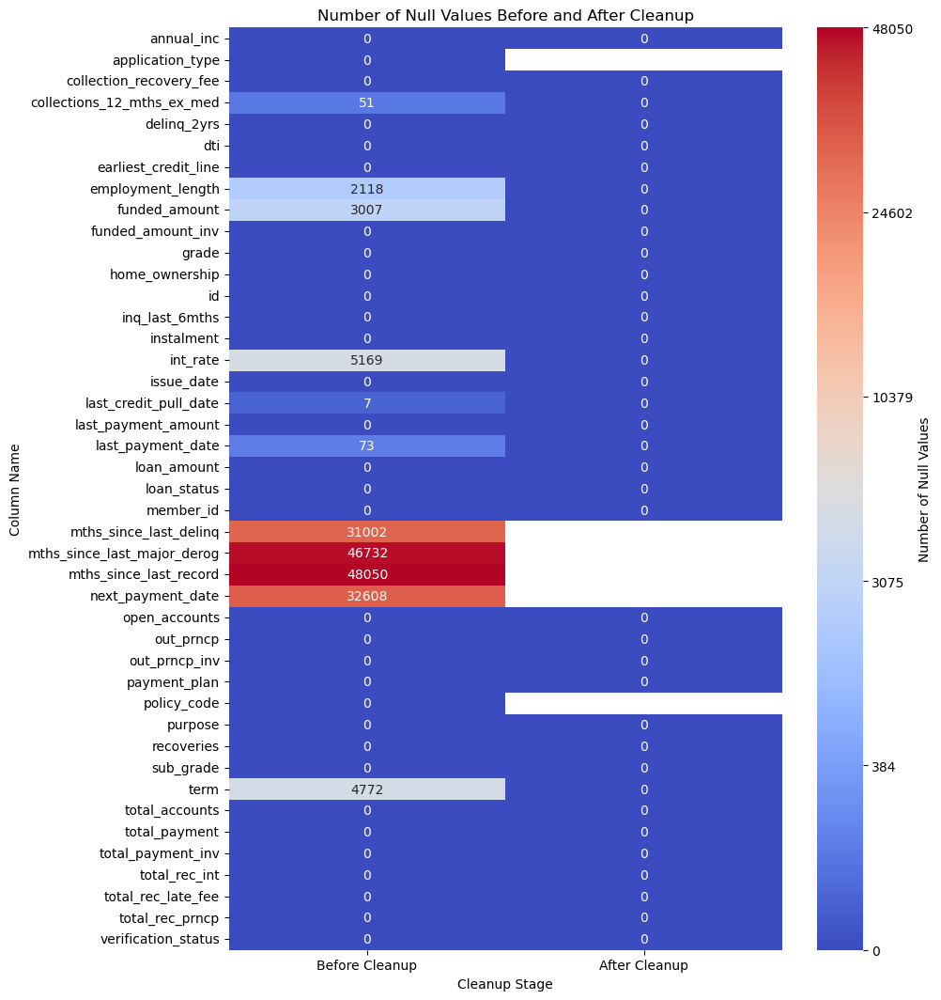

In [14]:
plot.plot_null_values_heatmap(revised_df)

### Nulls Conclusion

From the chart above we can see all null values have been sucessfully removed, we can also see the variables that have been removed entirely due to a too large number of null values. 

### Transformations on Skewed Data

First let's view the histograms and q-q plots again for each column.

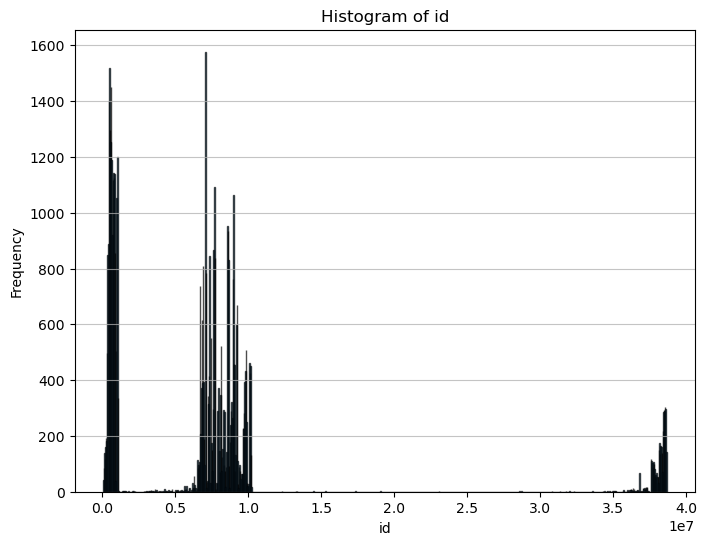

The skew of id column is 2.3702266298371617


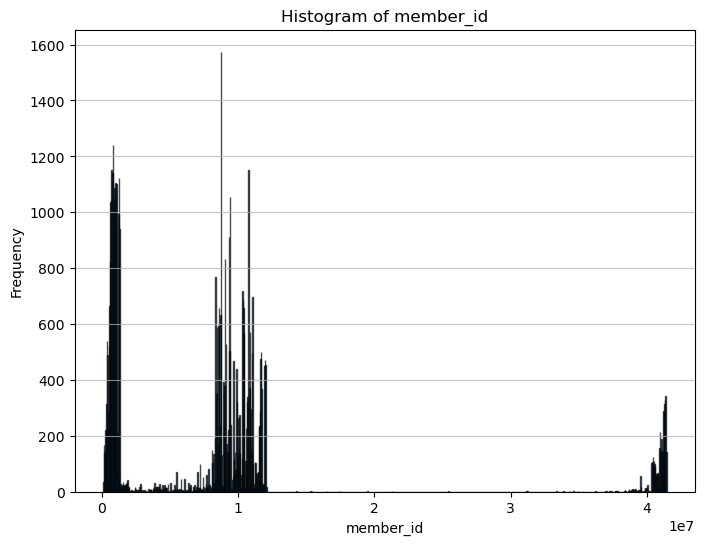

The skew of member_id column is 2.205248048809822


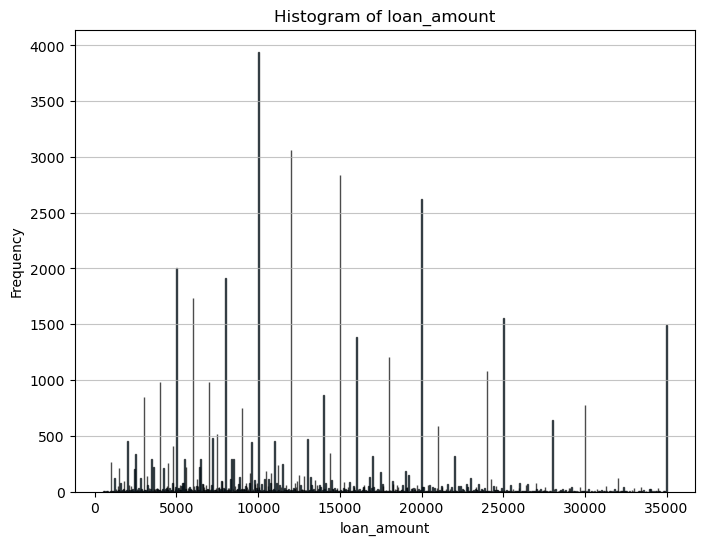

The skew of loan_amount column is 0.8049220181025606


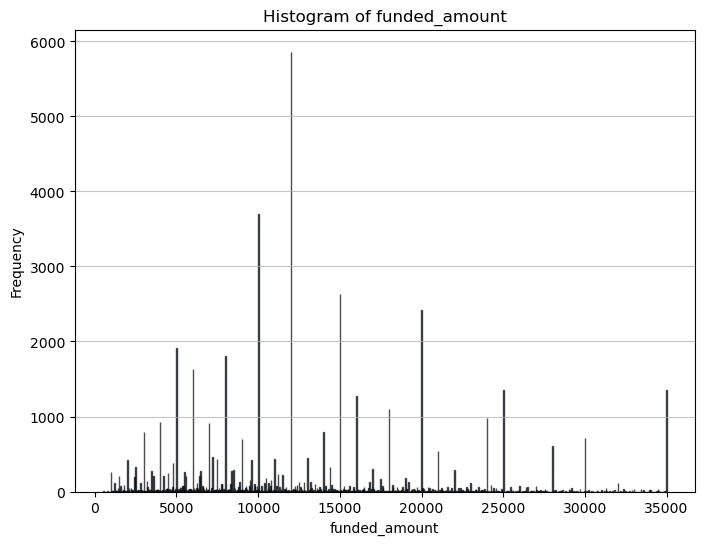

The skew of funded_amount column is 0.8696343258205478


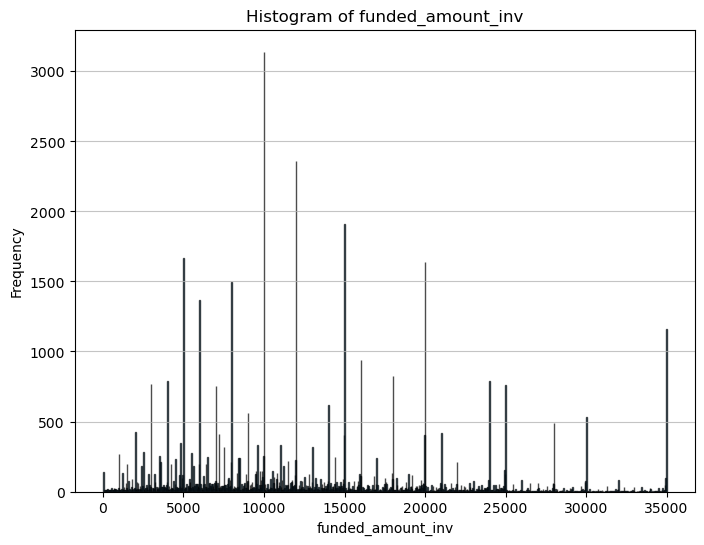

The skew of funded_amount_inv column is 0.8133760847946324


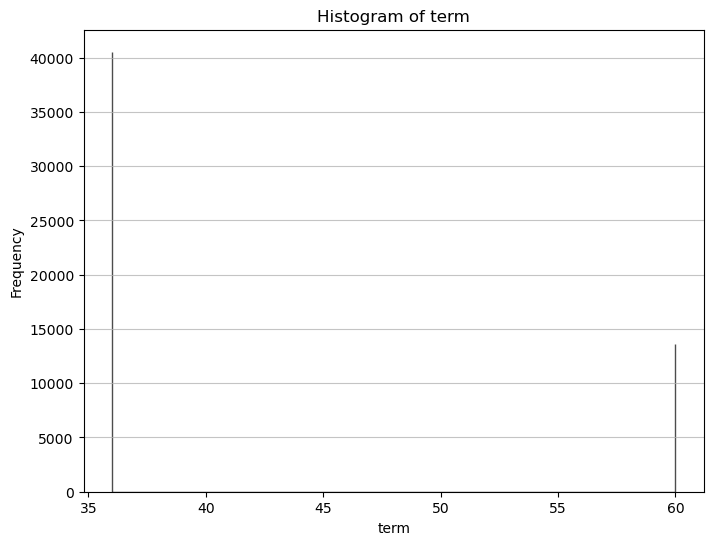

The skew of term column is 1.1477822801014974


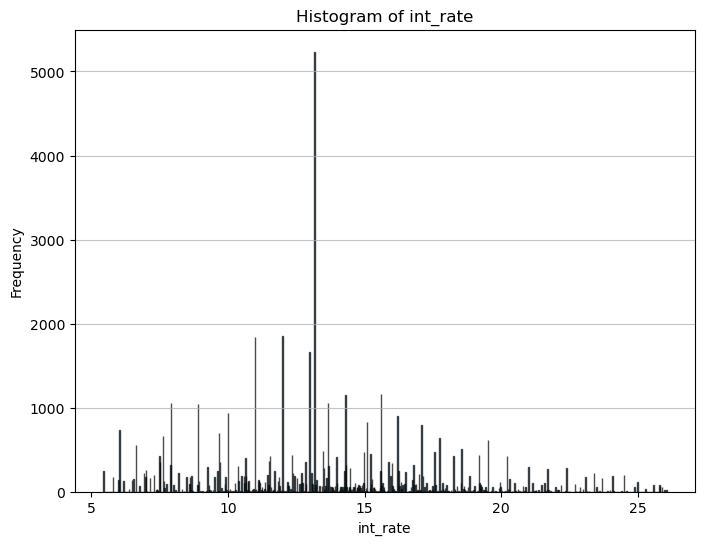

The skew of int_rate column is 0.45661978102982004


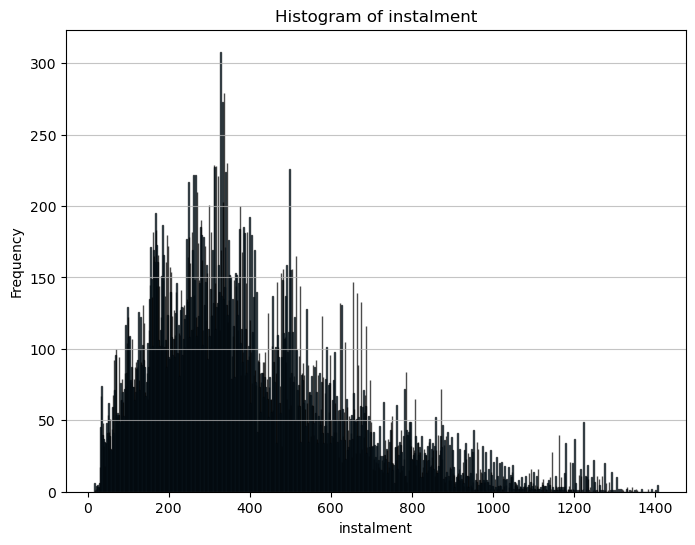

The skew of instalment column is 0.9965721690437305
Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


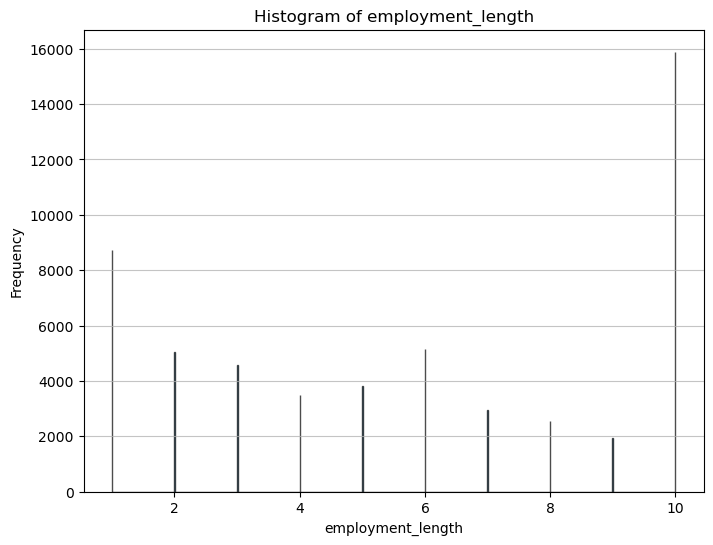

The skew of employment_length column is -0.03950845750136528
Skipping non-numeric column: home_ownership


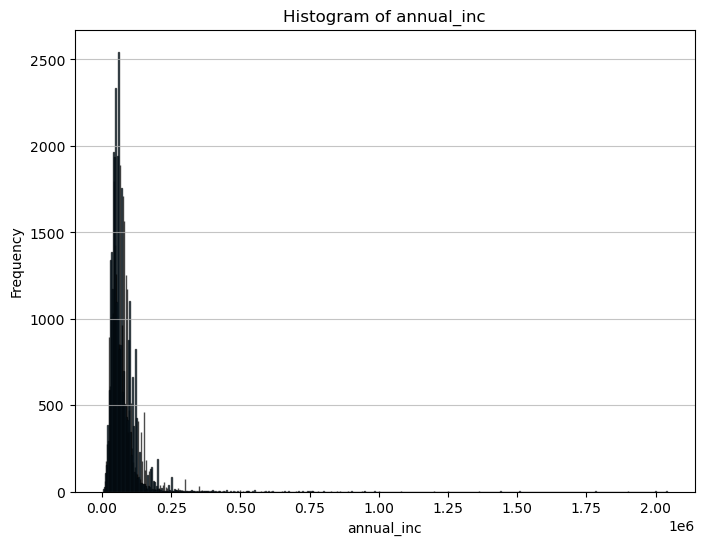

The skew of annual_inc column is 8.717499605870014
Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


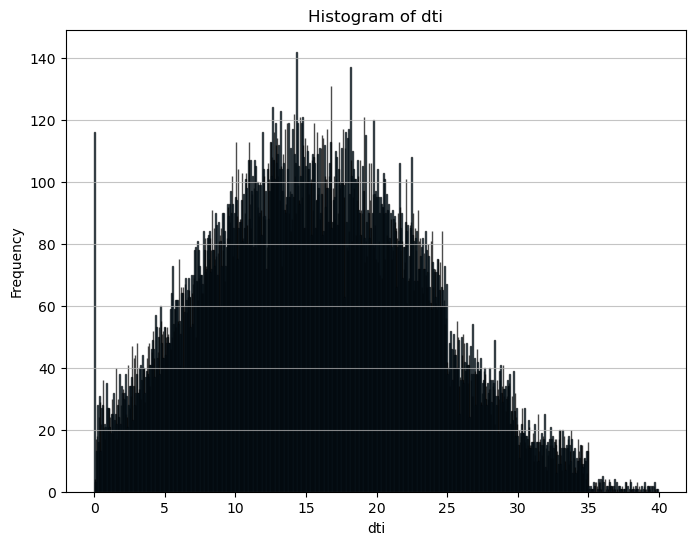

The skew of dti column is 0.18910057534680505


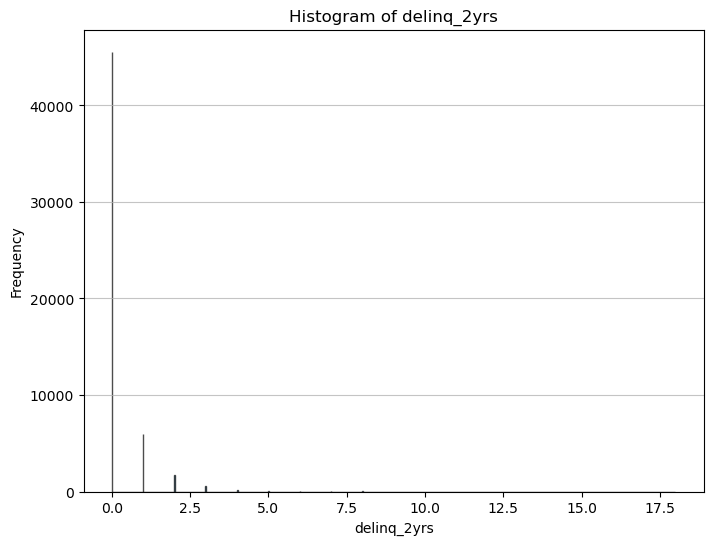

The skew of delinq_2yrs column is 5.376384516017939
Skipping non-numeric column: earliest_credit_line


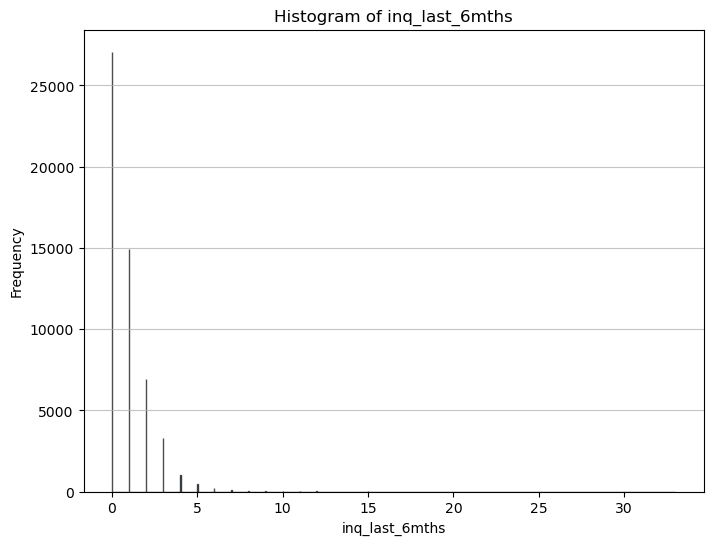

The skew of inq_last_6mths column is 3.253522804381087


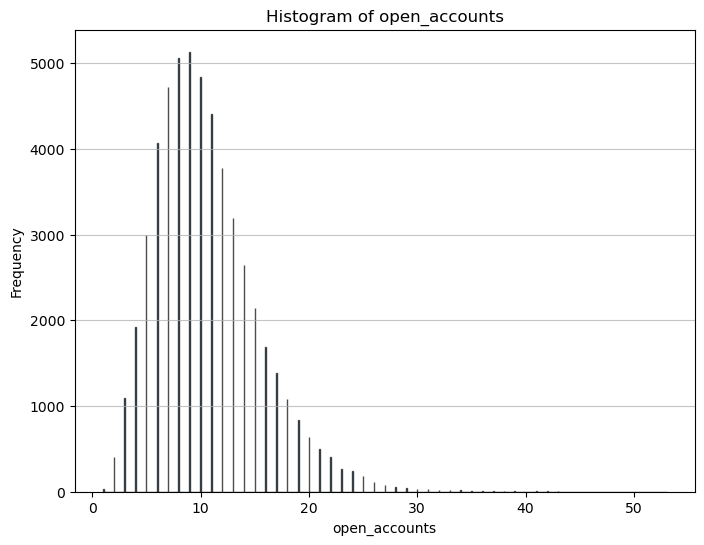

The skew of open_accounts column is 1.0591835802494733


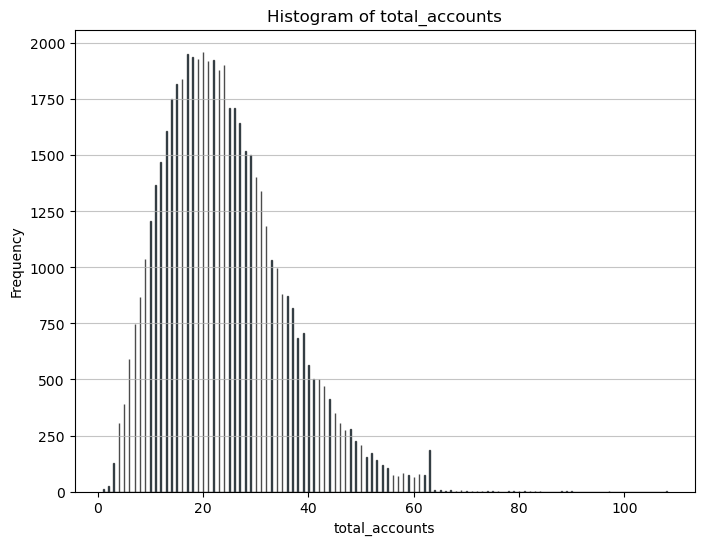

The skew of total_accounts column is 0.7790400286166349


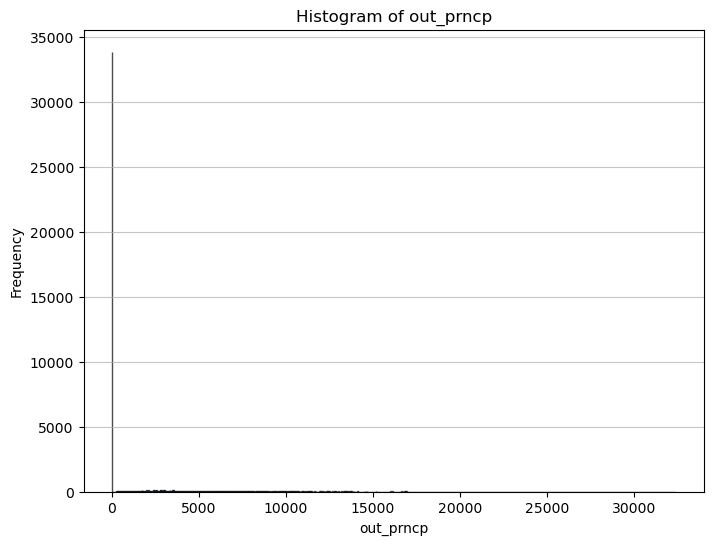

The skew of out_prncp column is 2.35405079479137


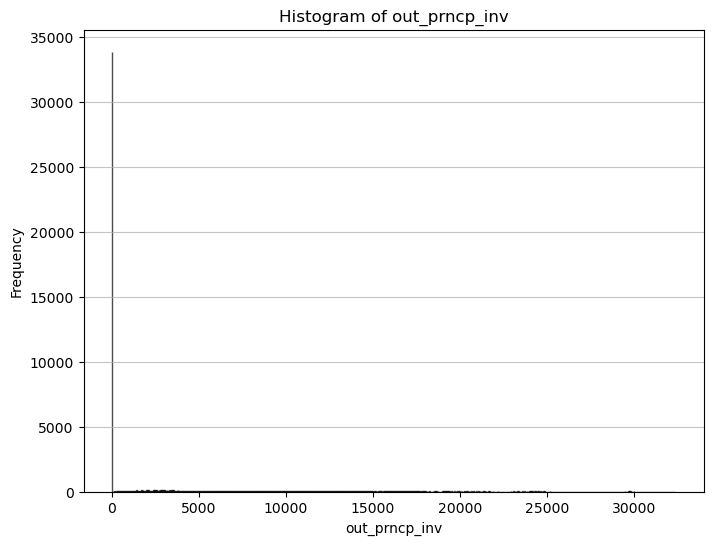

The skew of out_prncp_inv column is 2.354471408893565


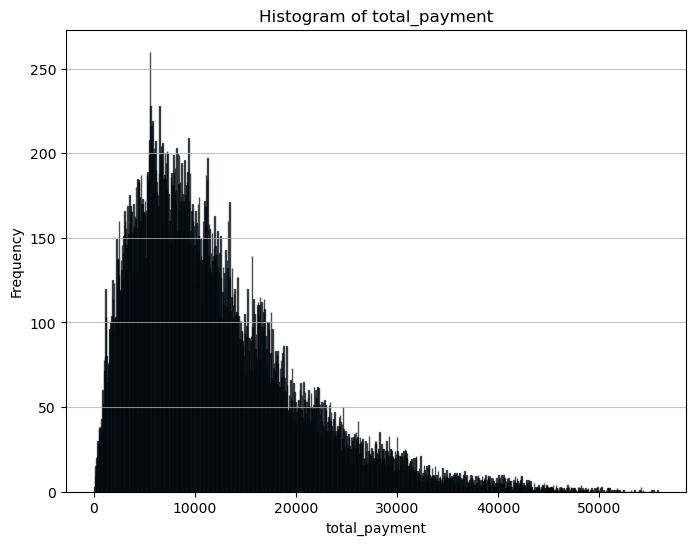

The skew of total_payment column is 1.2698752968451772


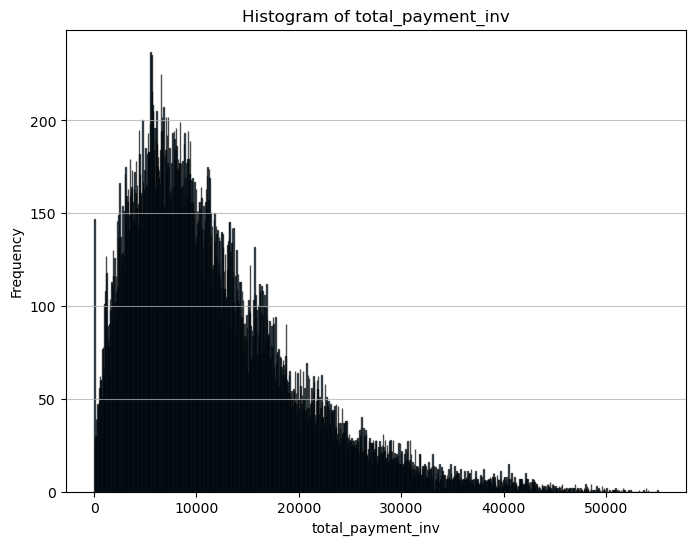

The skew of total_payment_inv column is 1.257870048149293


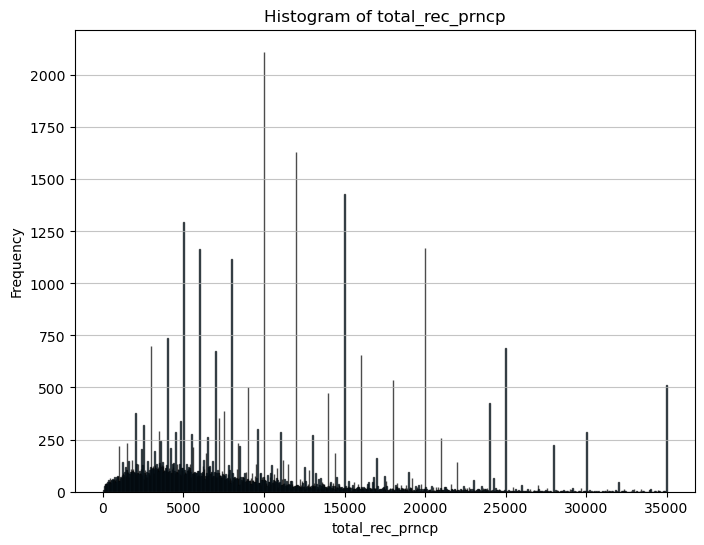

The skew of total_rec_prncp column is 1.2626785390807123


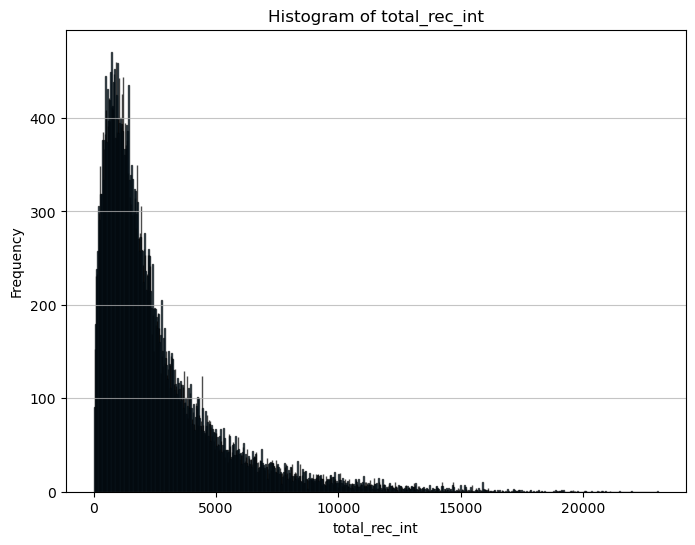

The skew of total_rec_int column is 2.2045848938701638


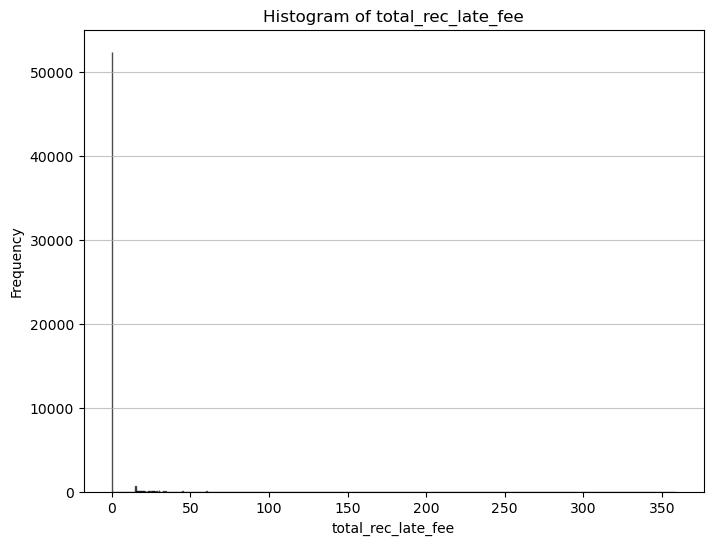

The skew of total_rec_late_fee column is 13.174553220535644


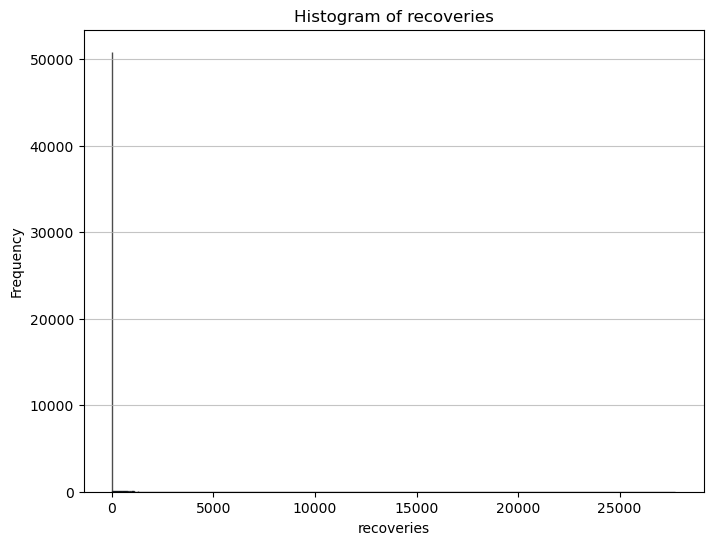

The skew of recoveries column is 14.389298686317593


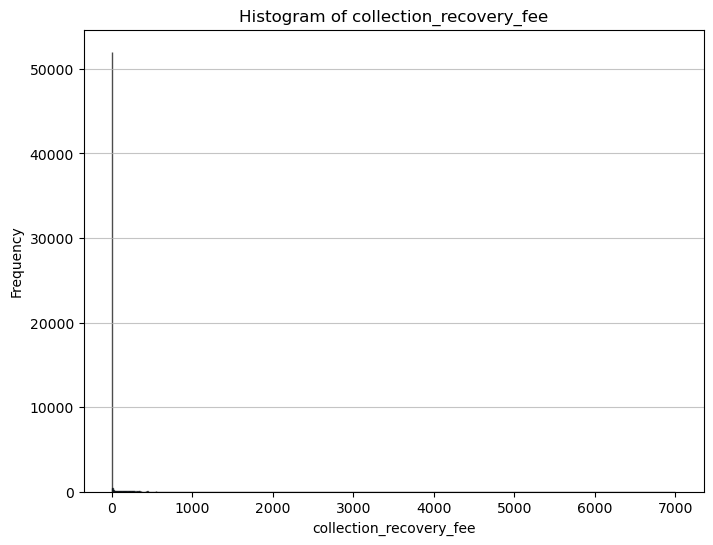

The skew of collection_recovery_fee column is 27.807754340152847
Skipping non-numeric column: last_payment_date


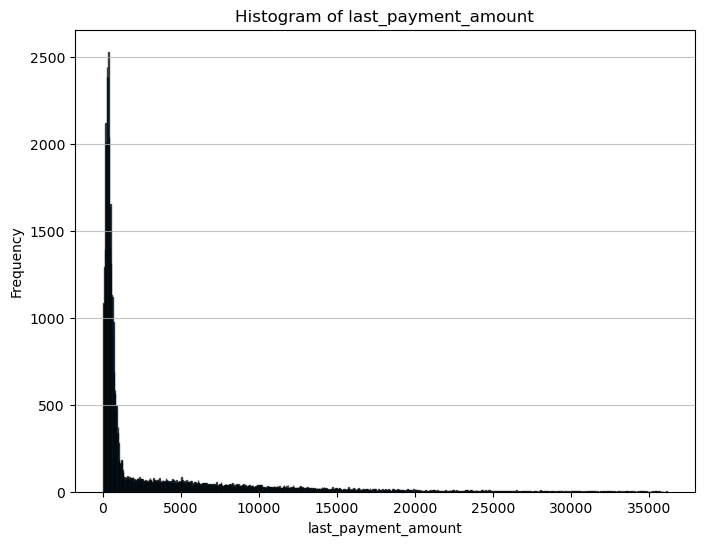

The skew of last_payment_amount column is 2.4972203995928135
Skipping non-numeric column: last_credit_pull_date


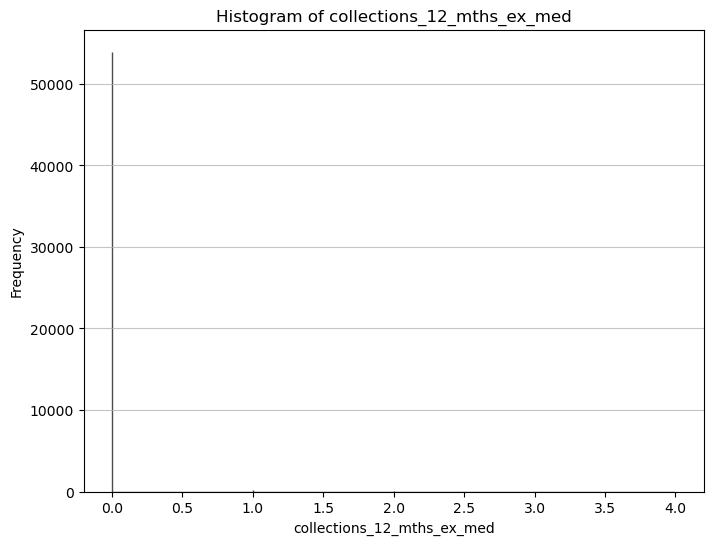

The skew of collections_12_mths_ex_med column is 20.307695011511576


In [15]:
plot=Plotter(revised_df)

plot.histogram()

<Figure size 800x600 with 0 Axes>

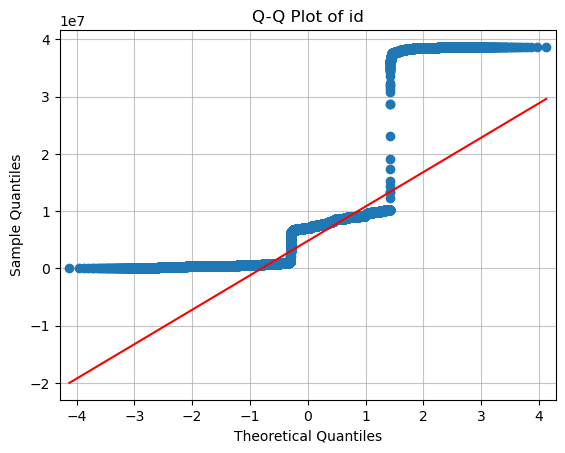

<Figure size 800x600 with 0 Axes>

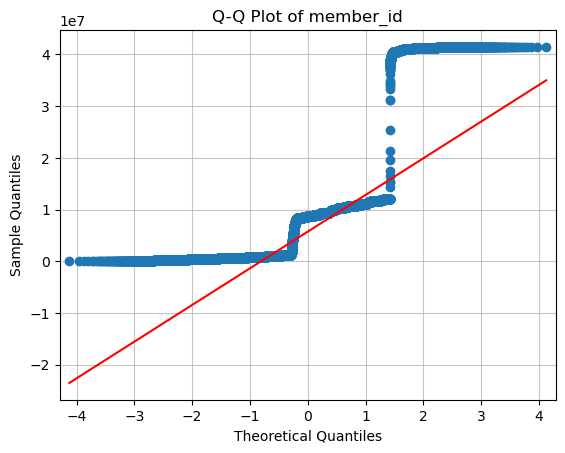

<Figure size 800x600 with 0 Axes>

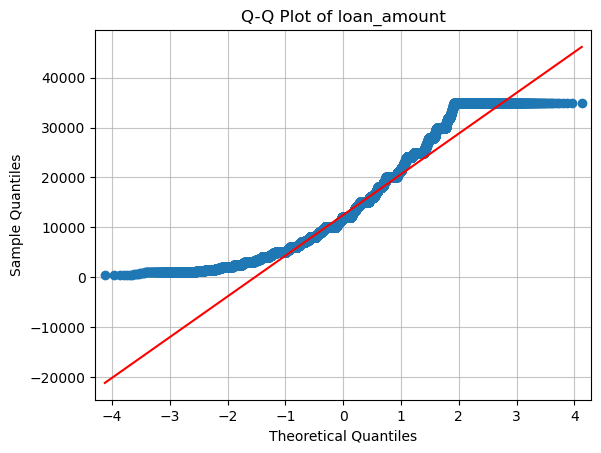

<Figure size 800x600 with 0 Axes>

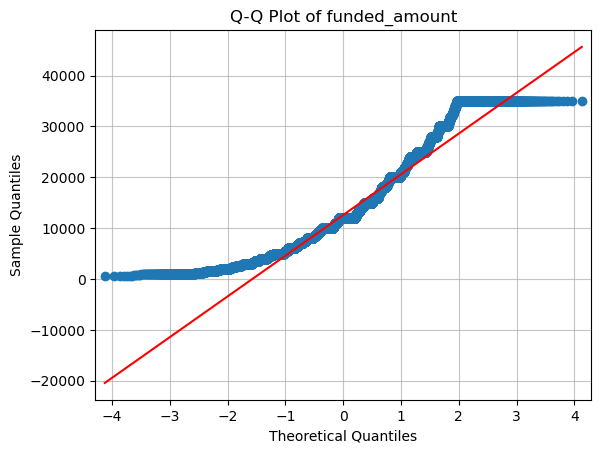

<Figure size 800x600 with 0 Axes>

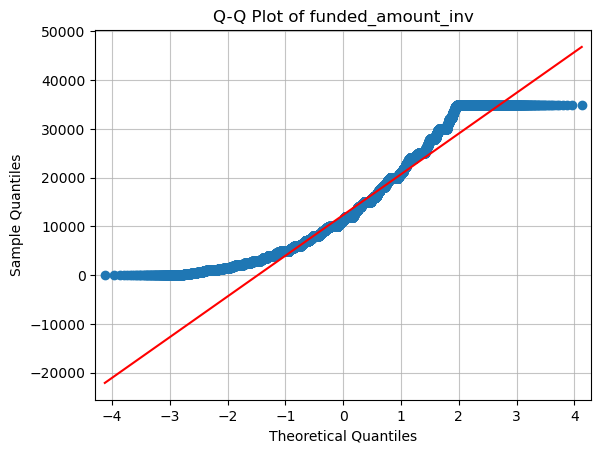

<Figure size 800x600 with 0 Axes>

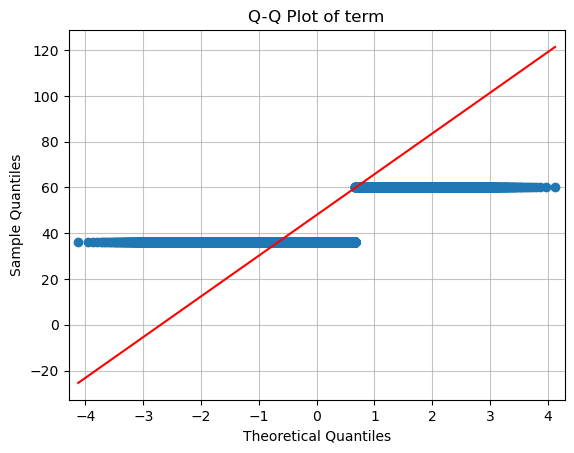

<Figure size 800x600 with 0 Axes>

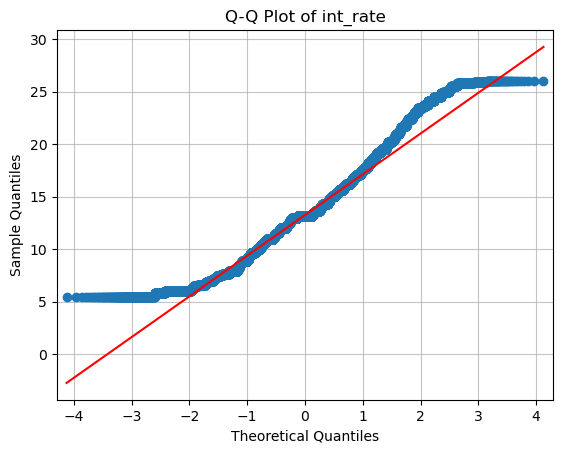

<Figure size 800x600 with 0 Axes>

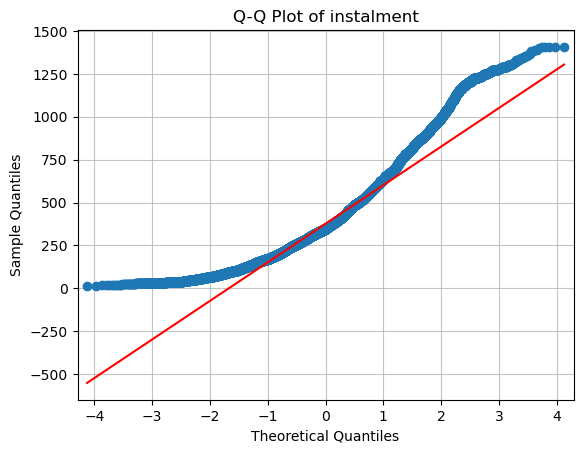

Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


<Figure size 800x600 with 0 Axes>

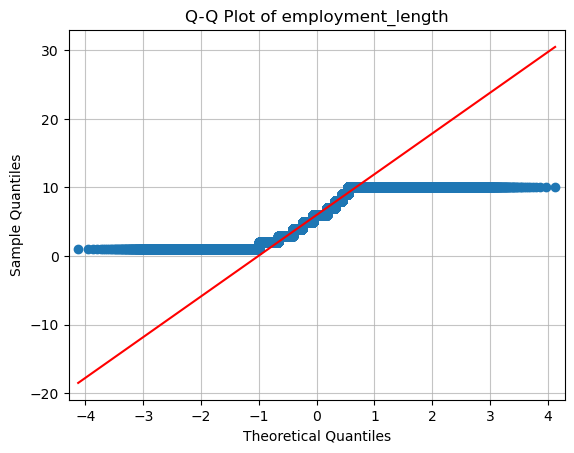

Skipping non-numeric column: home_ownership


<Figure size 800x600 with 0 Axes>

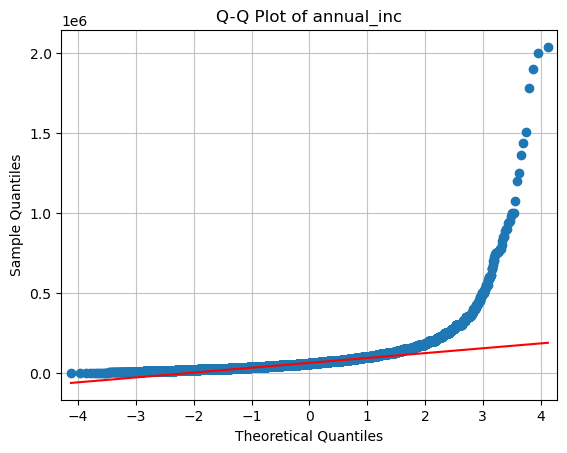

Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


<Figure size 800x600 with 0 Axes>

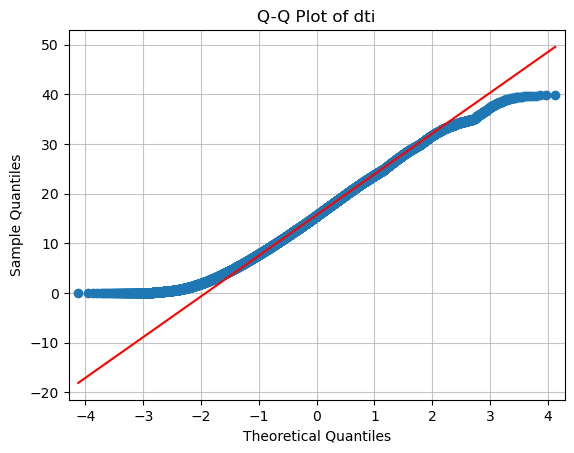

<Figure size 800x600 with 0 Axes>

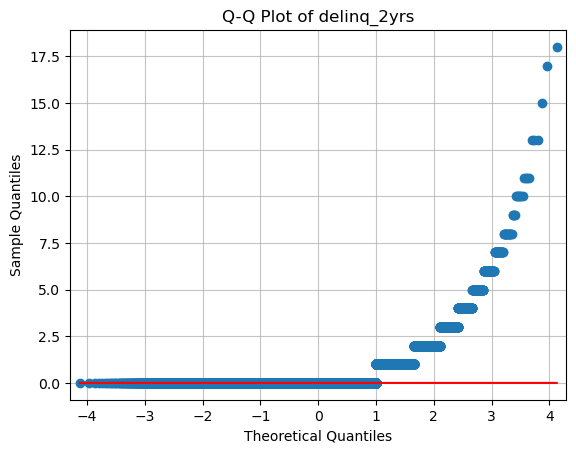

Skipping non-numeric column: earliest_credit_line


<Figure size 800x600 with 0 Axes>

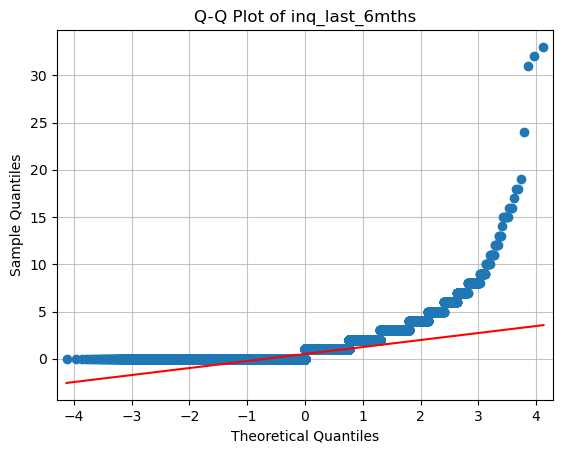

<Figure size 800x600 with 0 Axes>

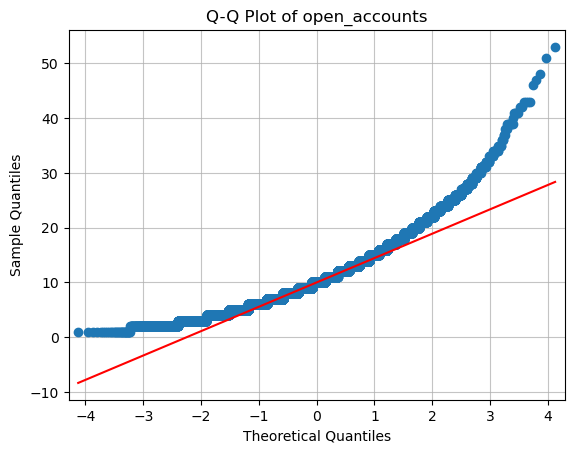

<Figure size 800x600 with 0 Axes>

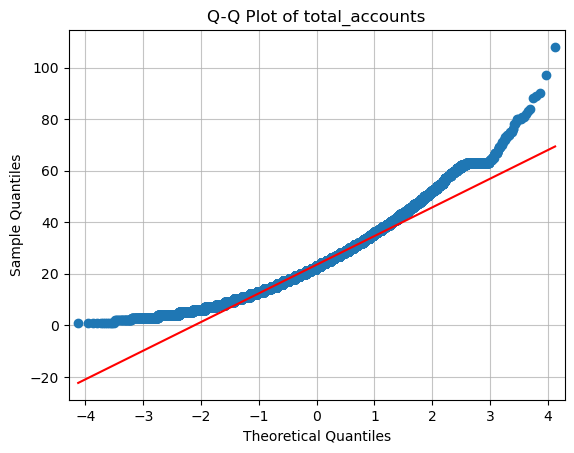

<Figure size 800x600 with 0 Axes>

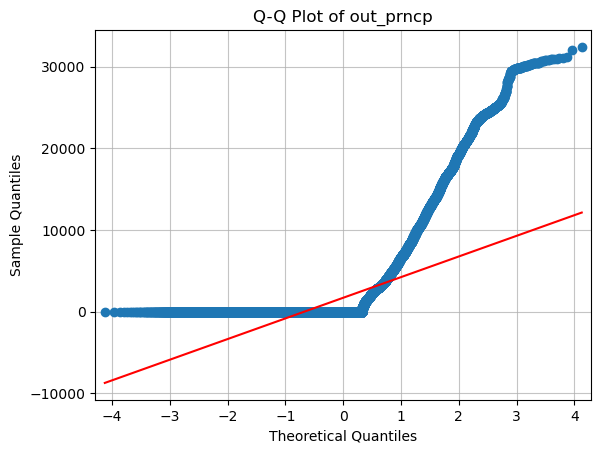

<Figure size 800x600 with 0 Axes>

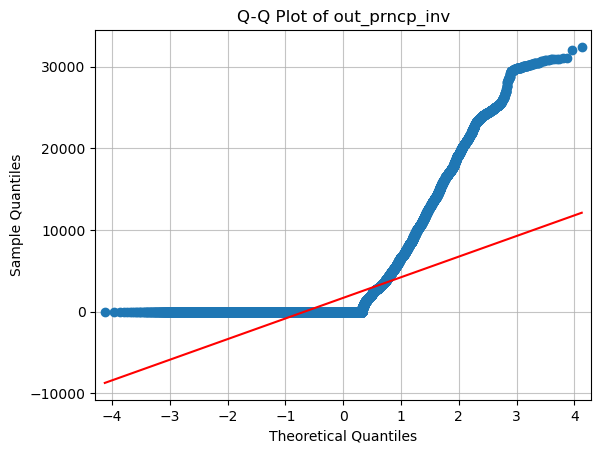

<Figure size 800x600 with 0 Axes>

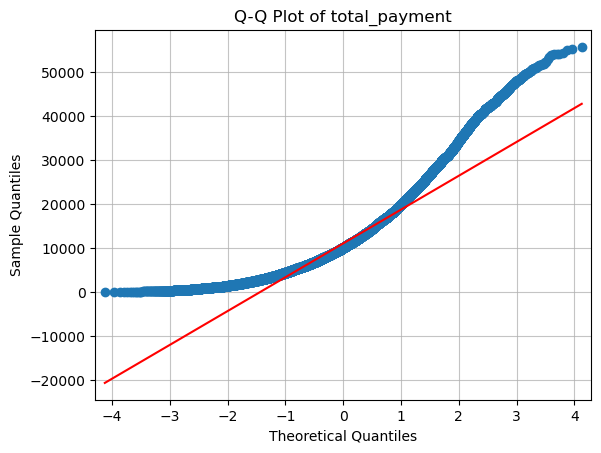

<Figure size 800x600 with 0 Axes>

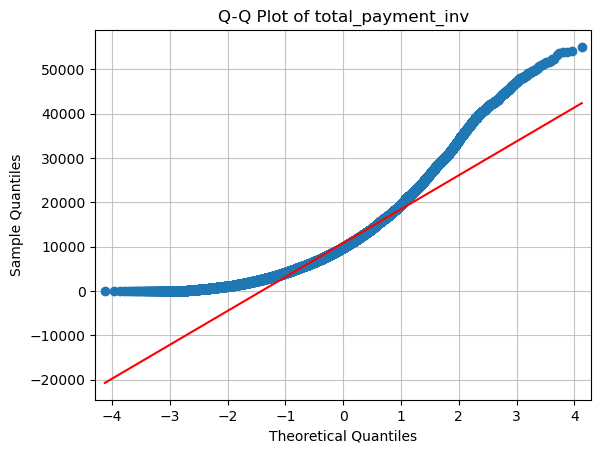

<Figure size 800x600 with 0 Axes>

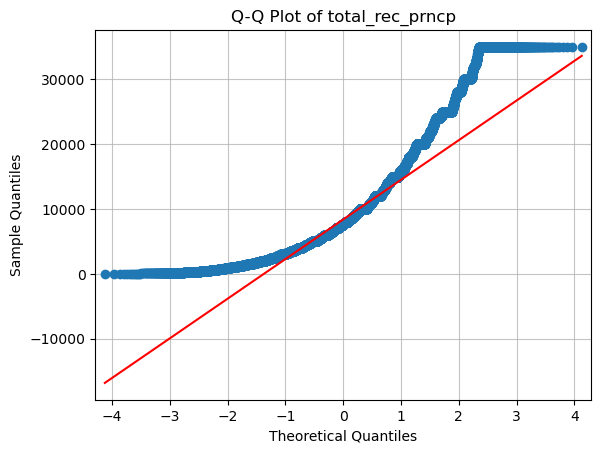

<Figure size 800x600 with 0 Axes>

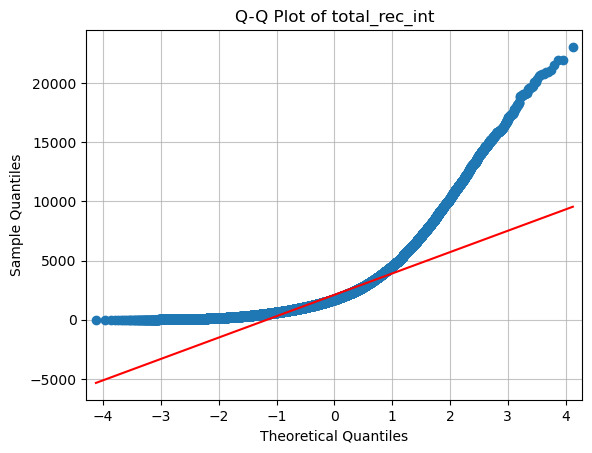

<Figure size 800x600 with 0 Axes>

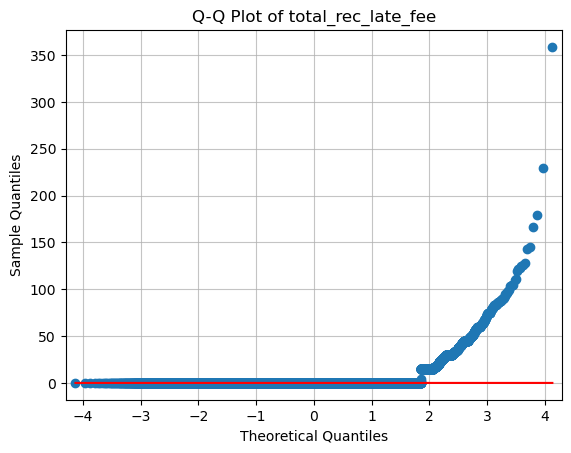

<Figure size 800x600 with 0 Axes>

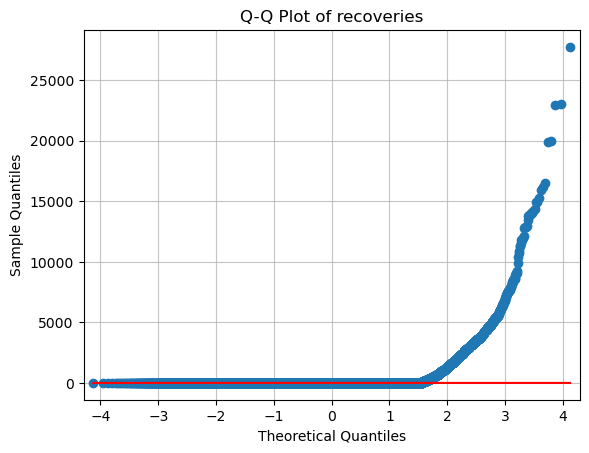

<Figure size 800x600 with 0 Axes>

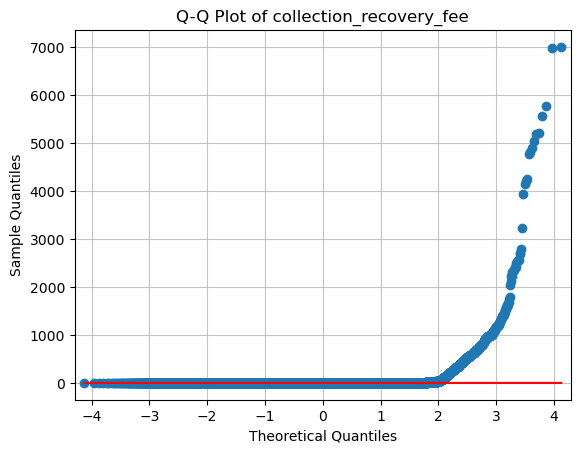

Skipping non-numeric column: last_payment_date


<Figure size 800x600 with 0 Axes>

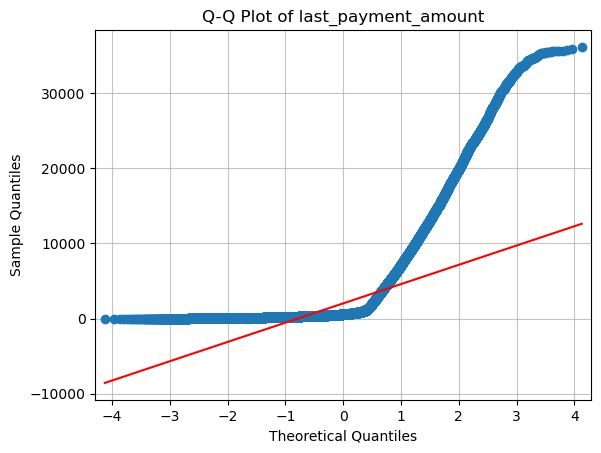

Skipping non-numeric column: last_credit_pull_date


<Figure size 800x600 with 0 Axes>

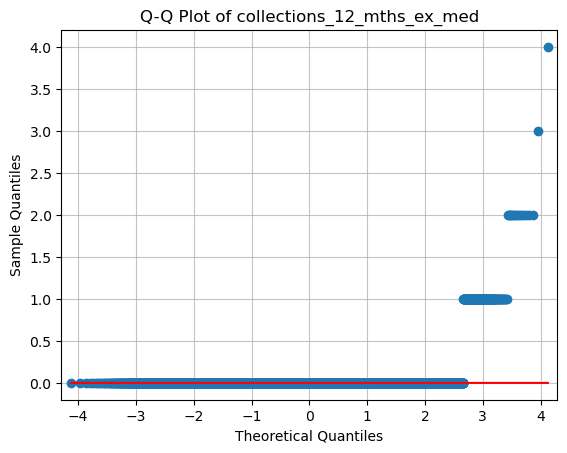

In [16]:
plot.q_q_plot()

From what we can see most columns have positive skew. Let's apply try different methods of correcting the skew and plots the graphs comparing the results.

Comparing transformations for column: id


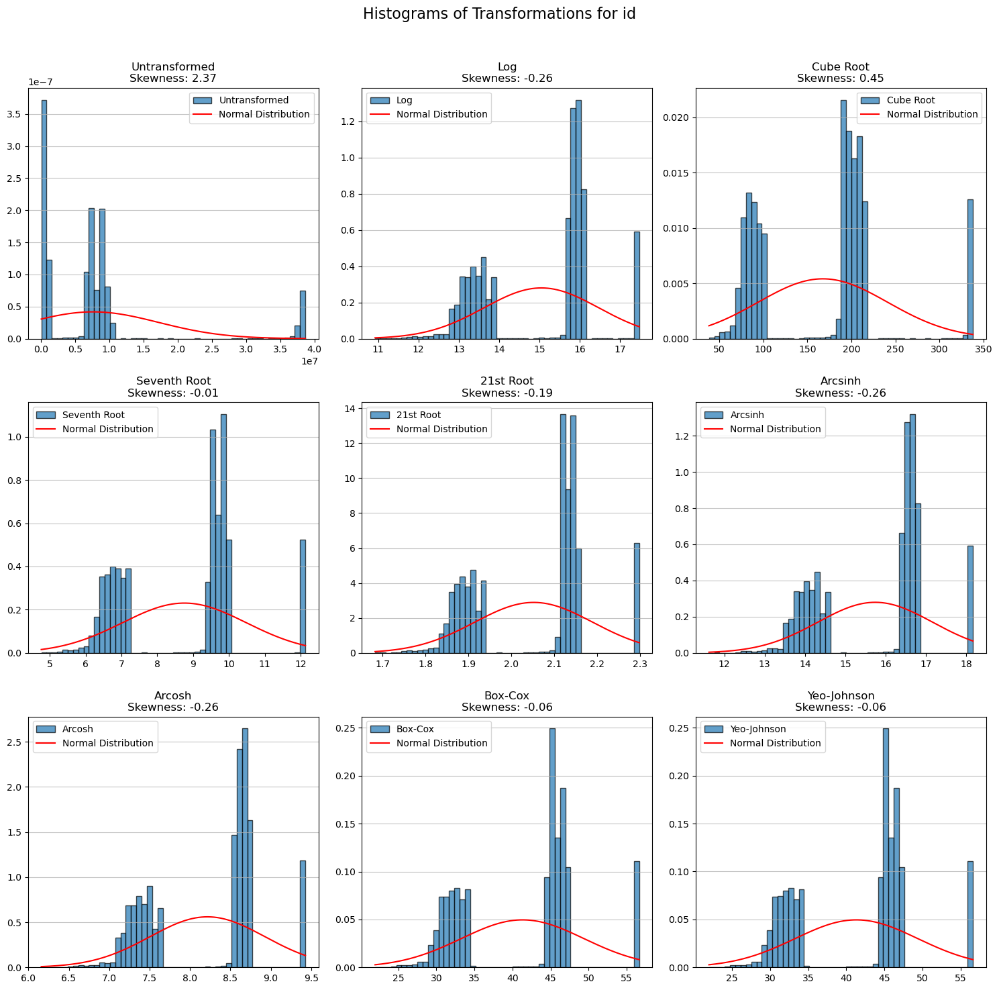

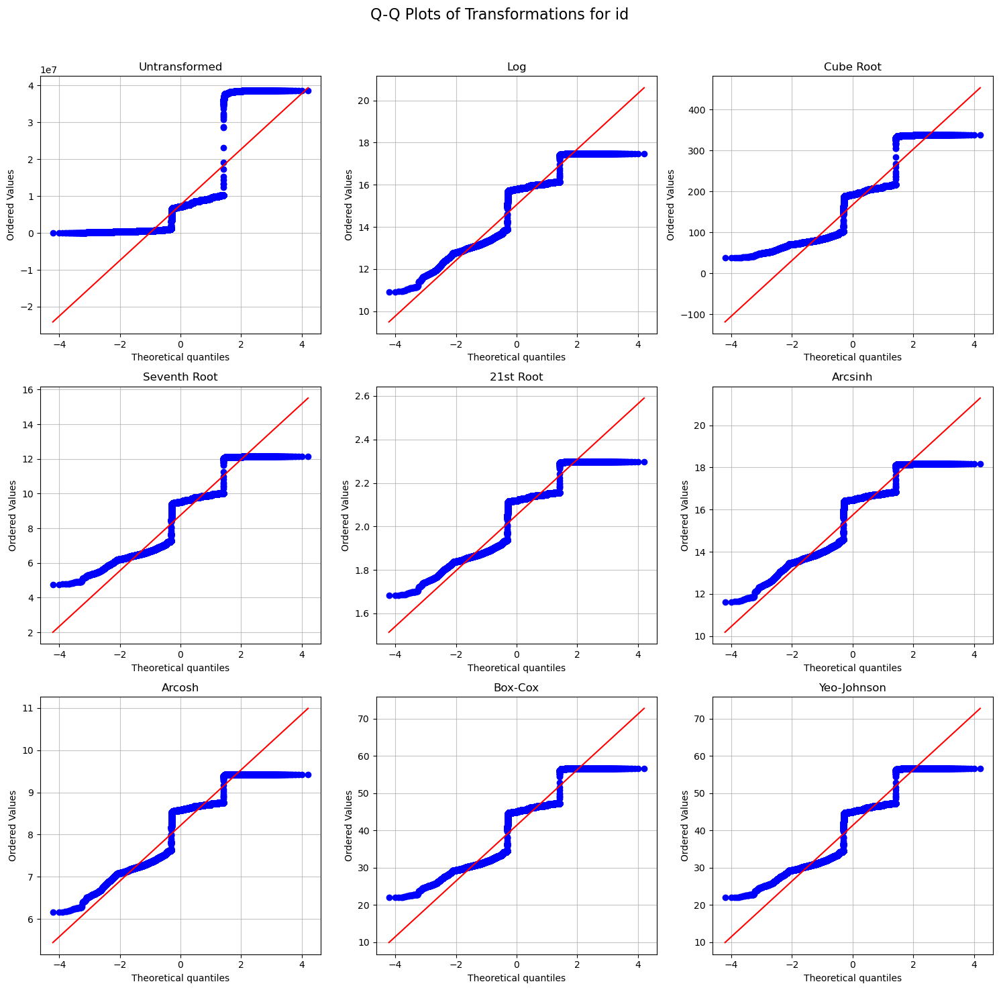

Comparing transformations for column: member_id


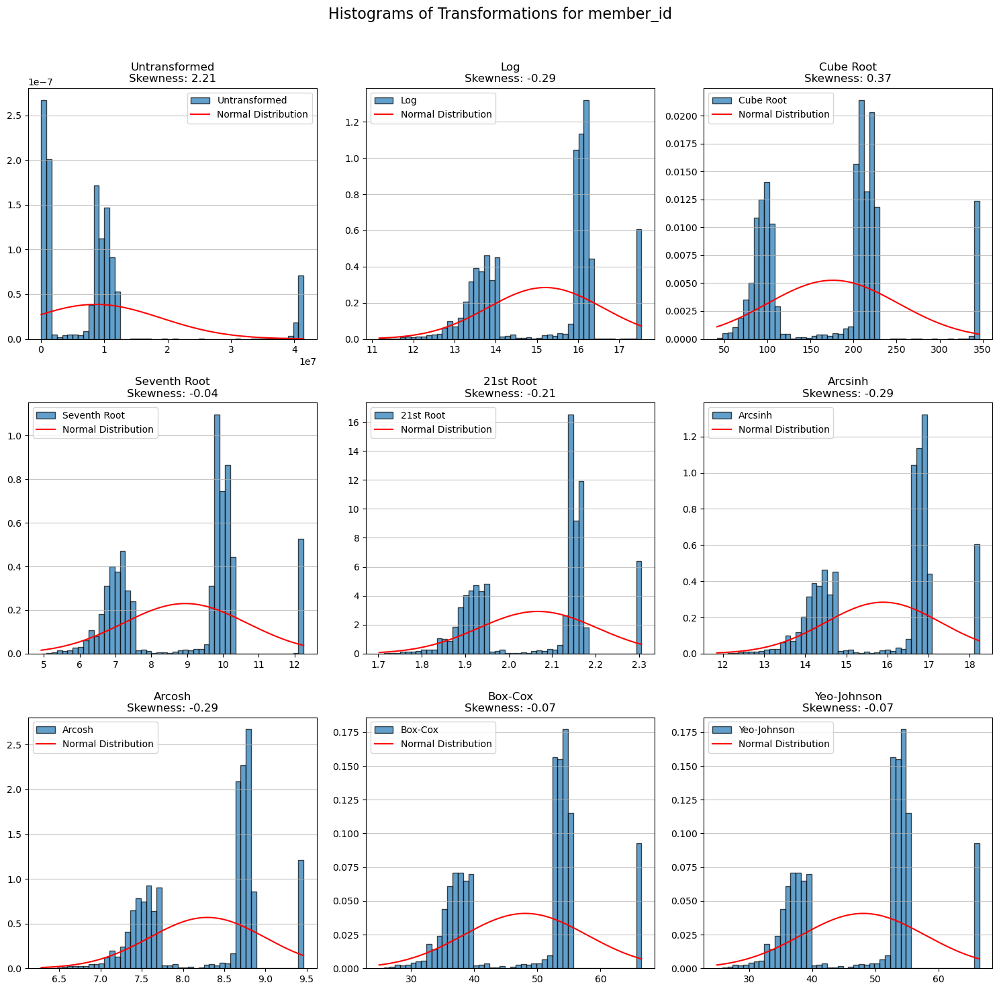

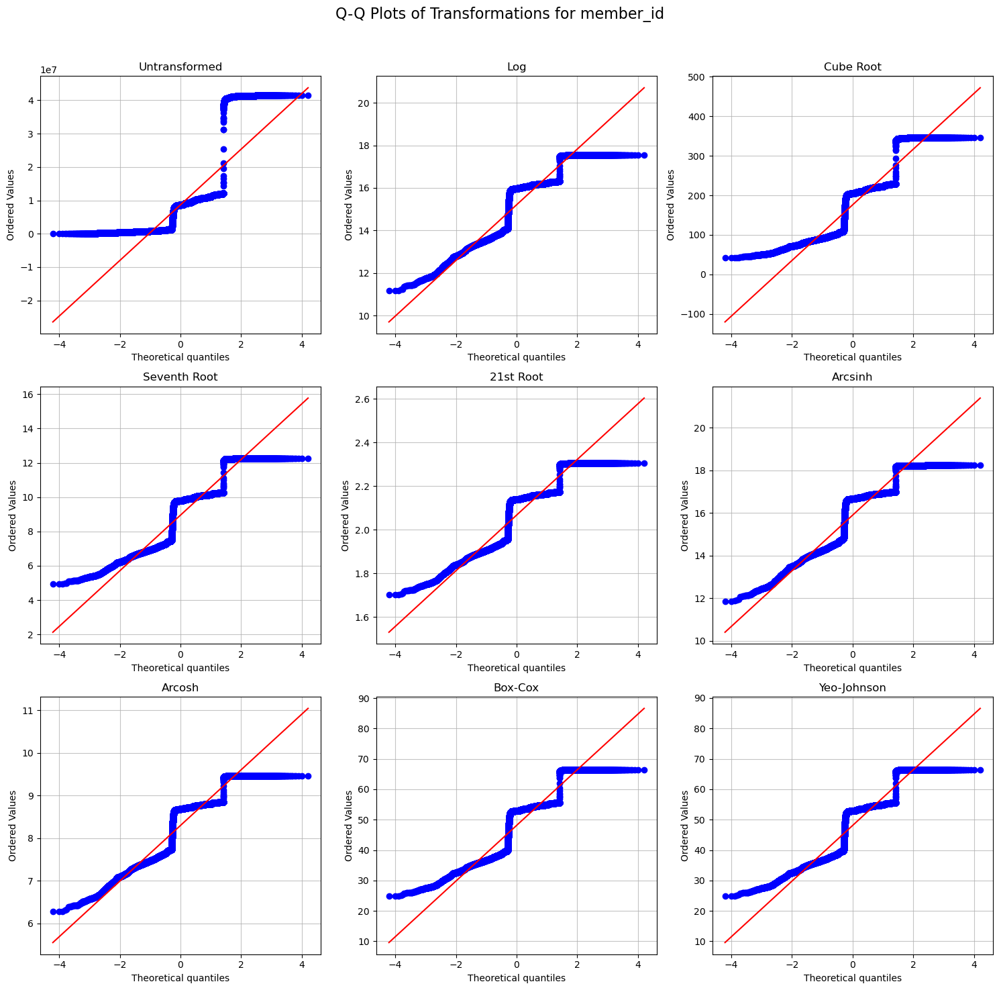

Comparing transformations for column: loan_amount


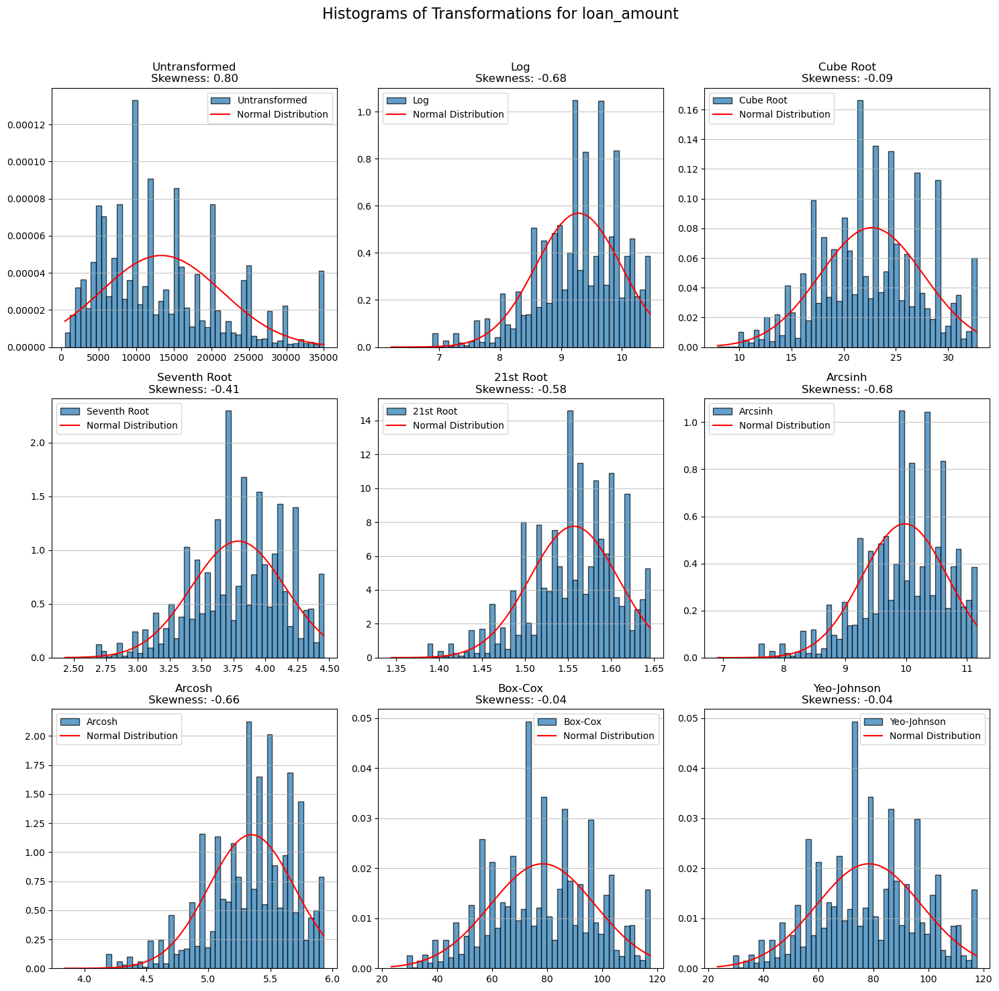

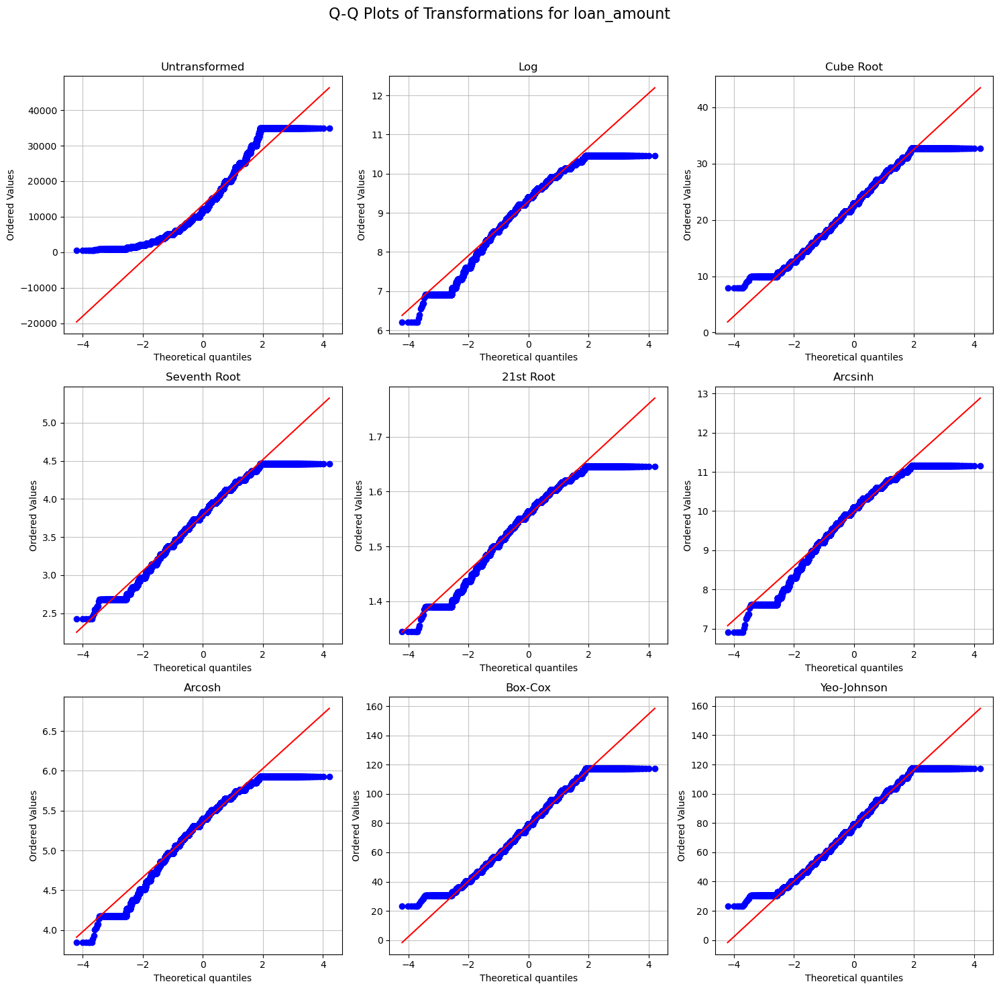

Comparing transformations for column: funded_amount


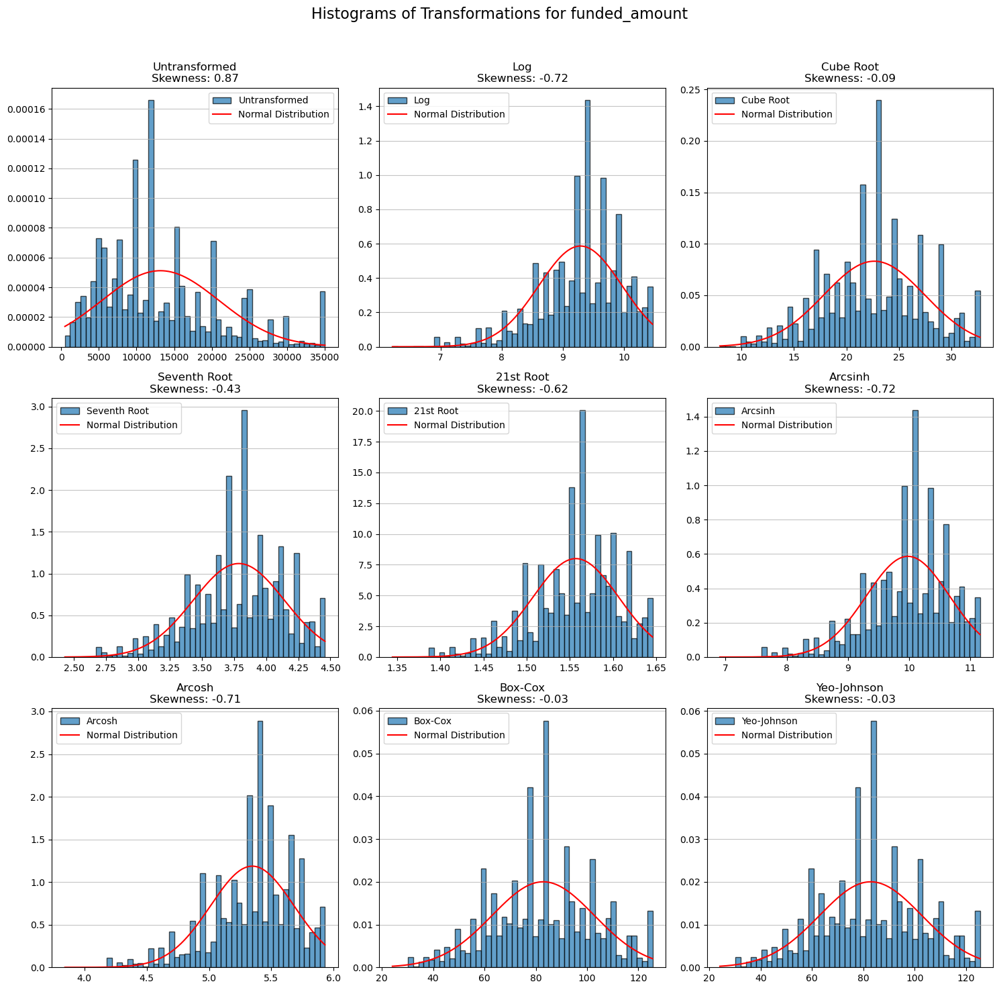

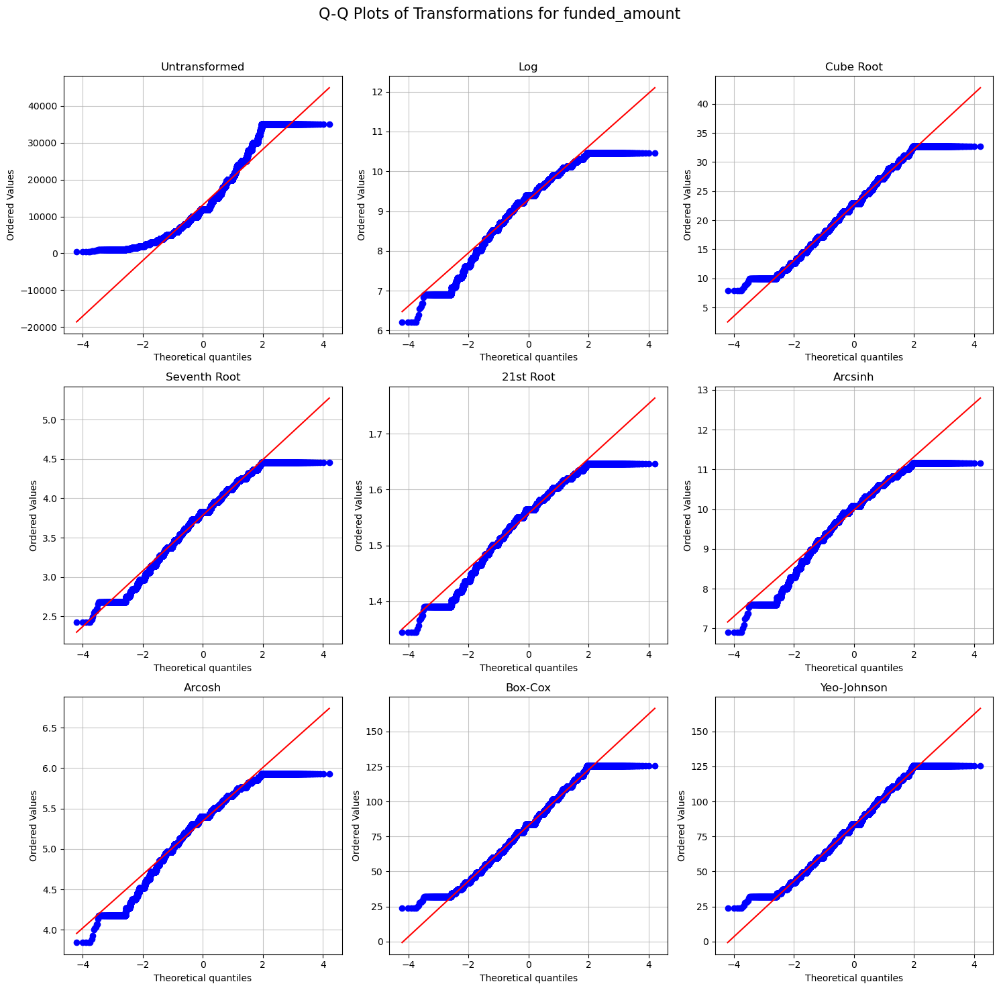

Comparing transformations for column: funded_amount_inv


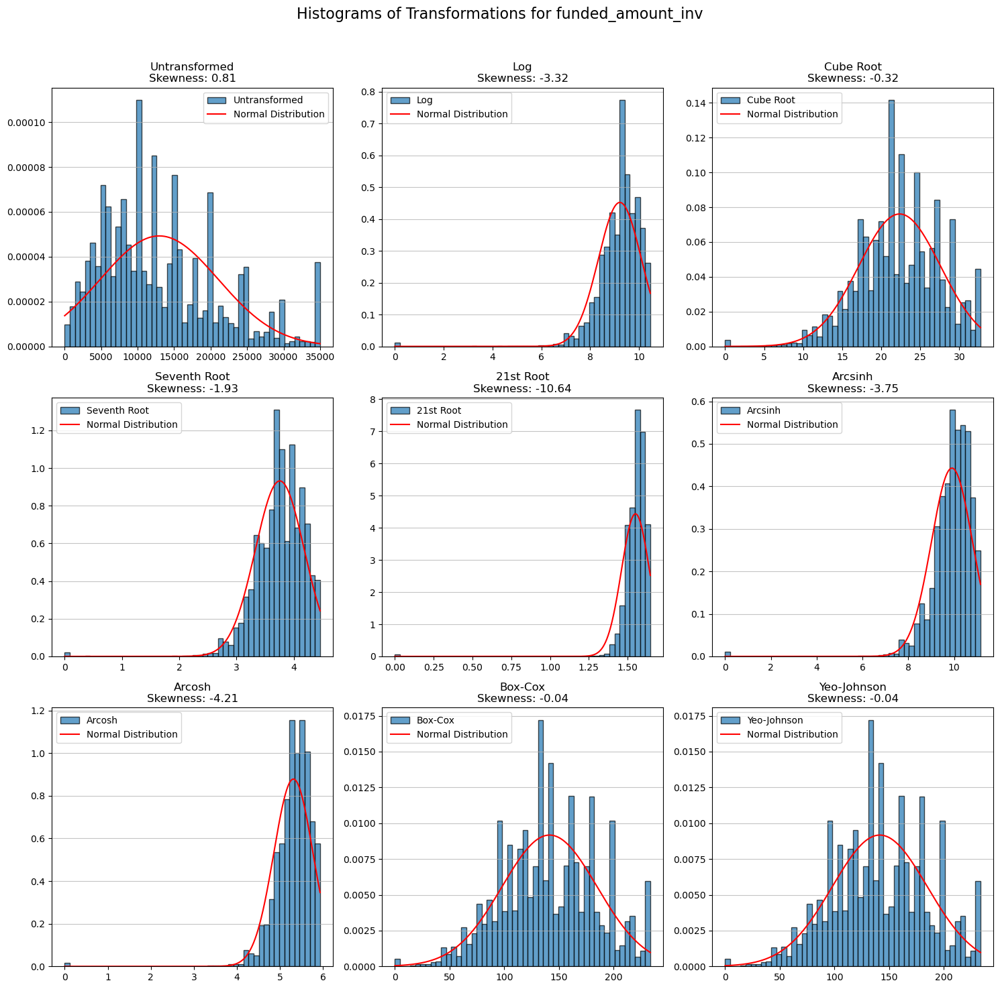

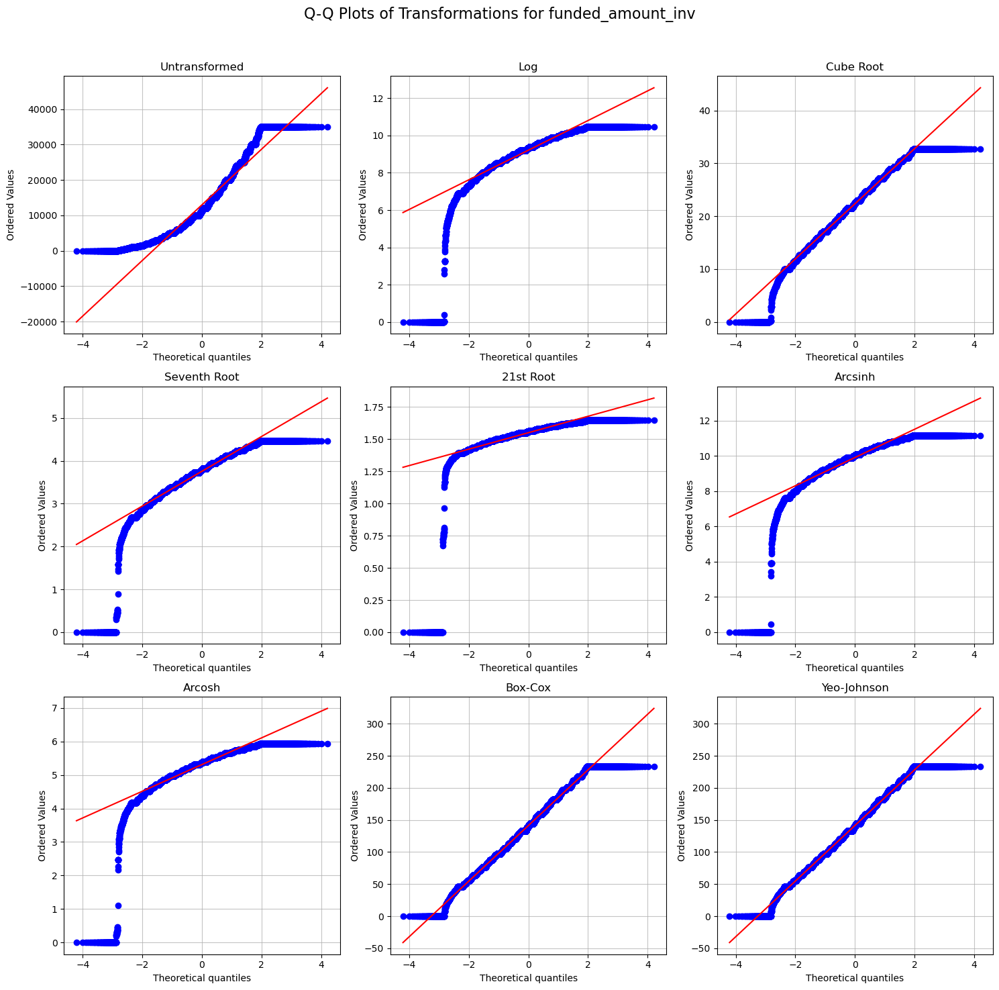

Comparing transformations for column: term


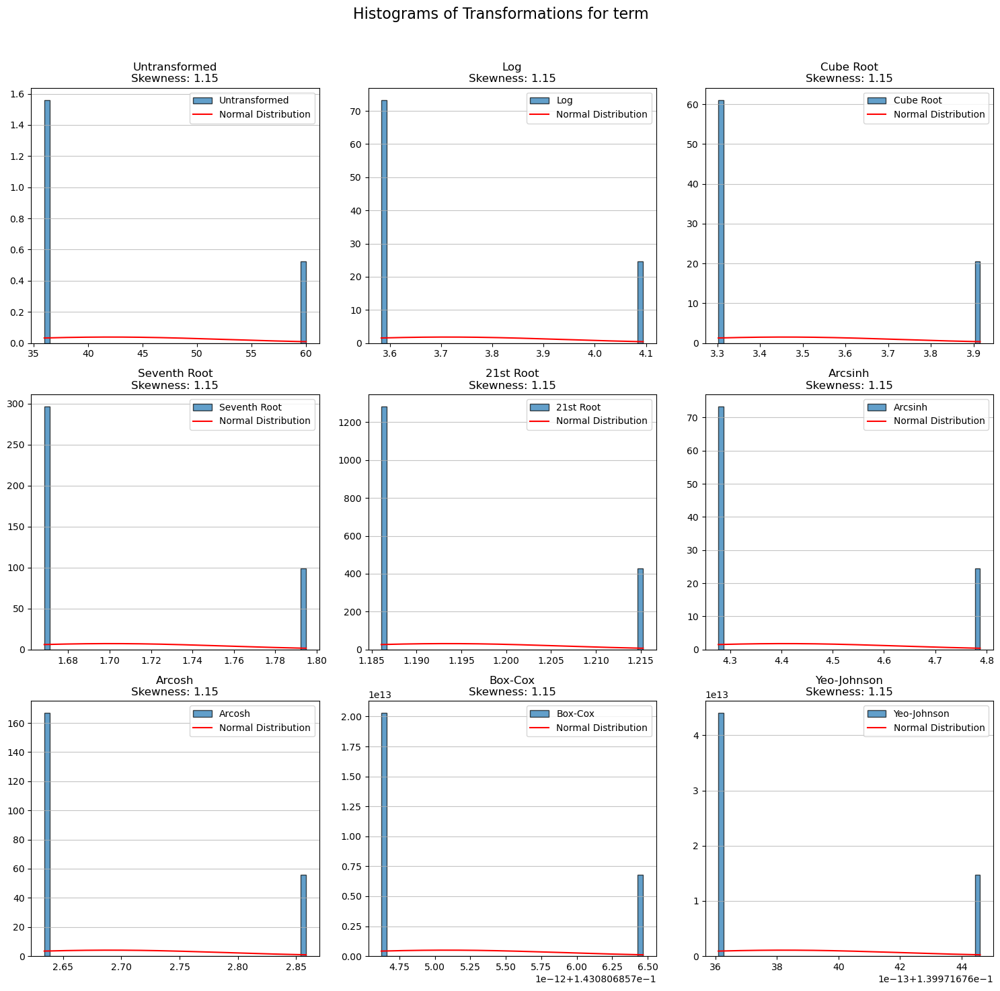

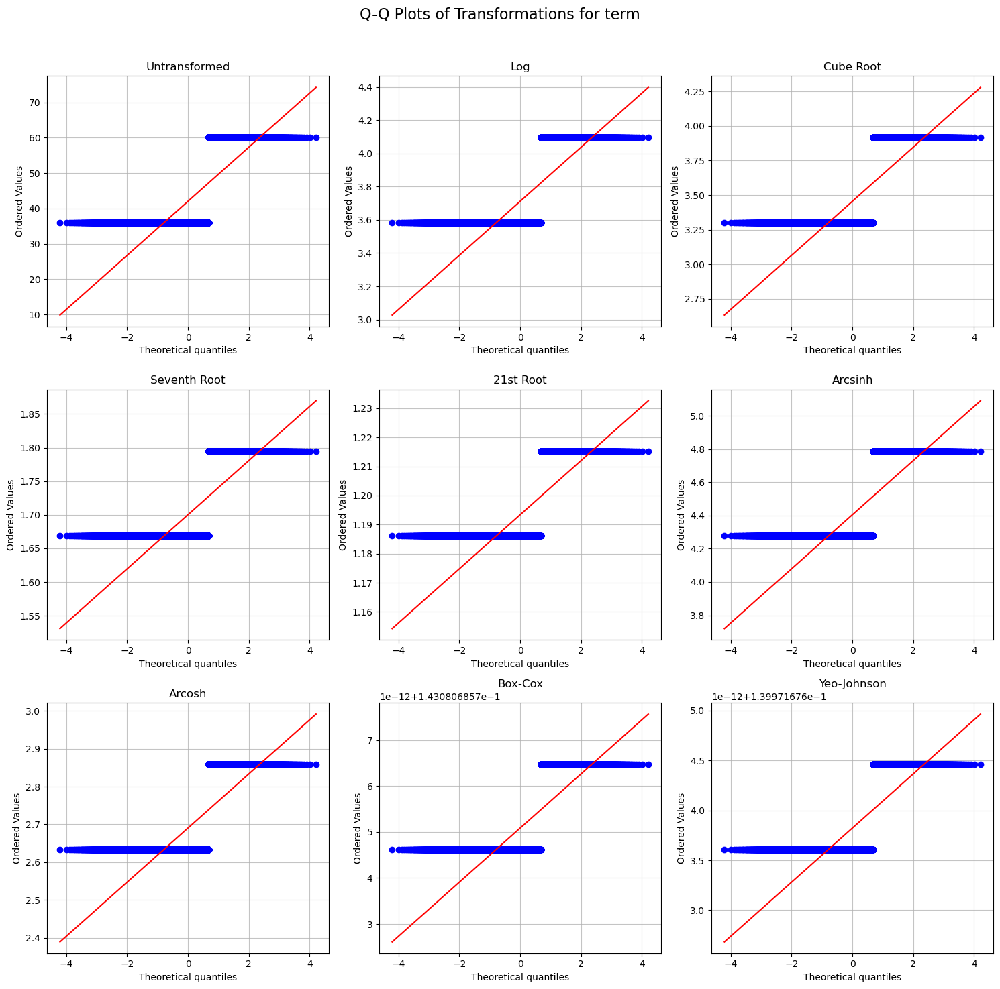

Comparing transformations for column: int_rate


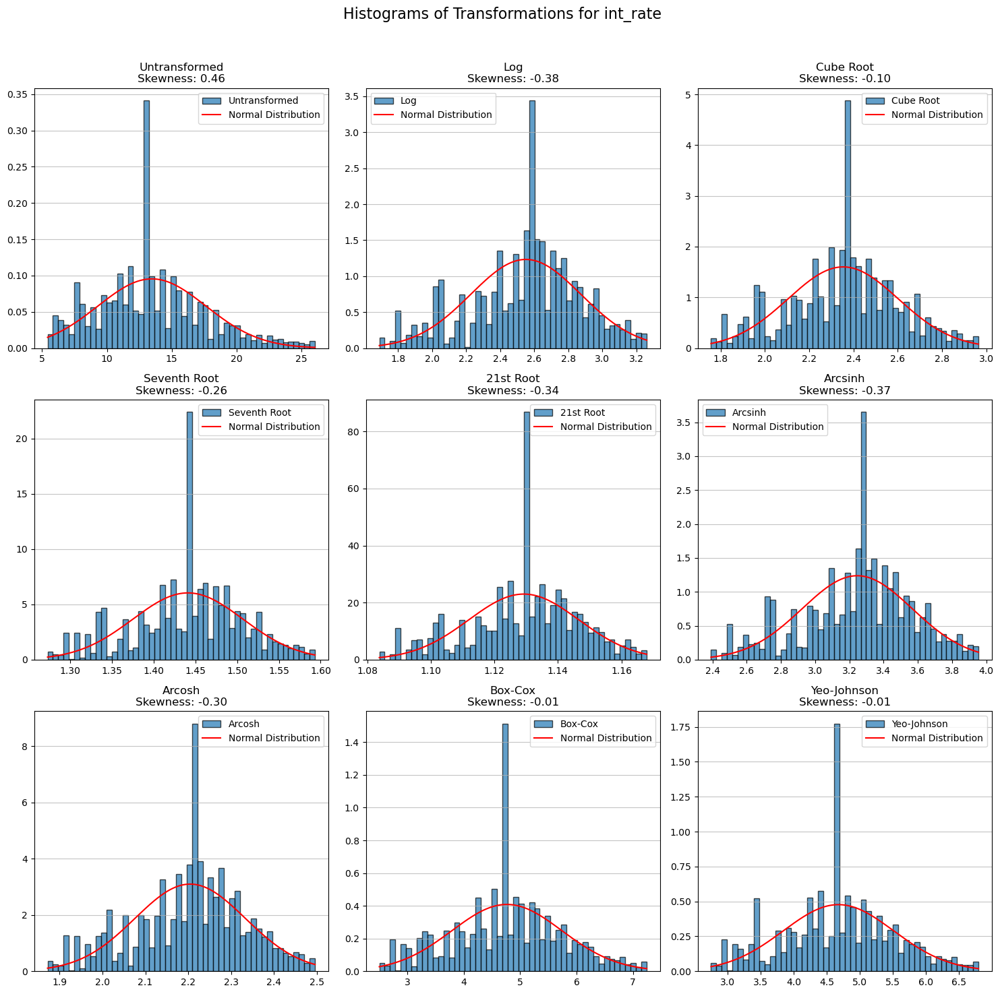

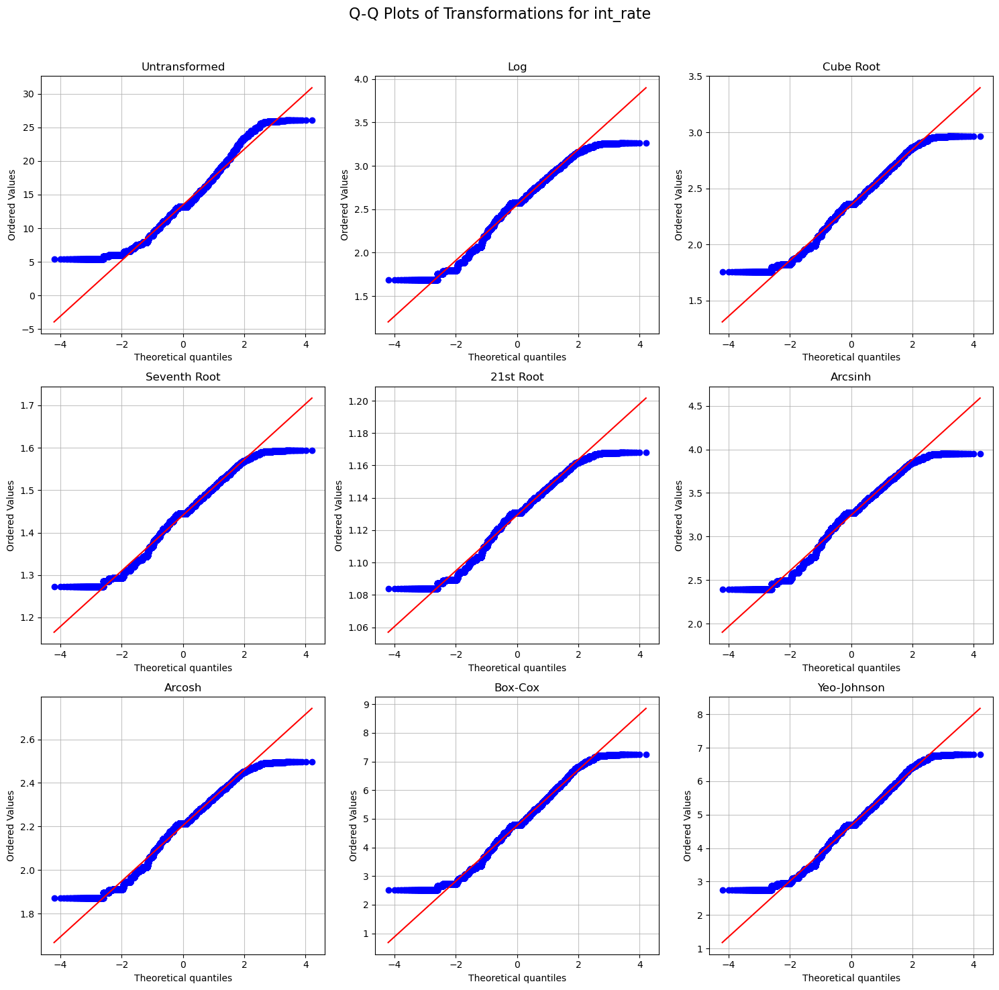

Comparing transformations for column: instalment


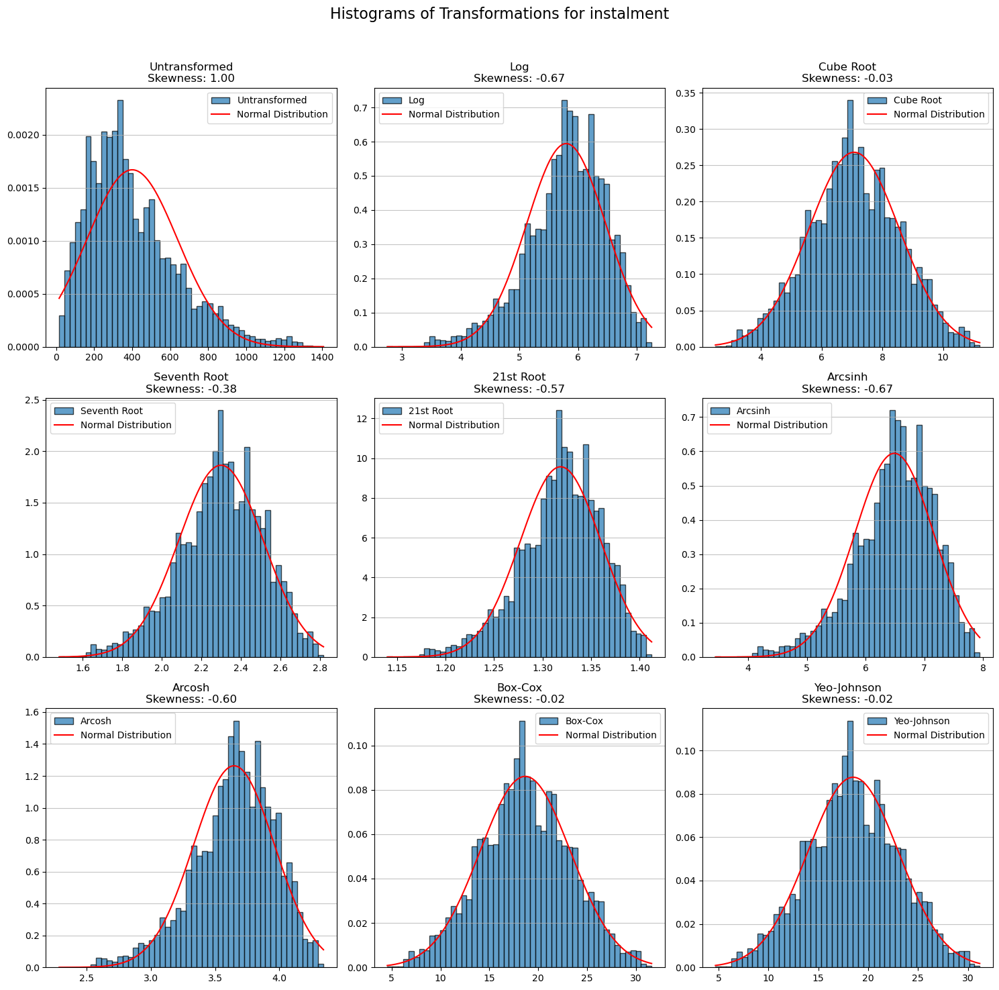

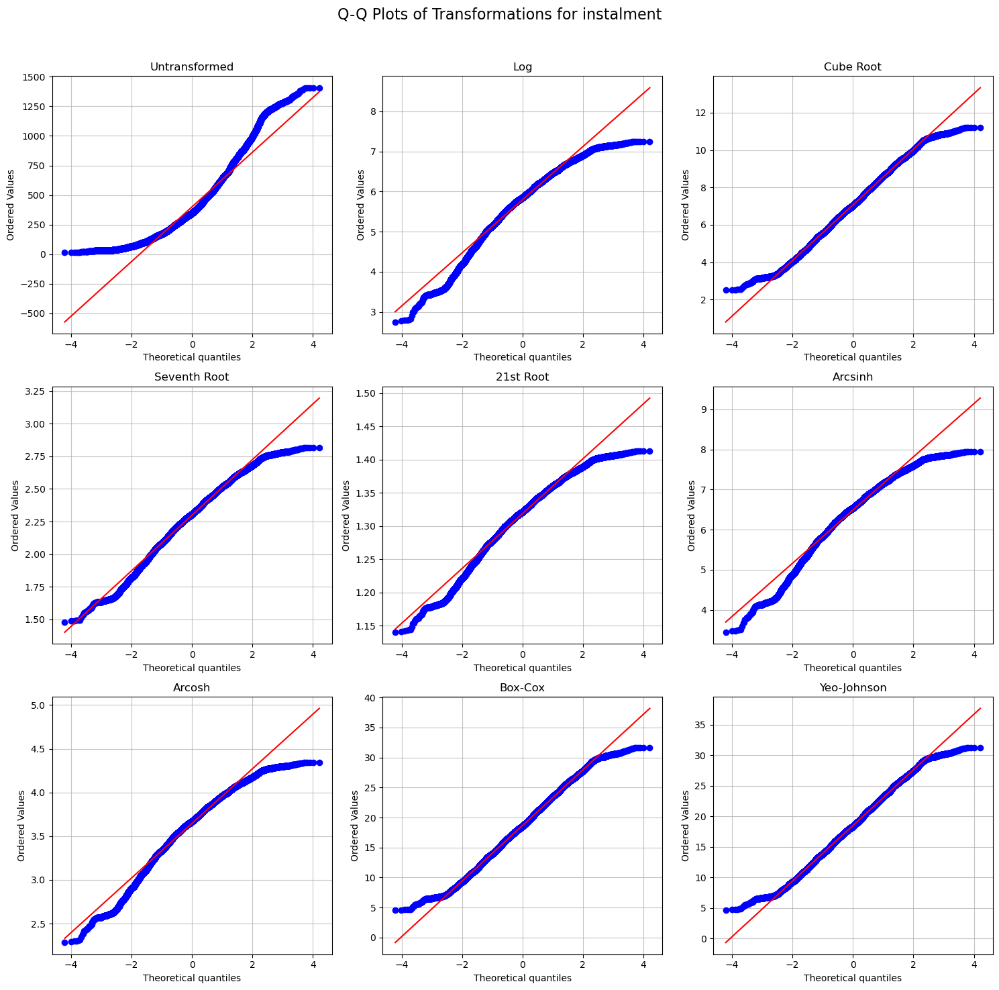

Comparing transformations for column: employment_length


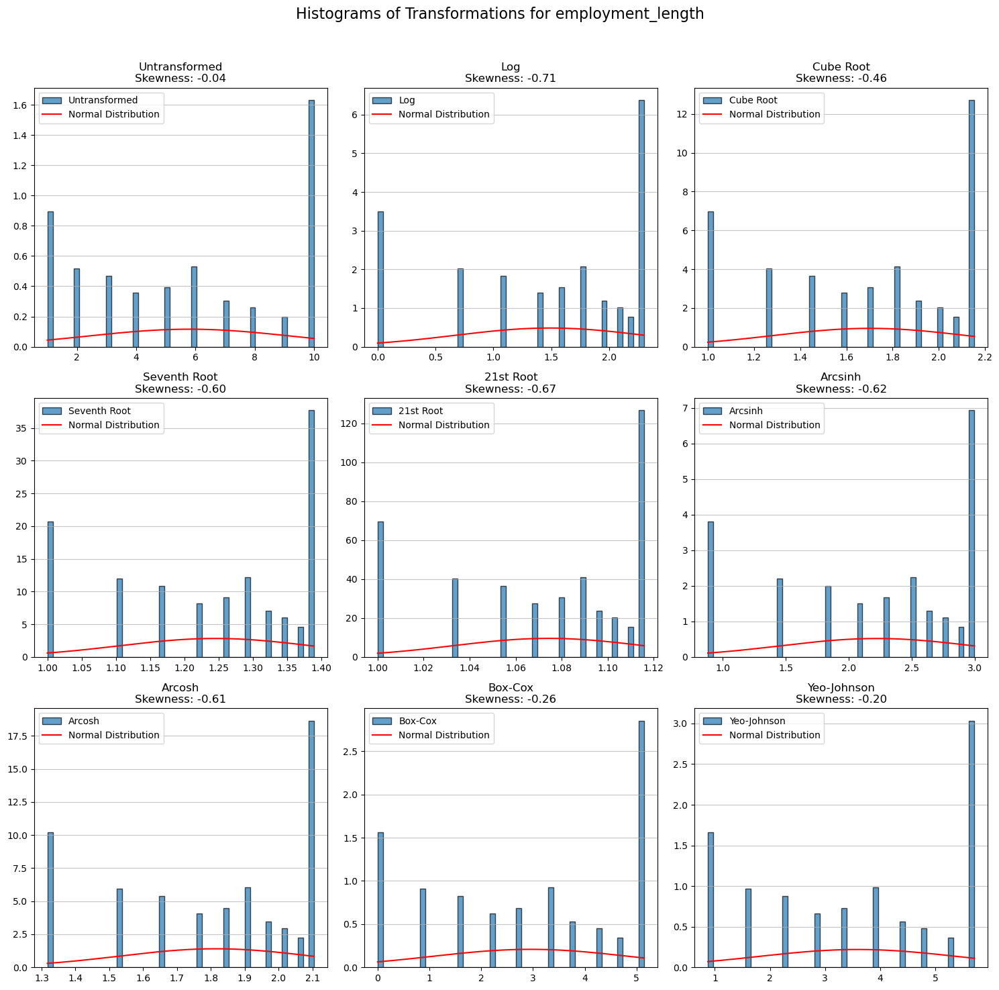

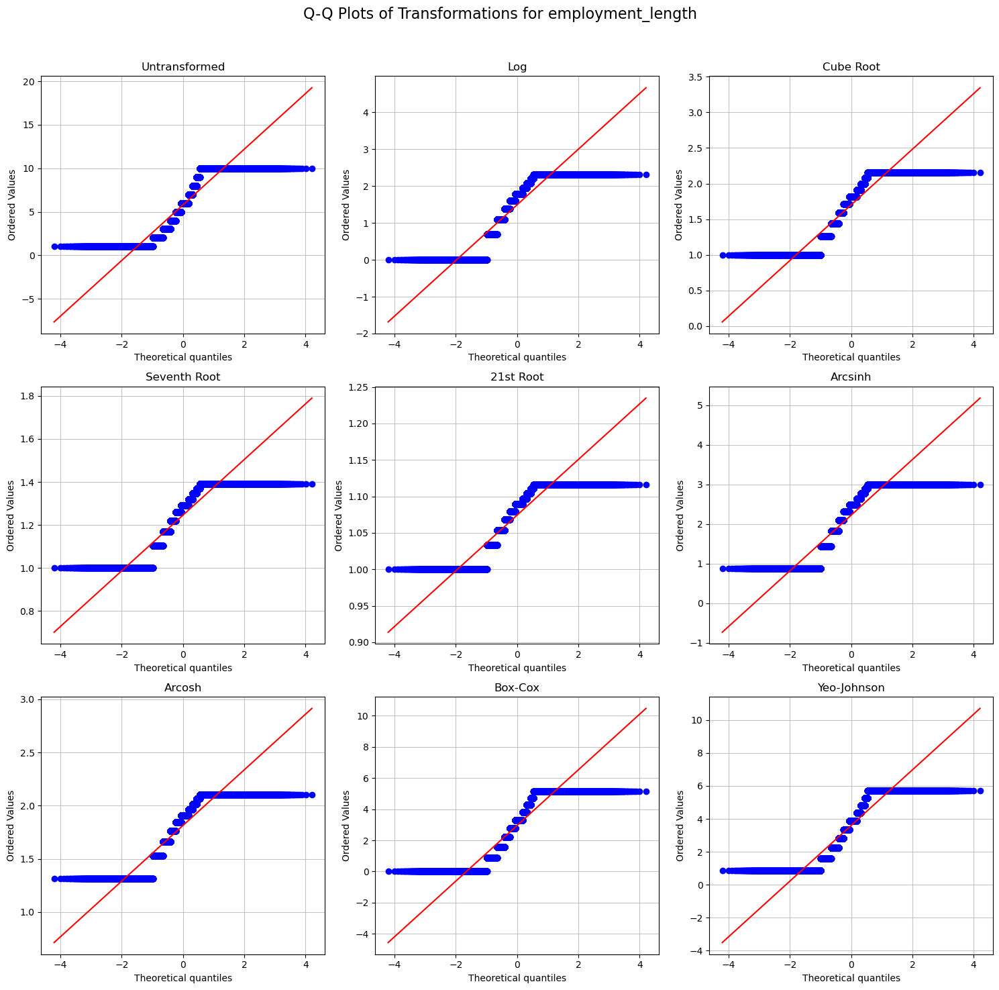

Comparing transformations for column: annual_inc


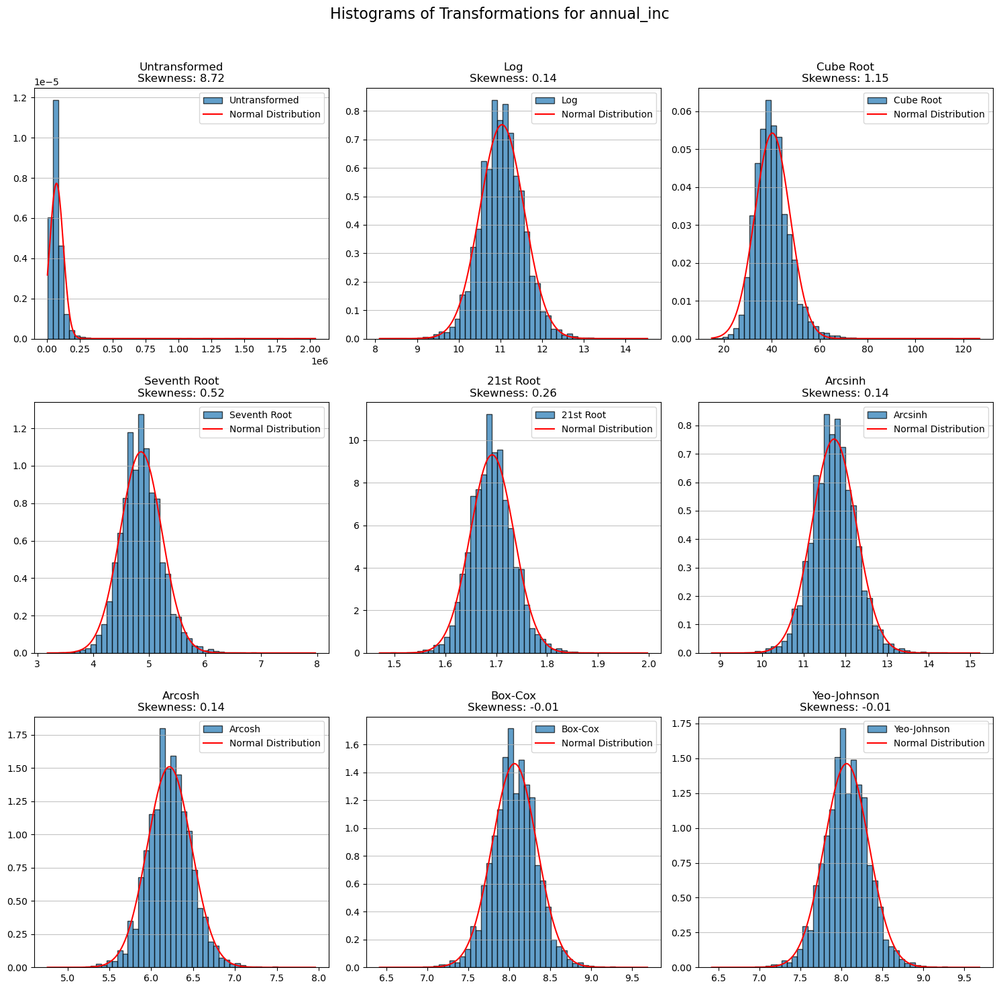

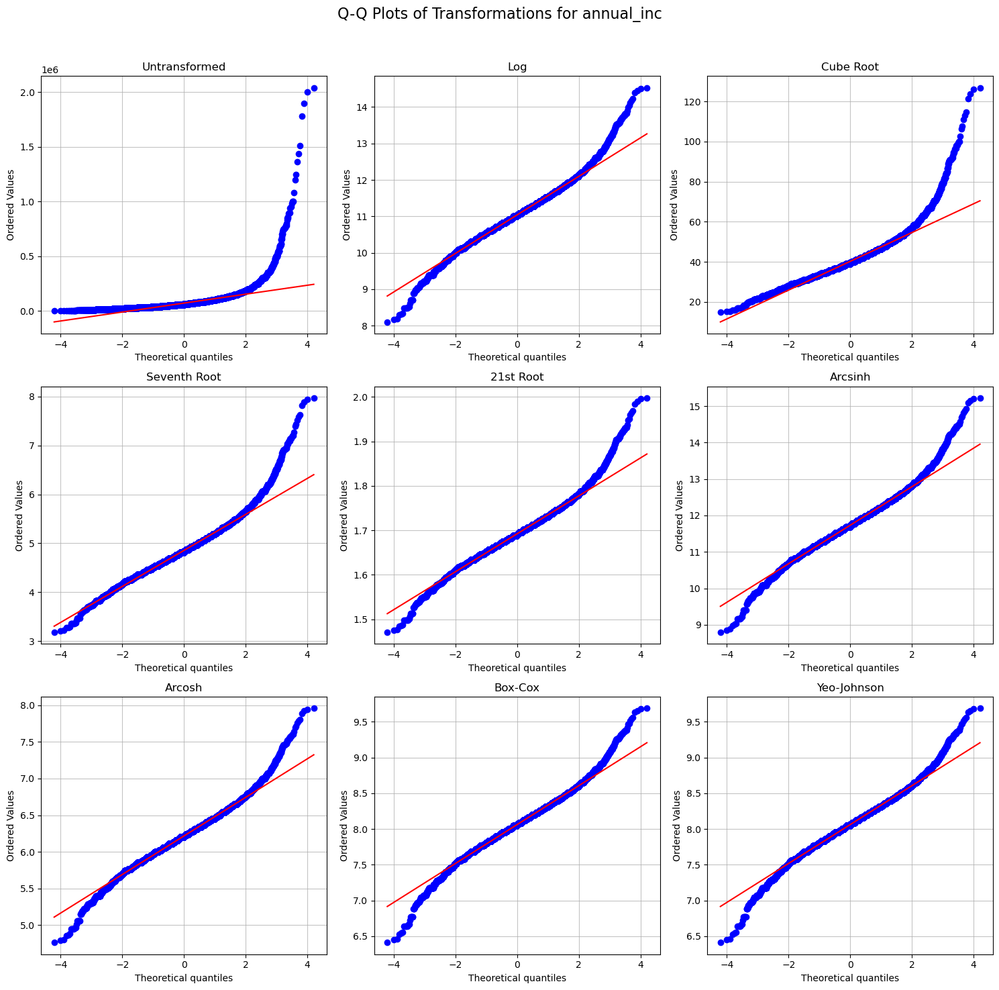

Comparing transformations for column: dti


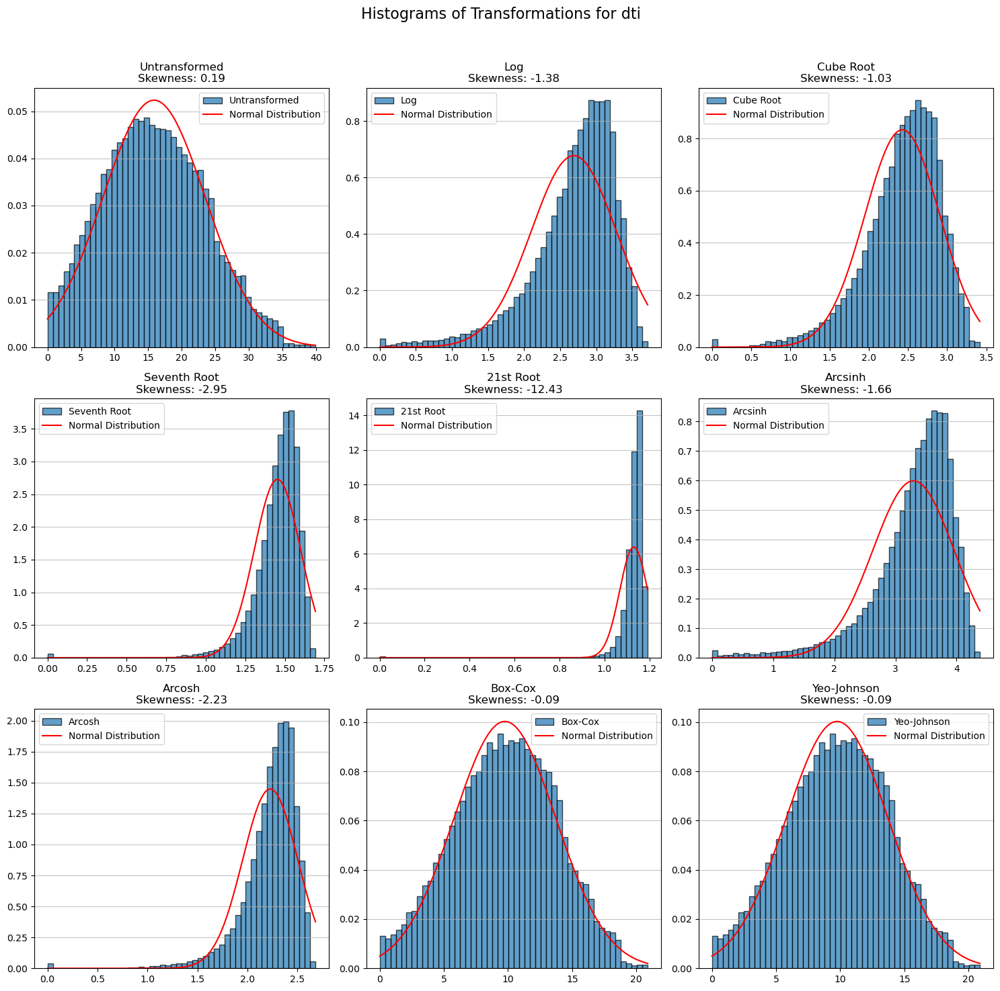

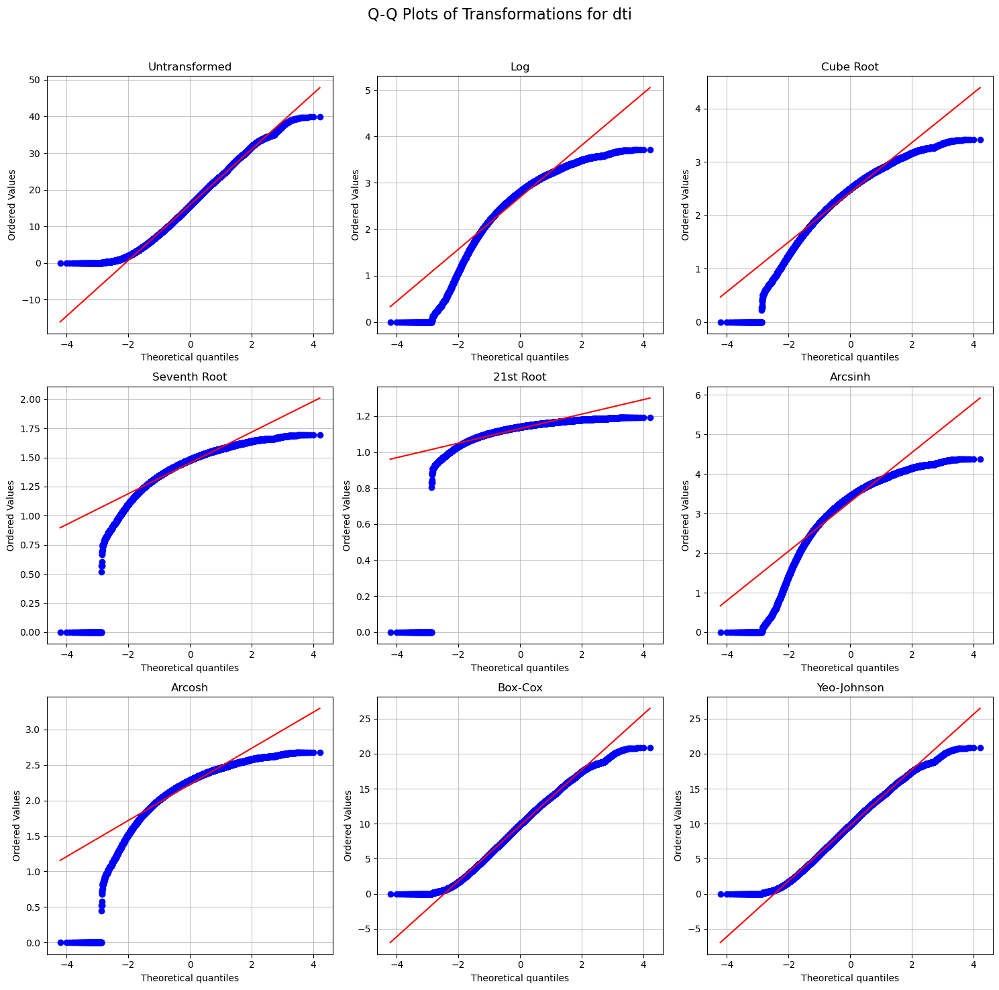

Comparing transformations for column: delinq_2yrs


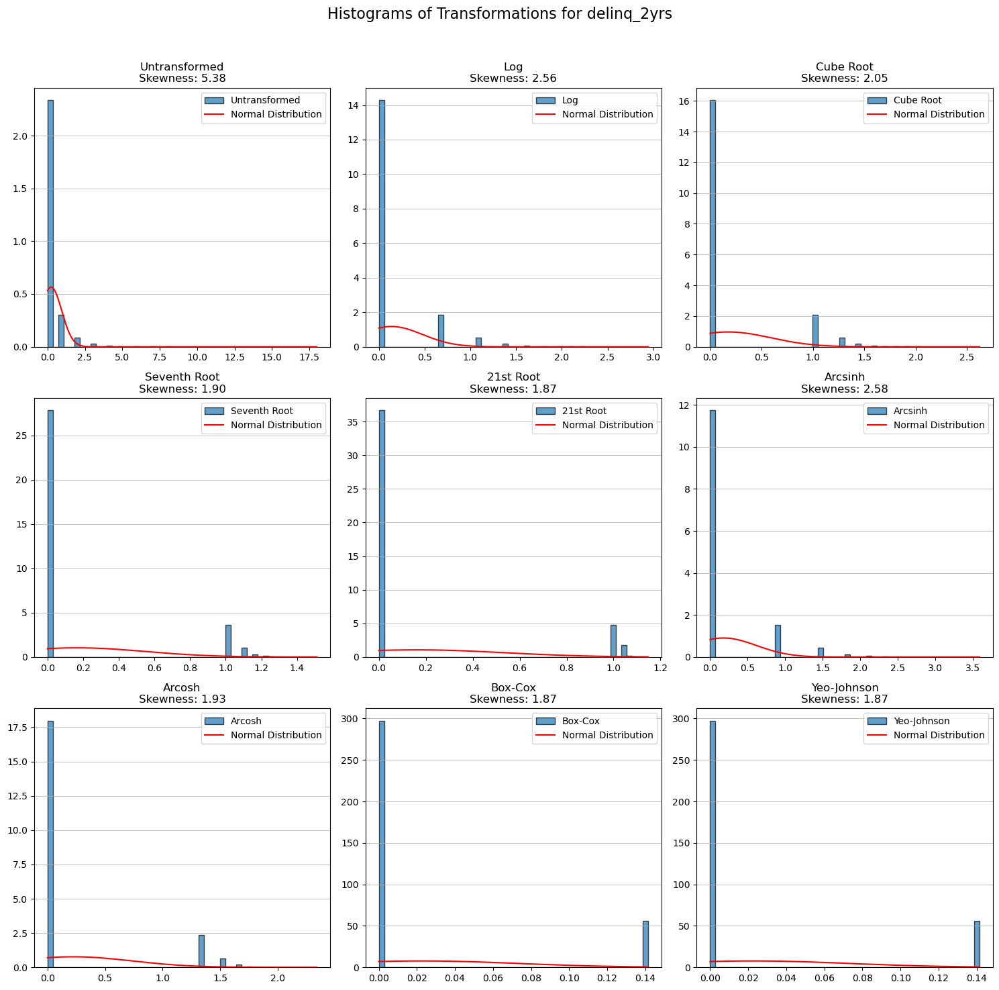

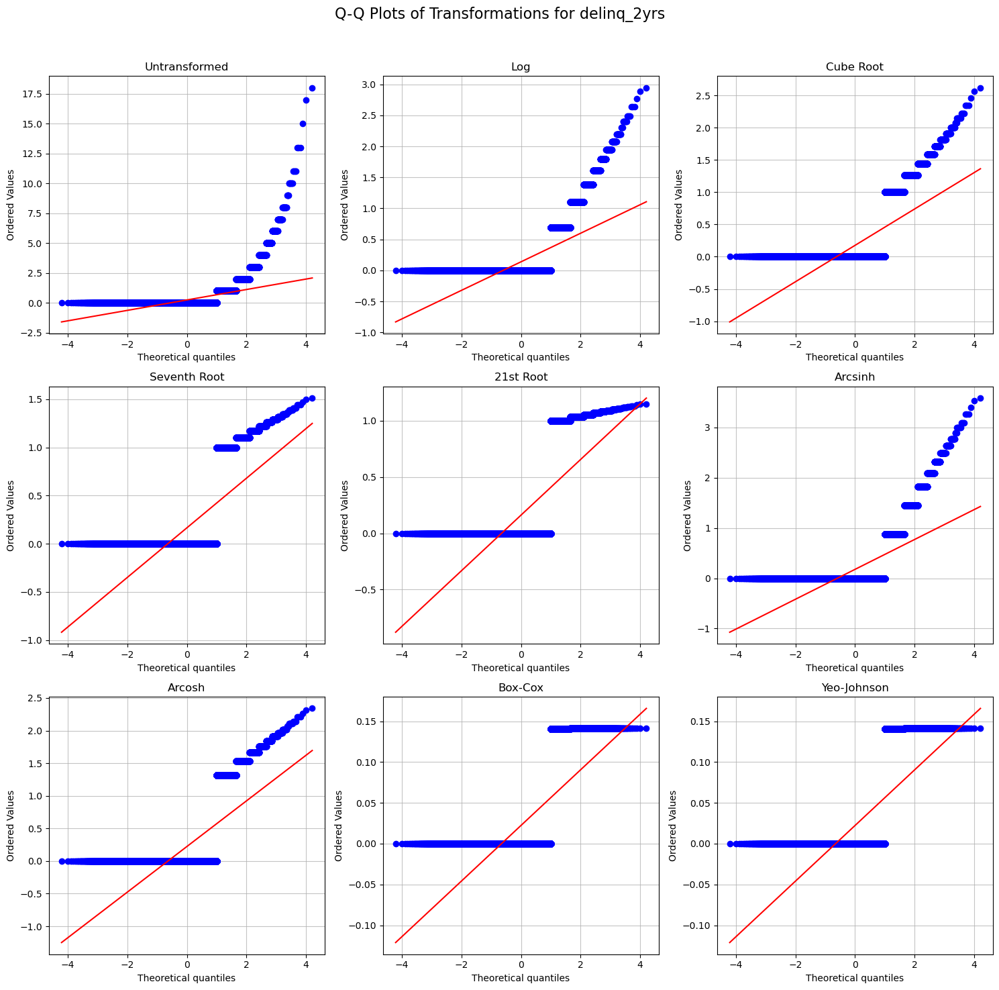

Comparing transformations for column: inq_last_6mths


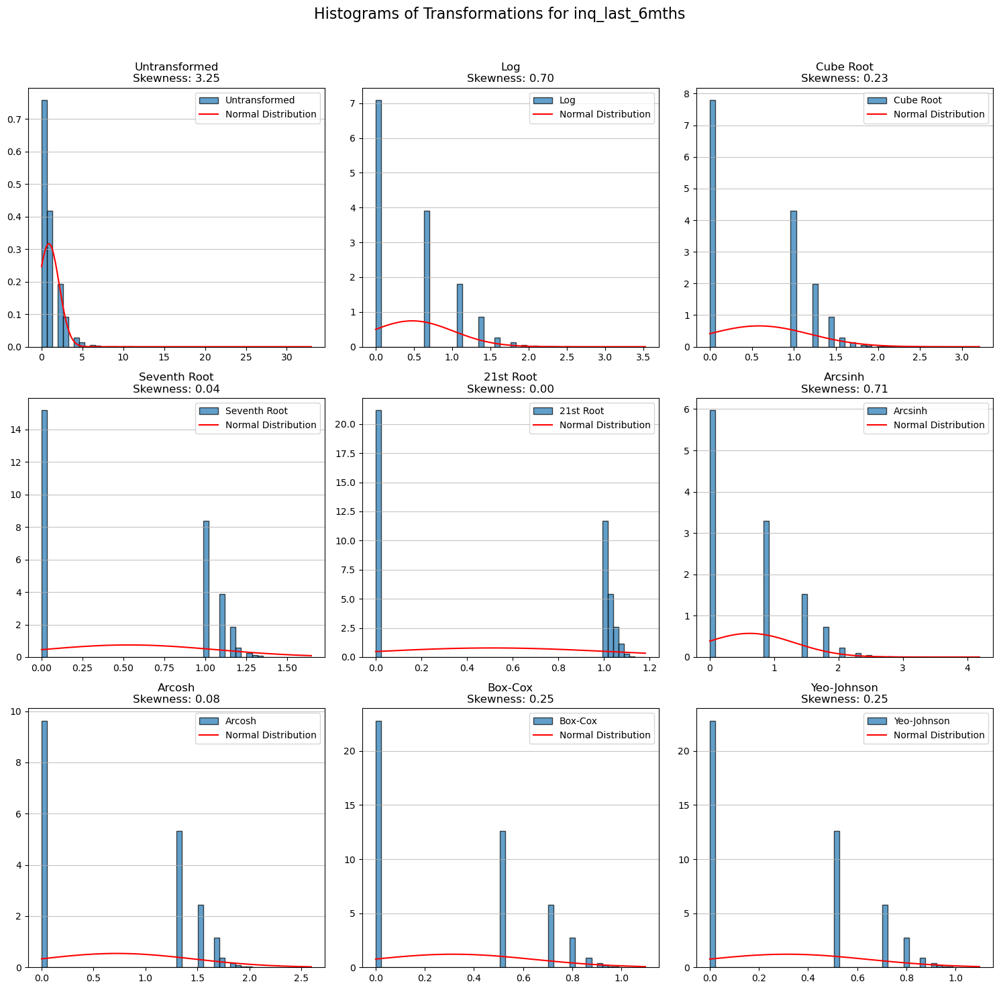

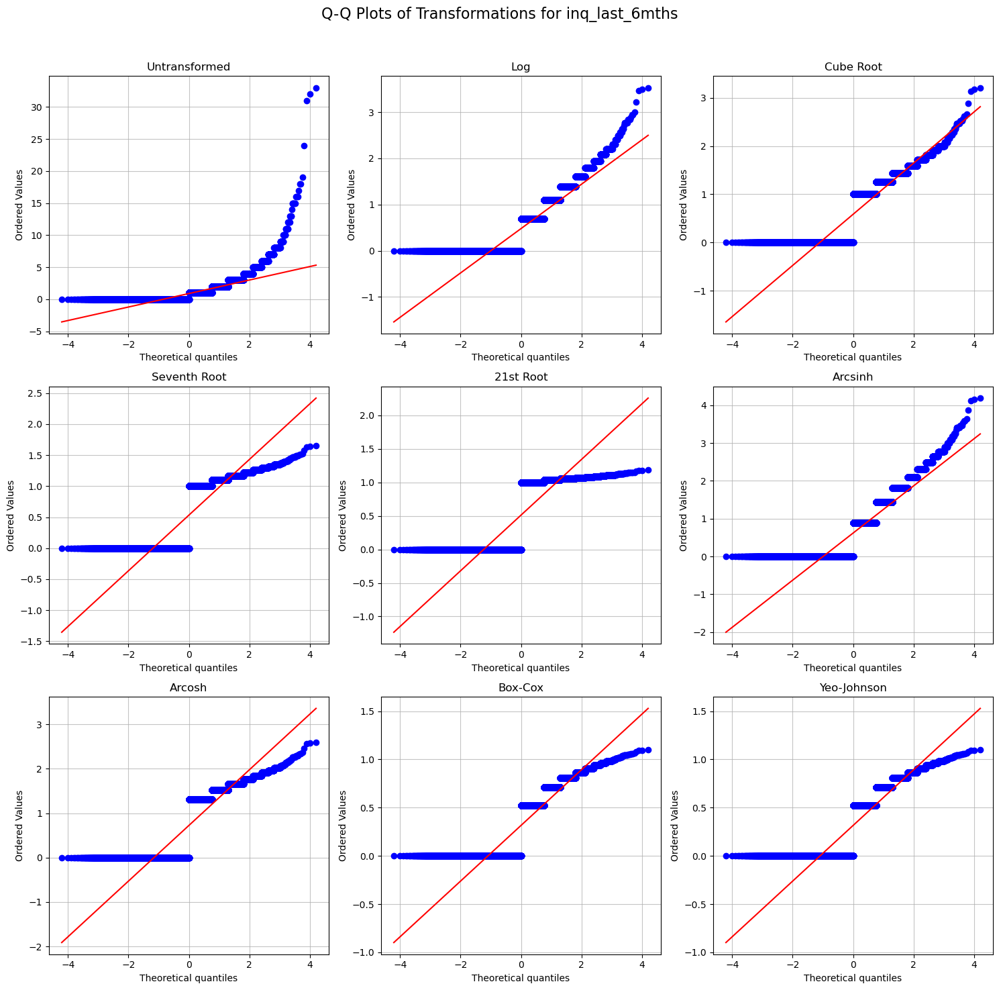

Comparing transformations for column: open_accounts


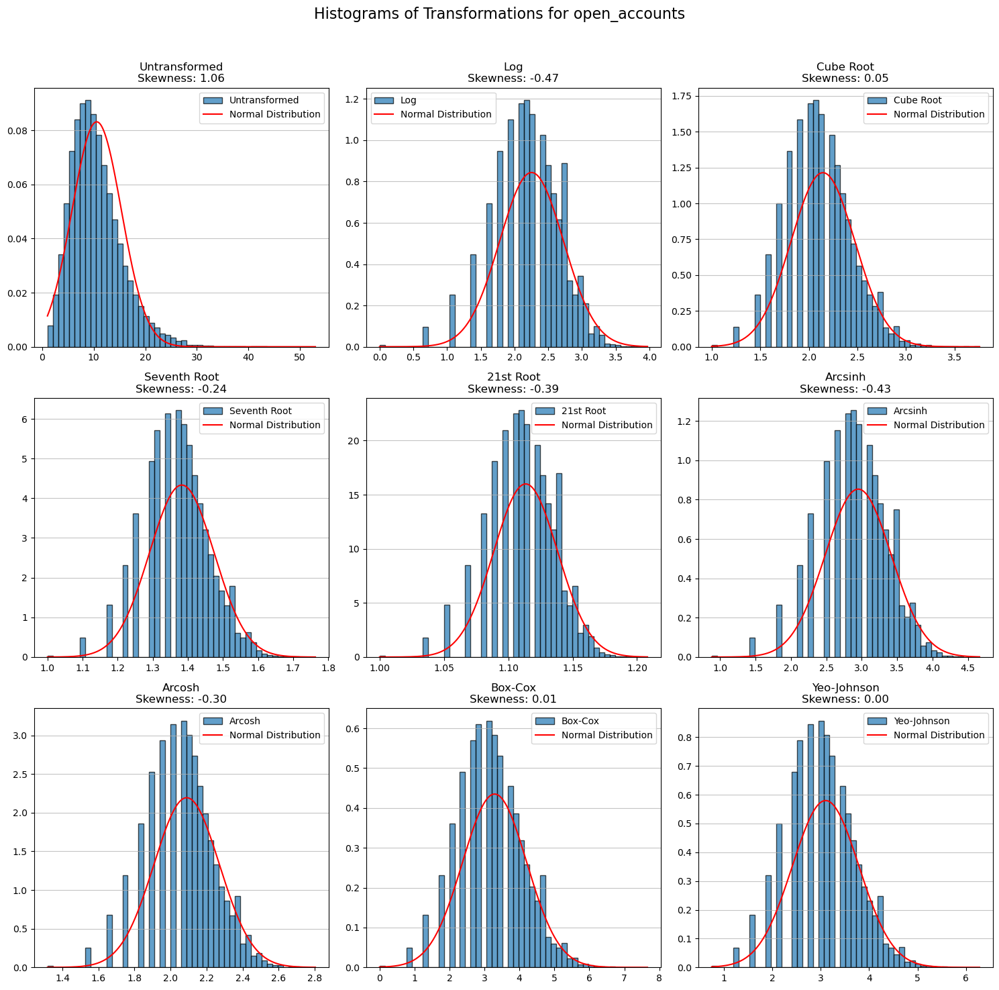

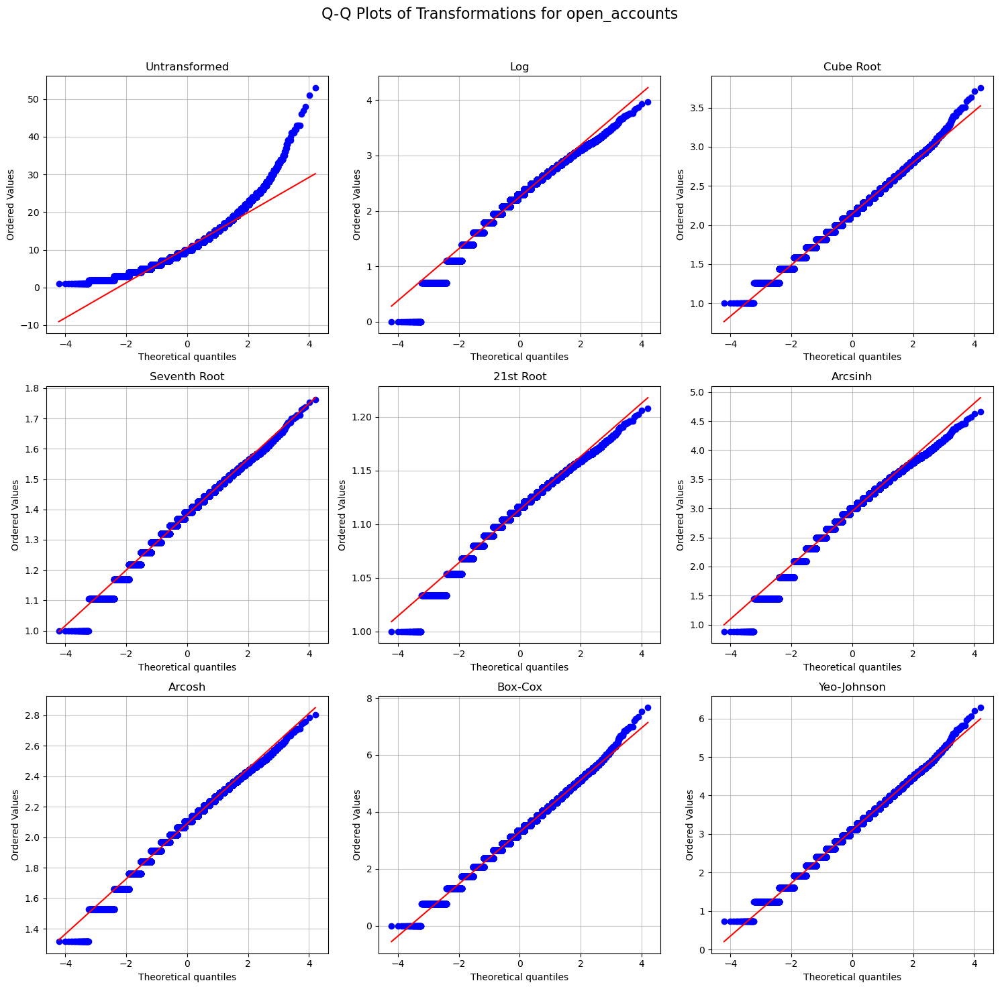

Comparing transformations for column: total_accounts


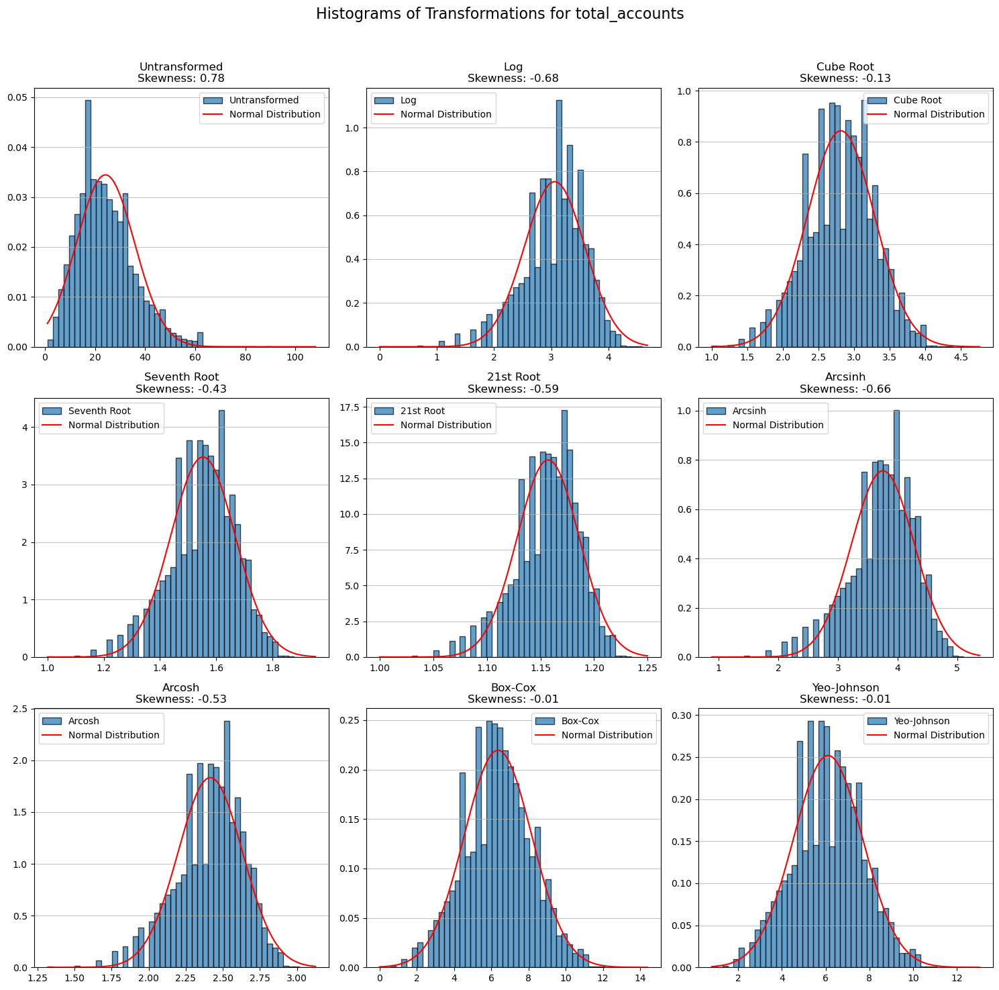

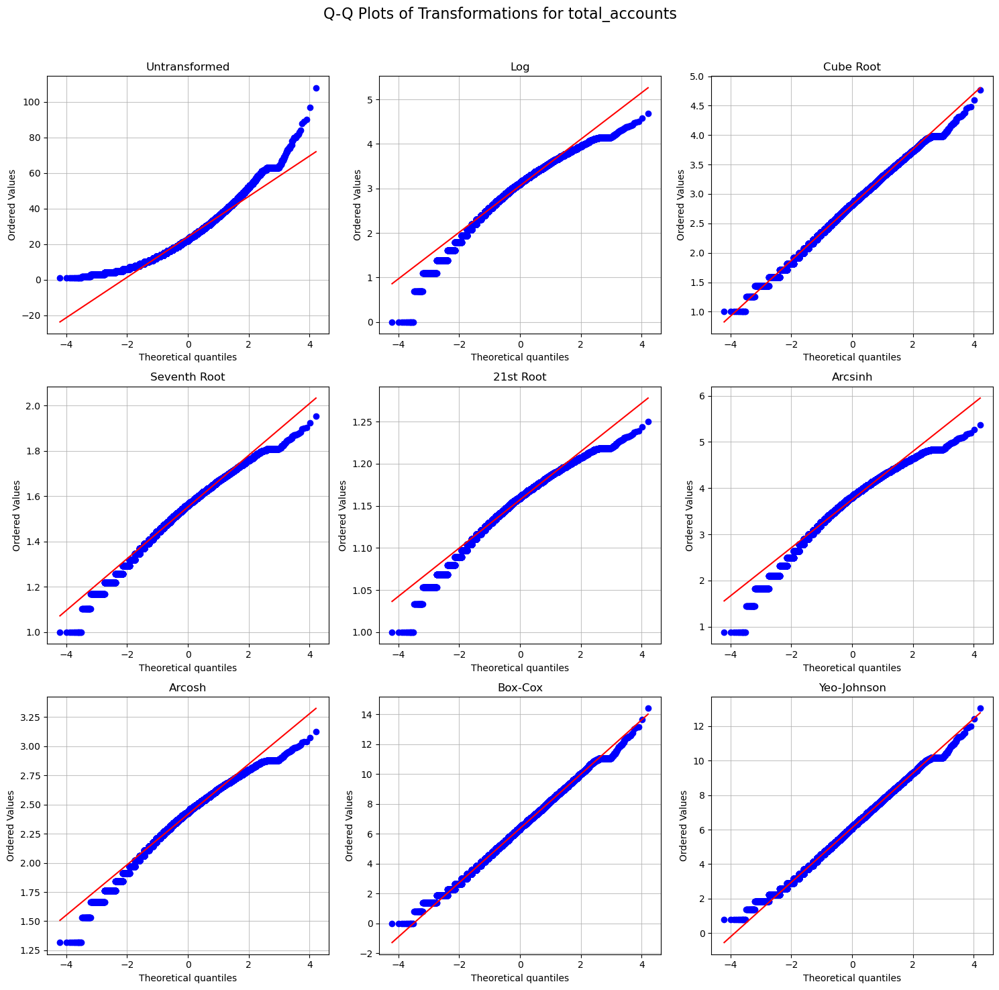

Comparing transformations for column: out_prncp


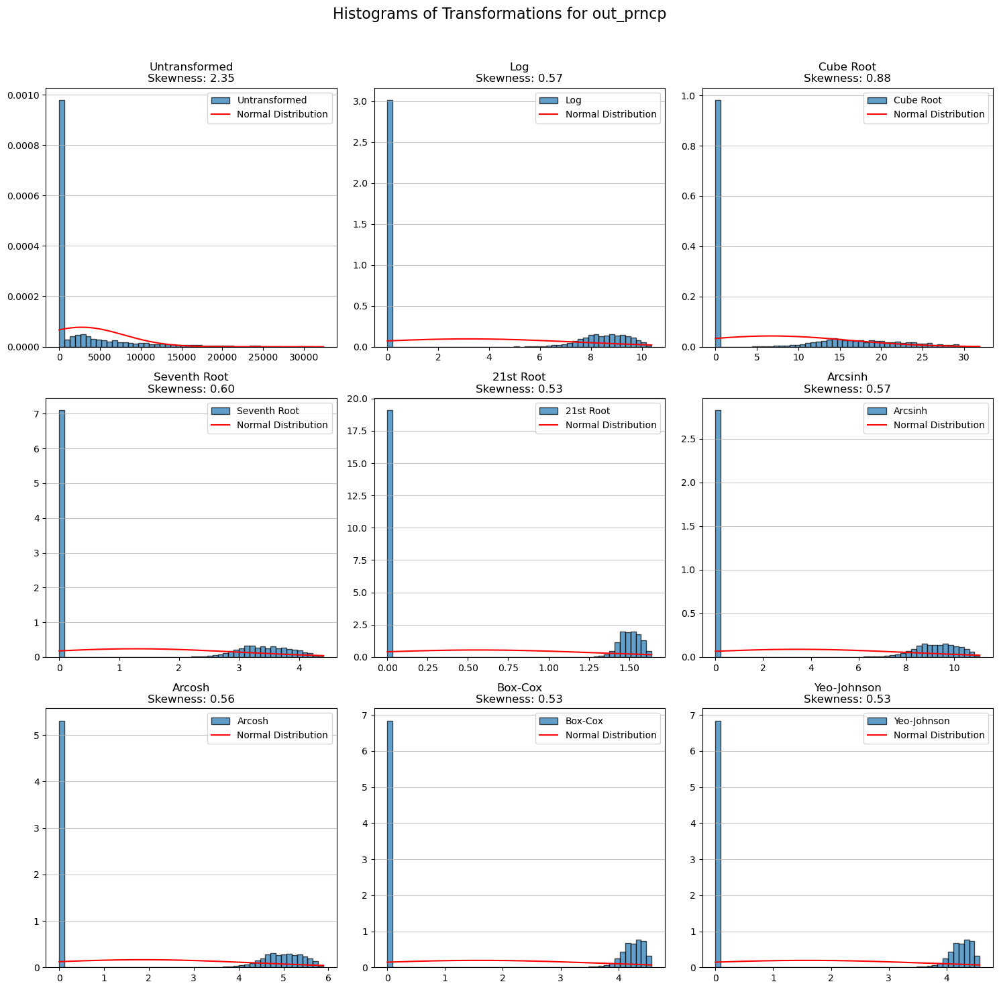

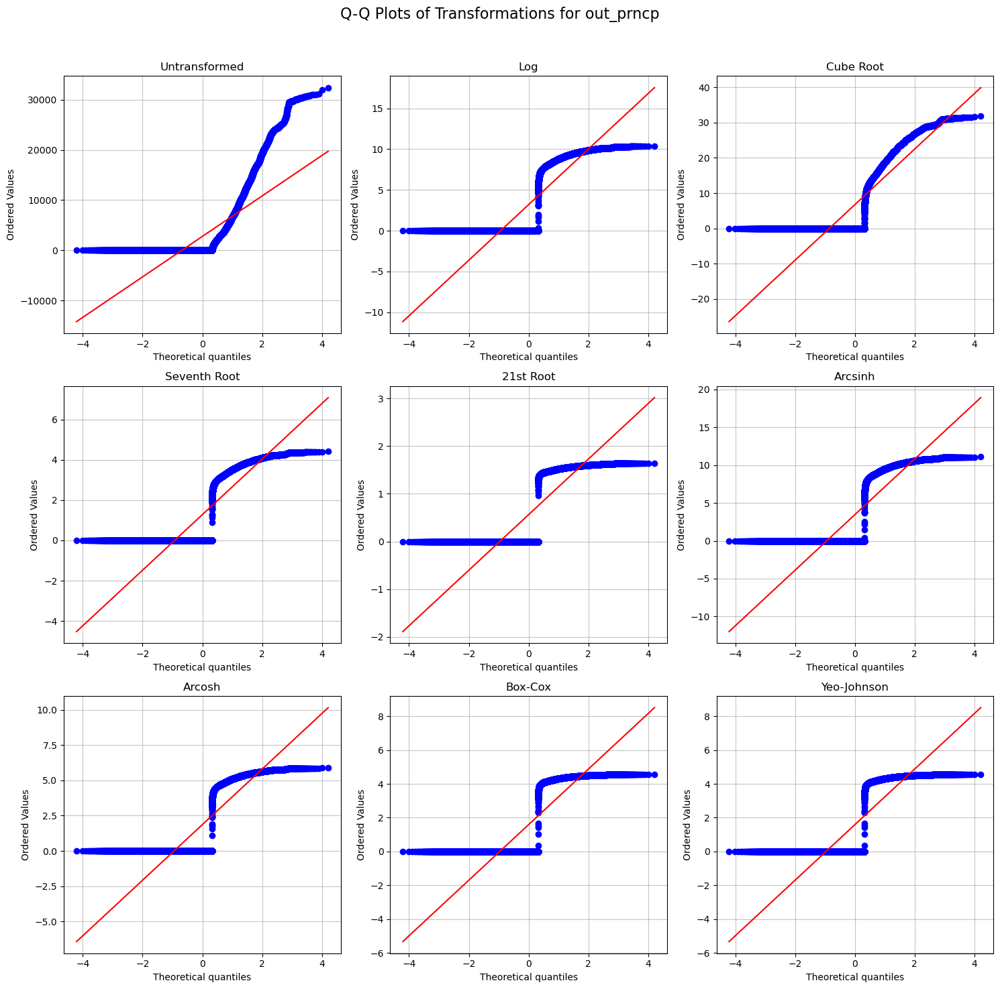

Comparing transformations for column: out_prncp_inv


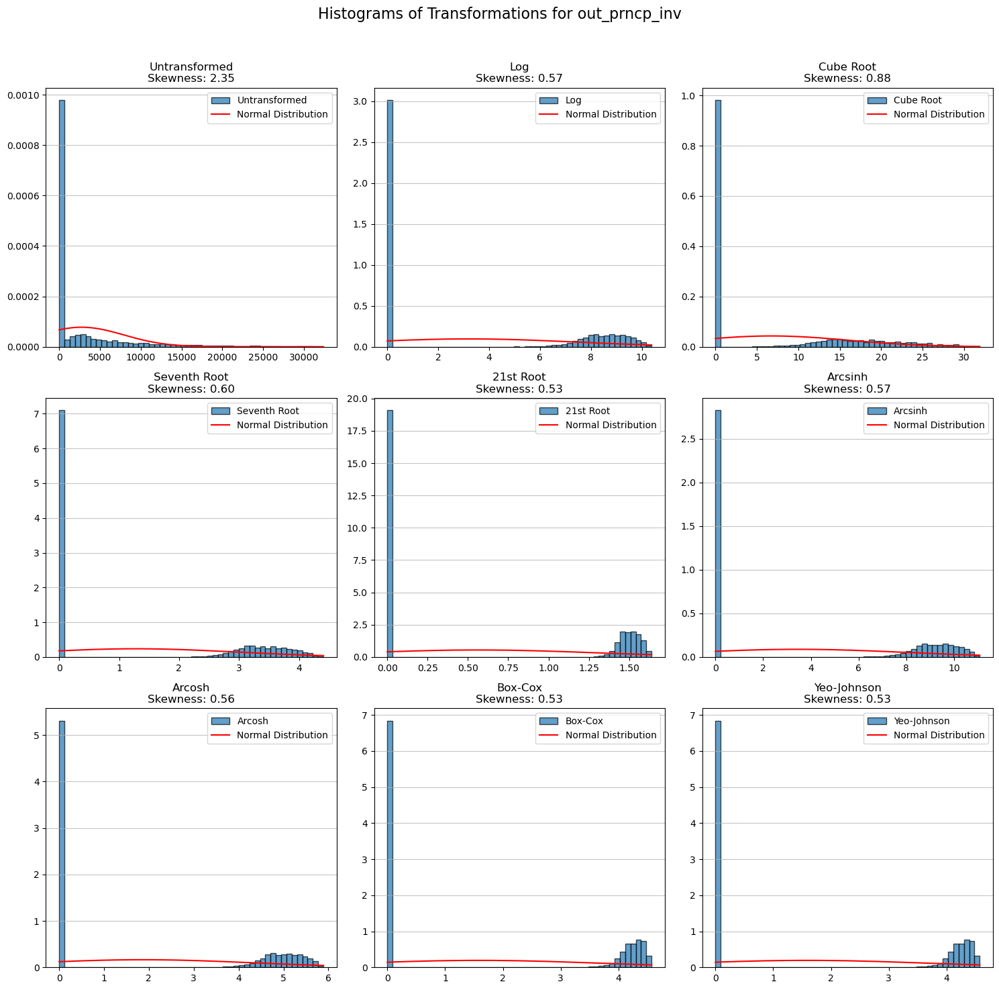

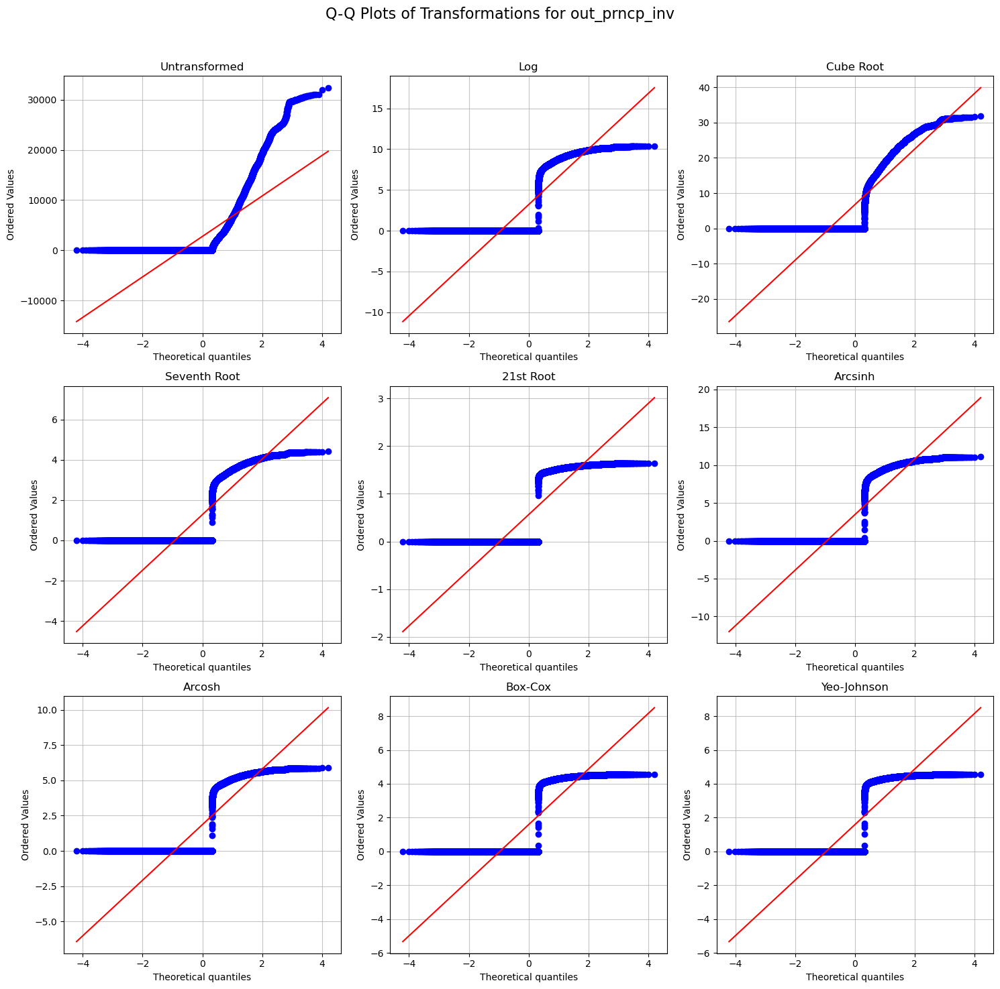

Comparing transformations for column: total_payment


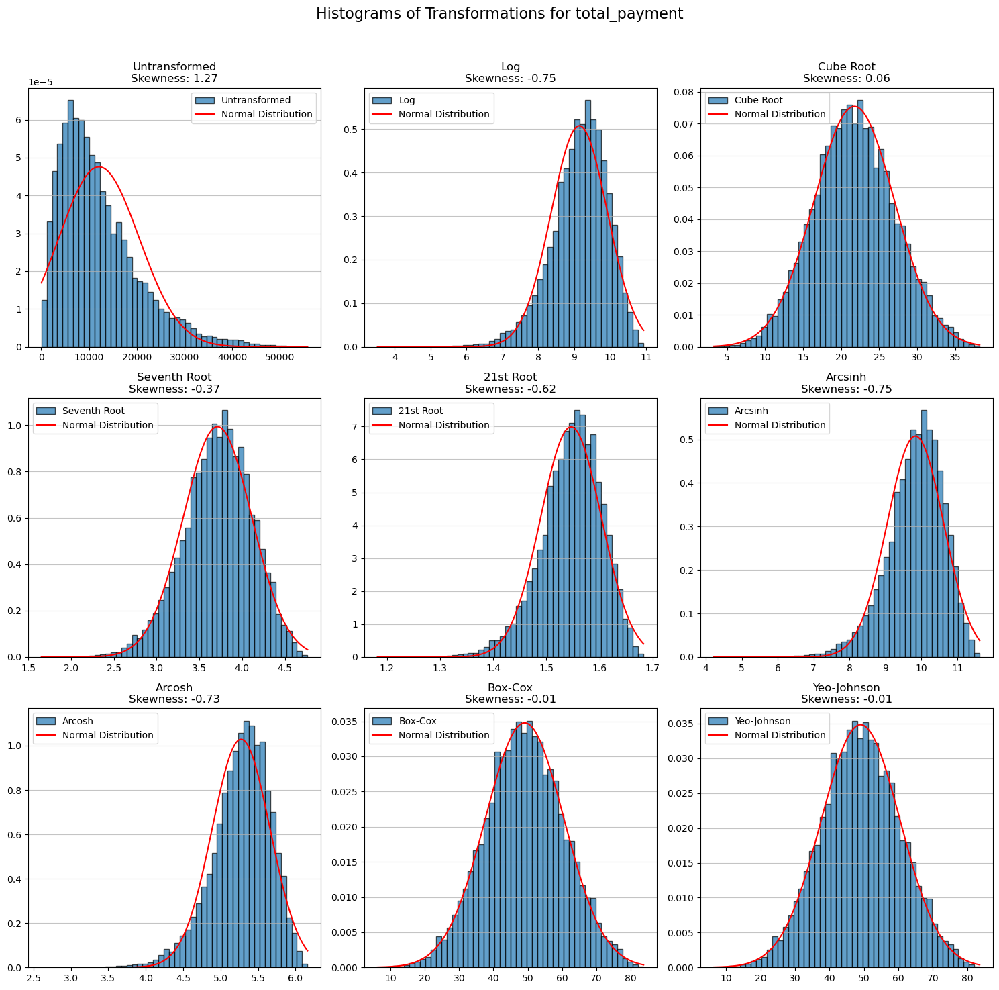

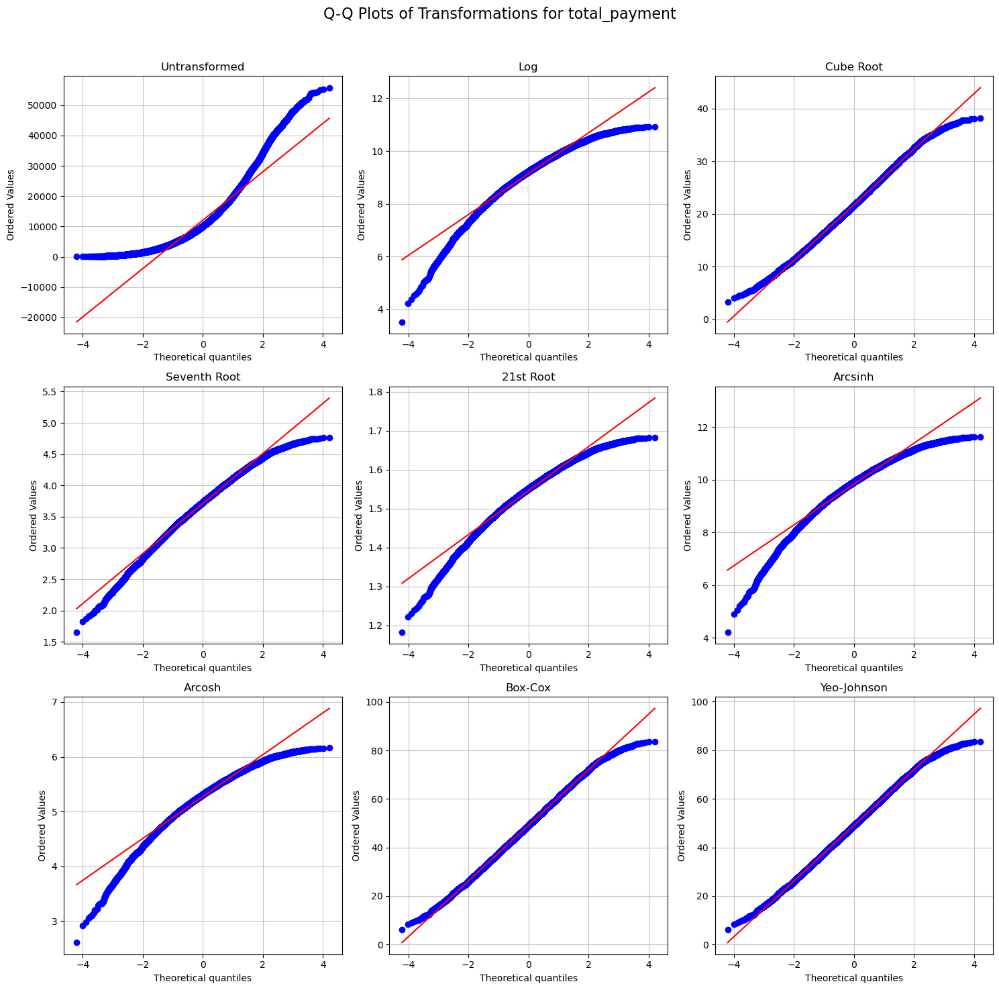

Comparing transformations for column: total_payment_inv


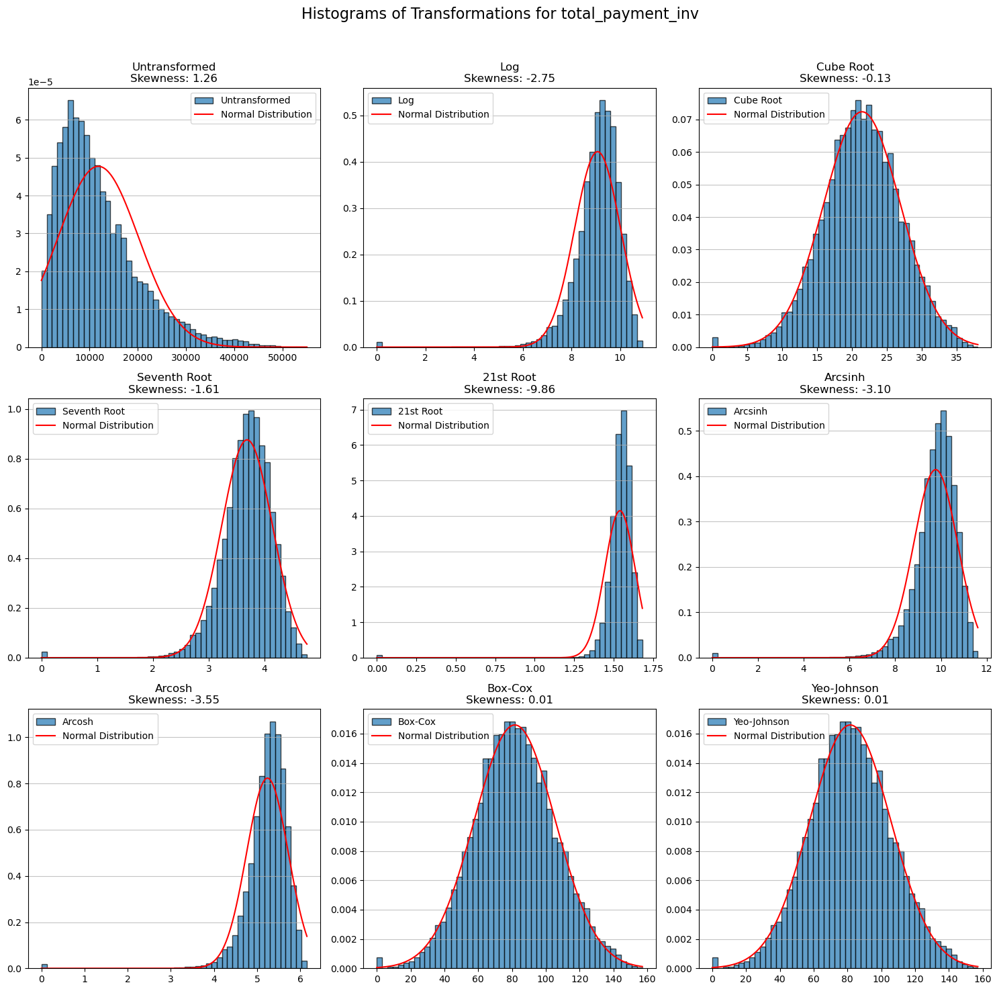

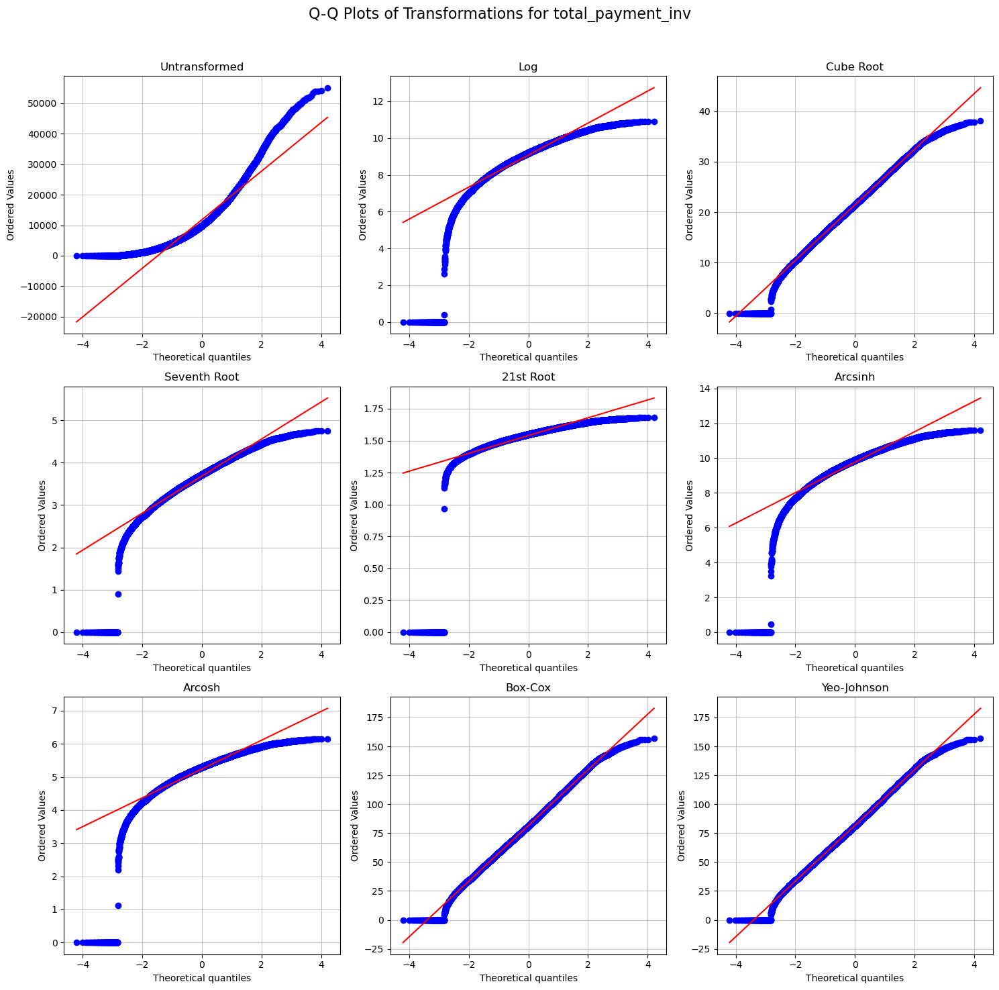

Comparing transformations for column: total_rec_prncp


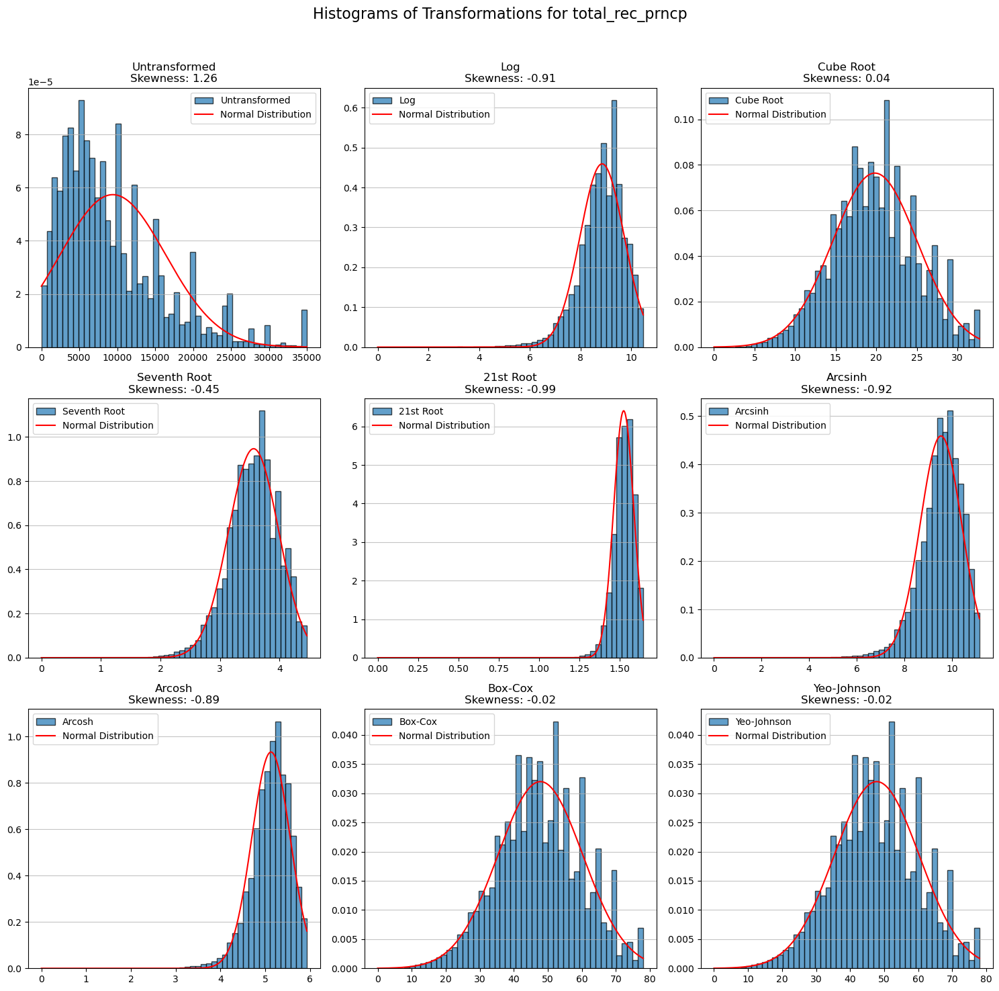

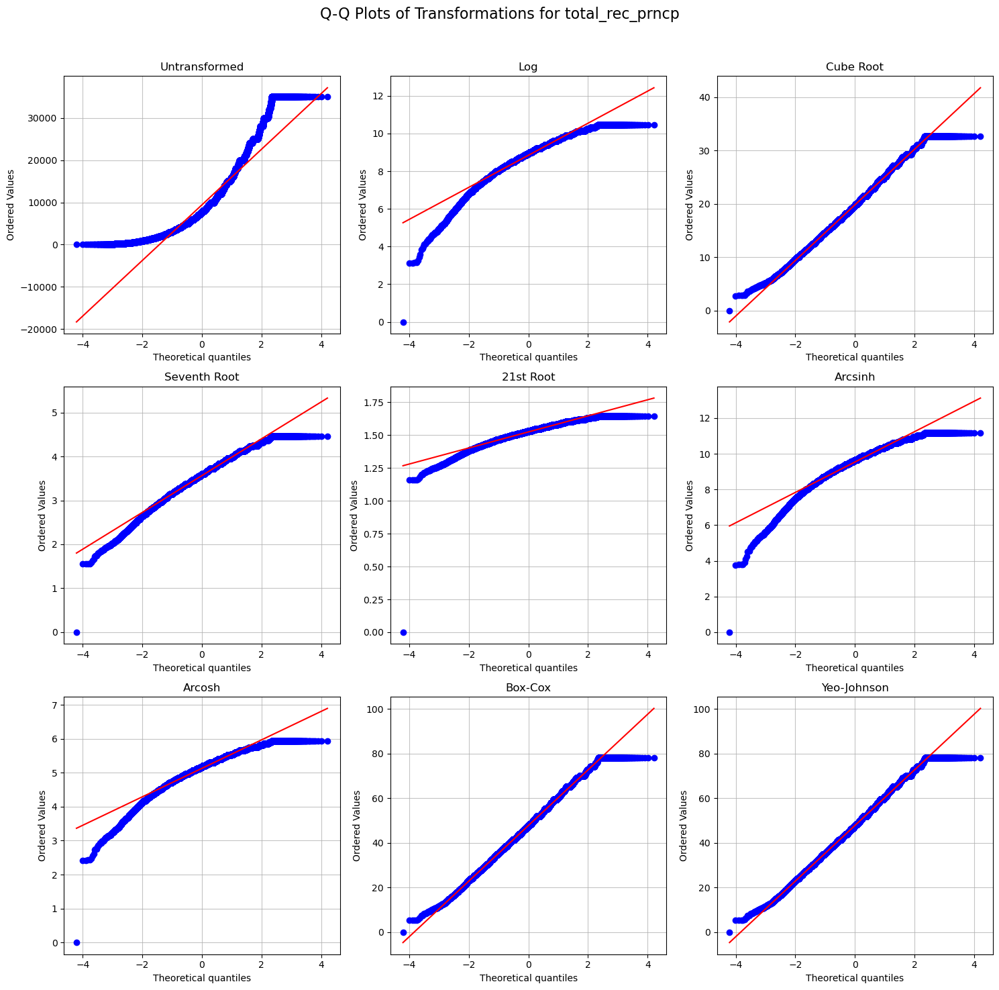

Comparing transformations for column: total_rec_int


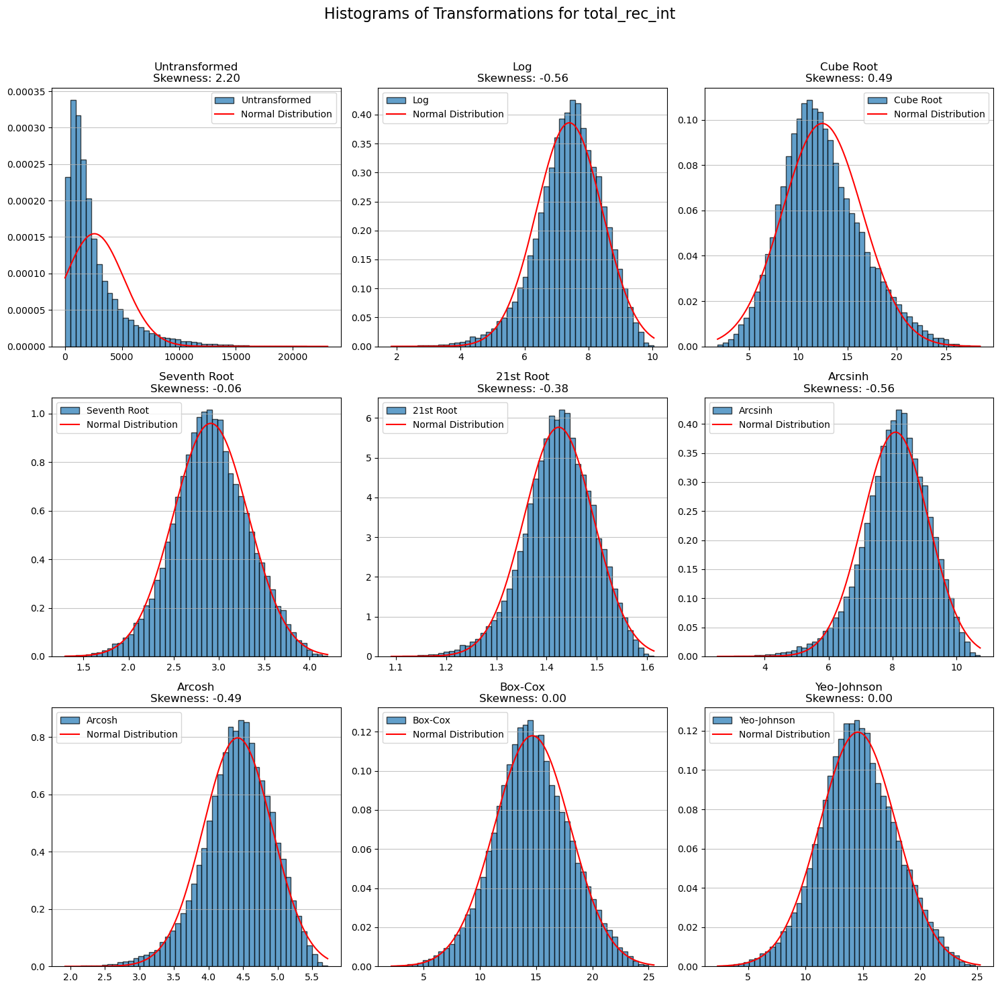

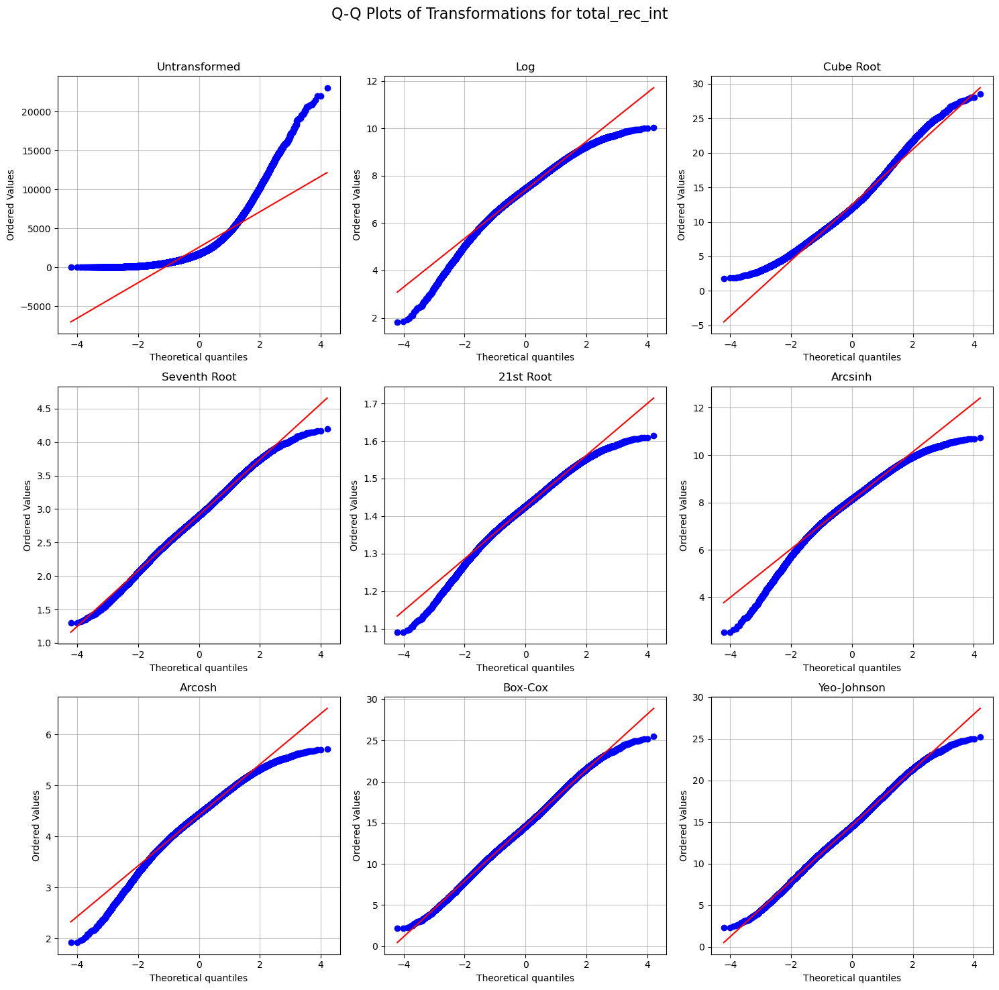

Comparing transformations for column: total_rec_late_fee


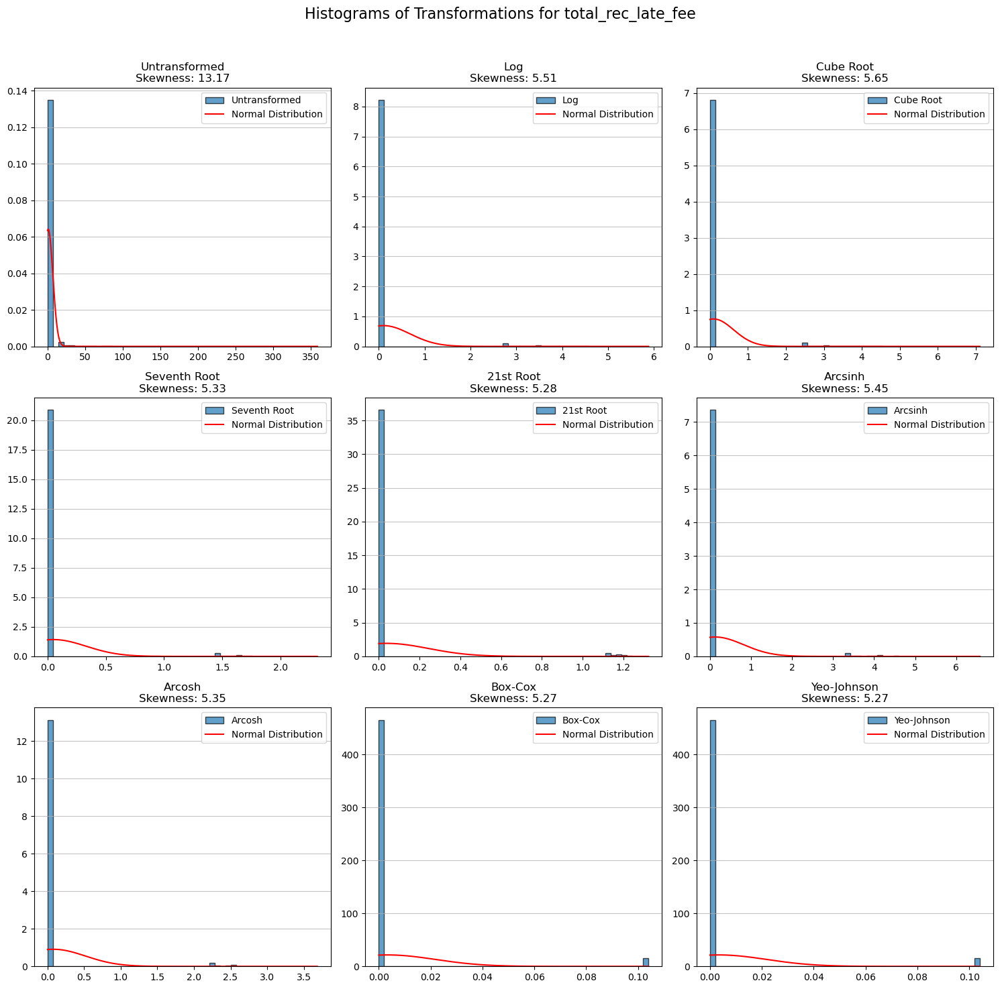

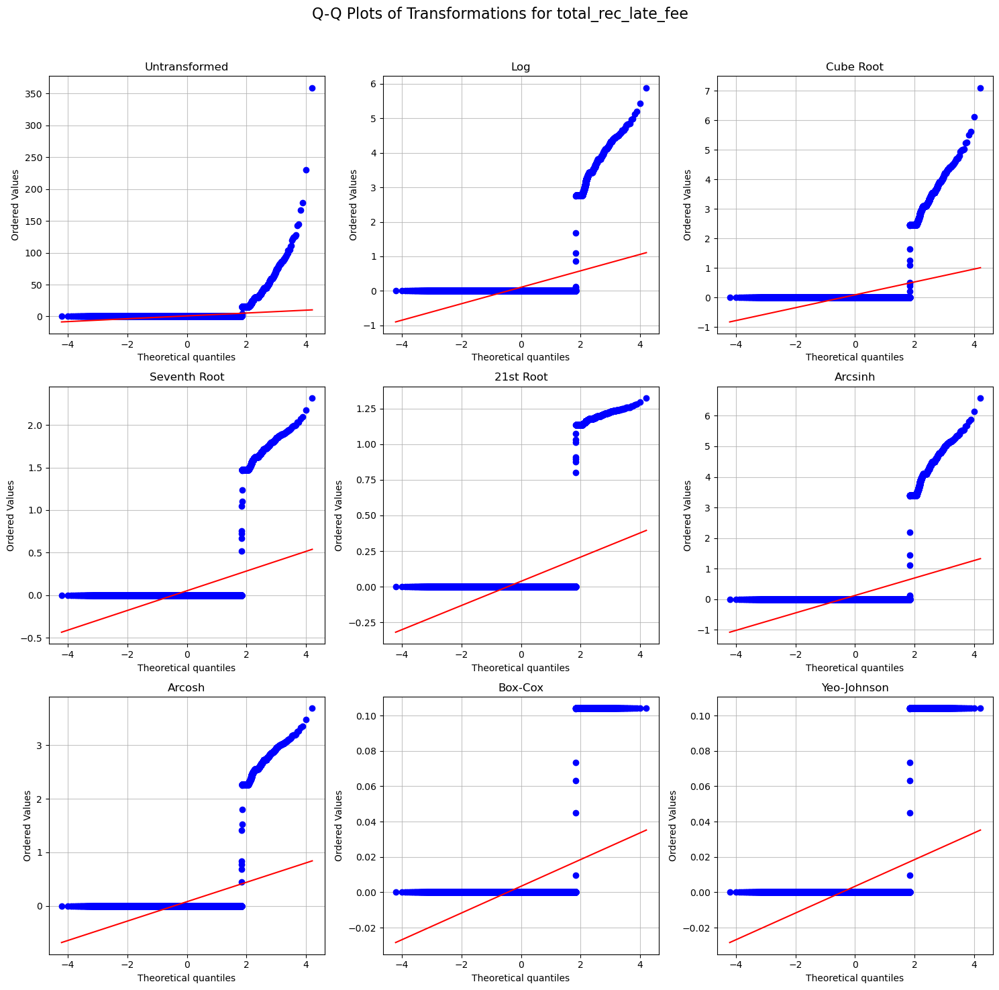

Comparing transformations for column: recoveries


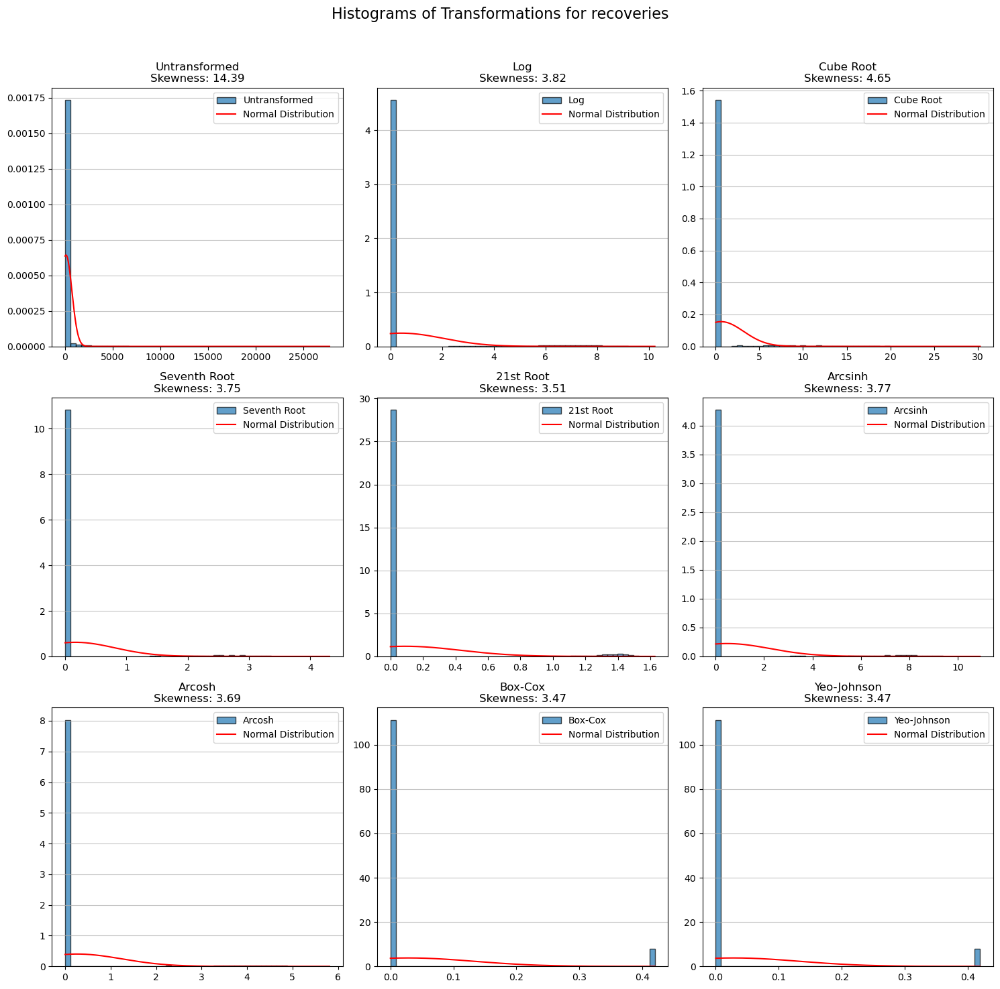

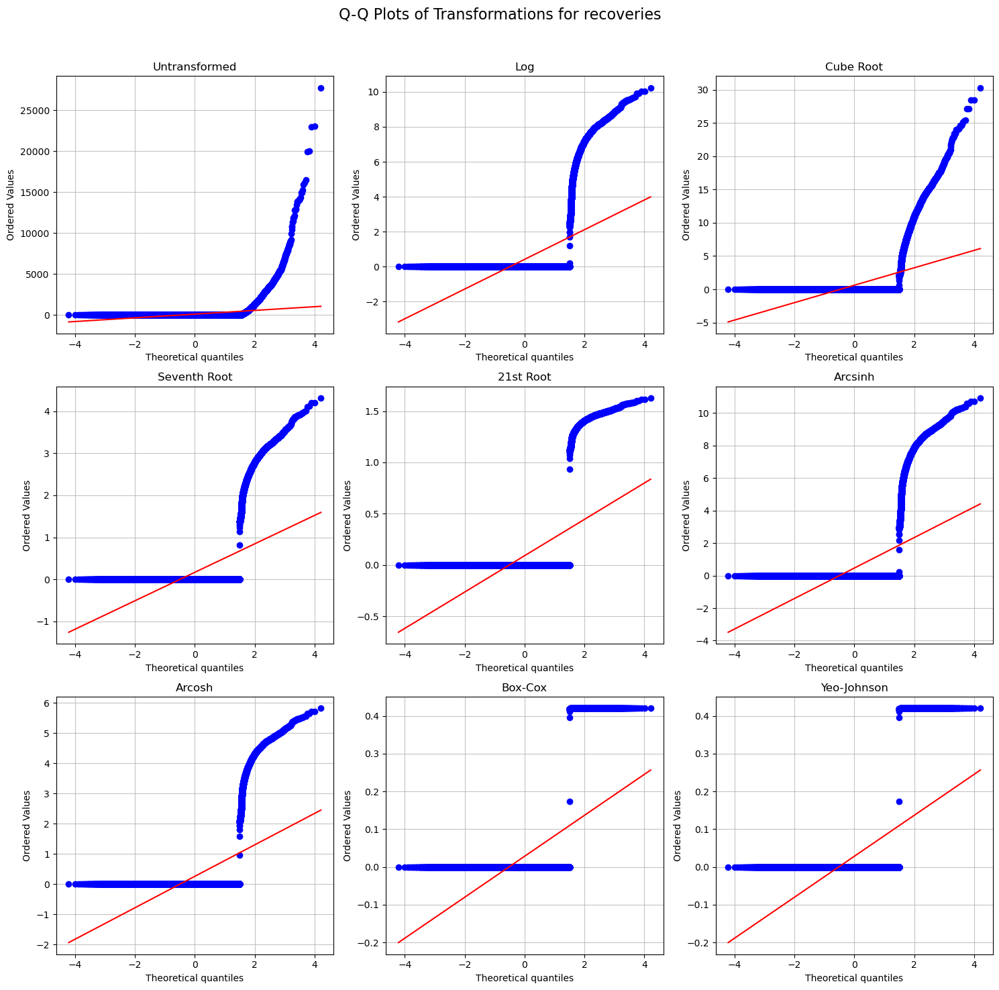

Comparing transformations for column: collection_recovery_fee


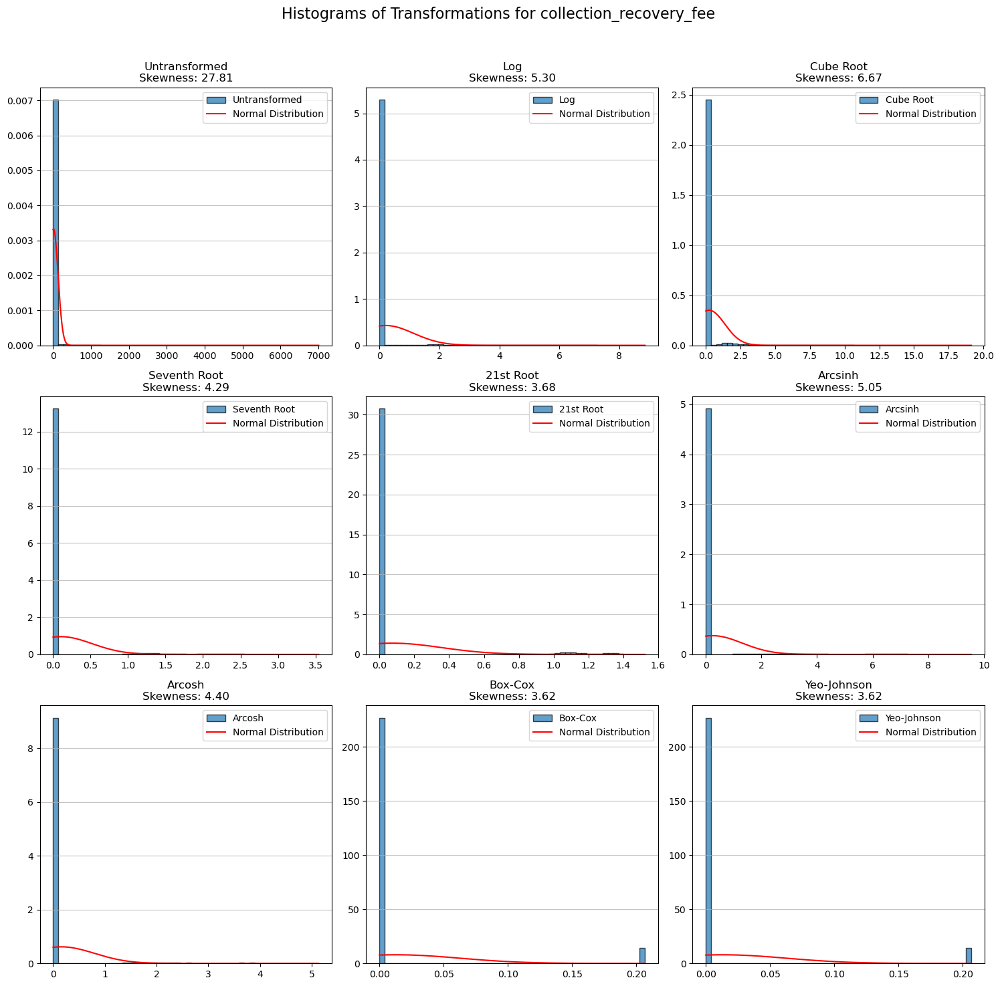

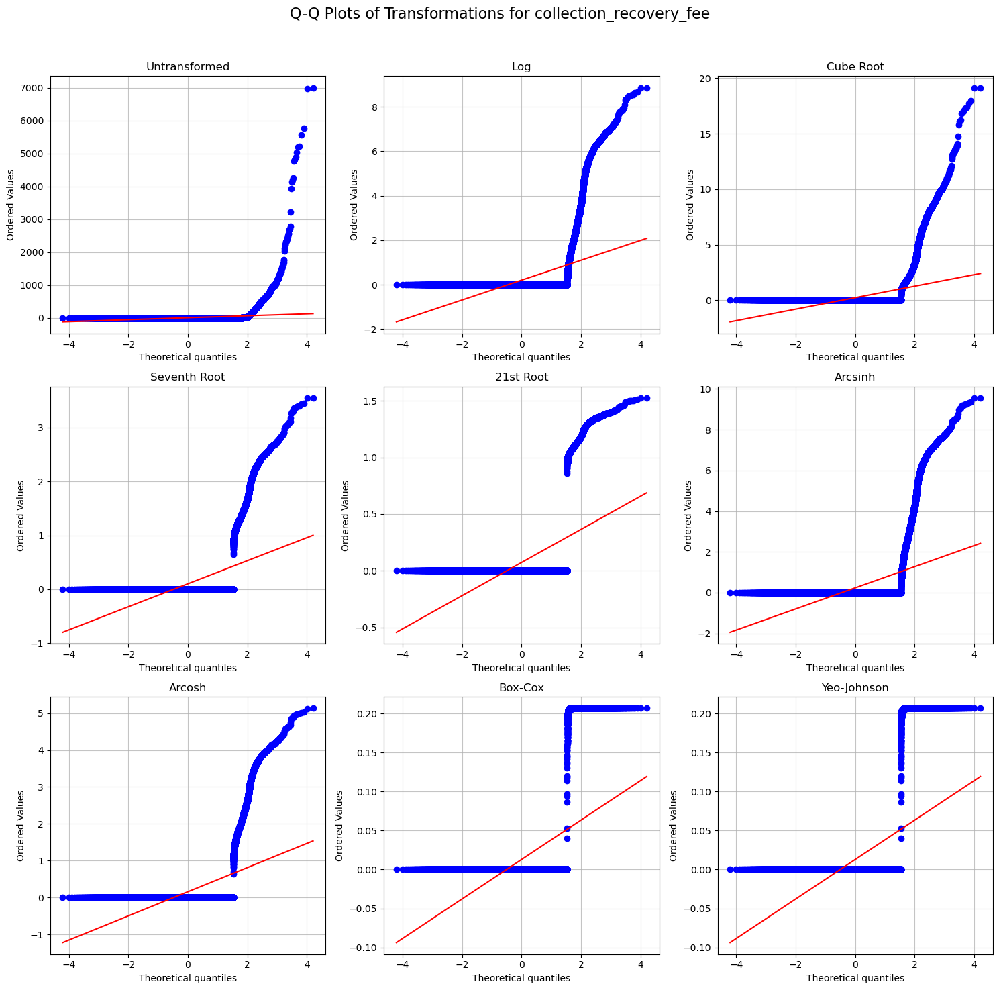

Comparing transformations for column: last_payment_amount


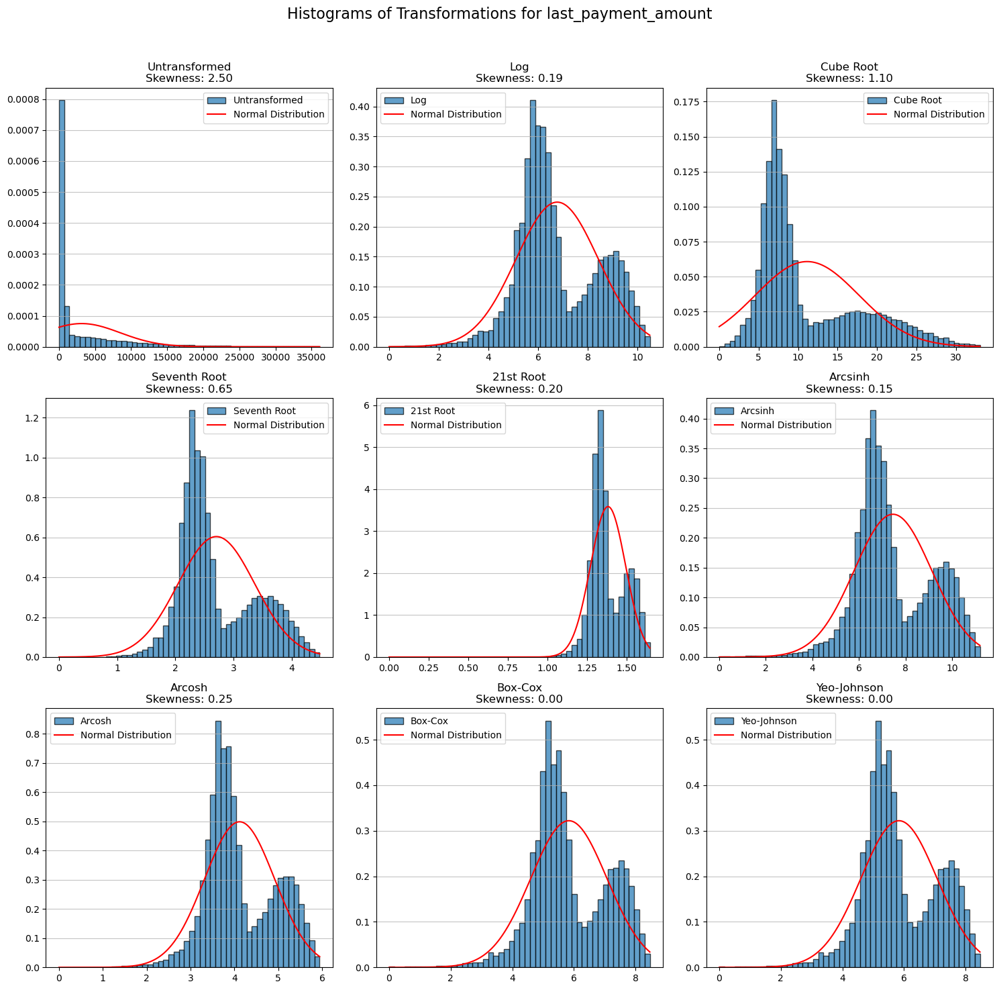

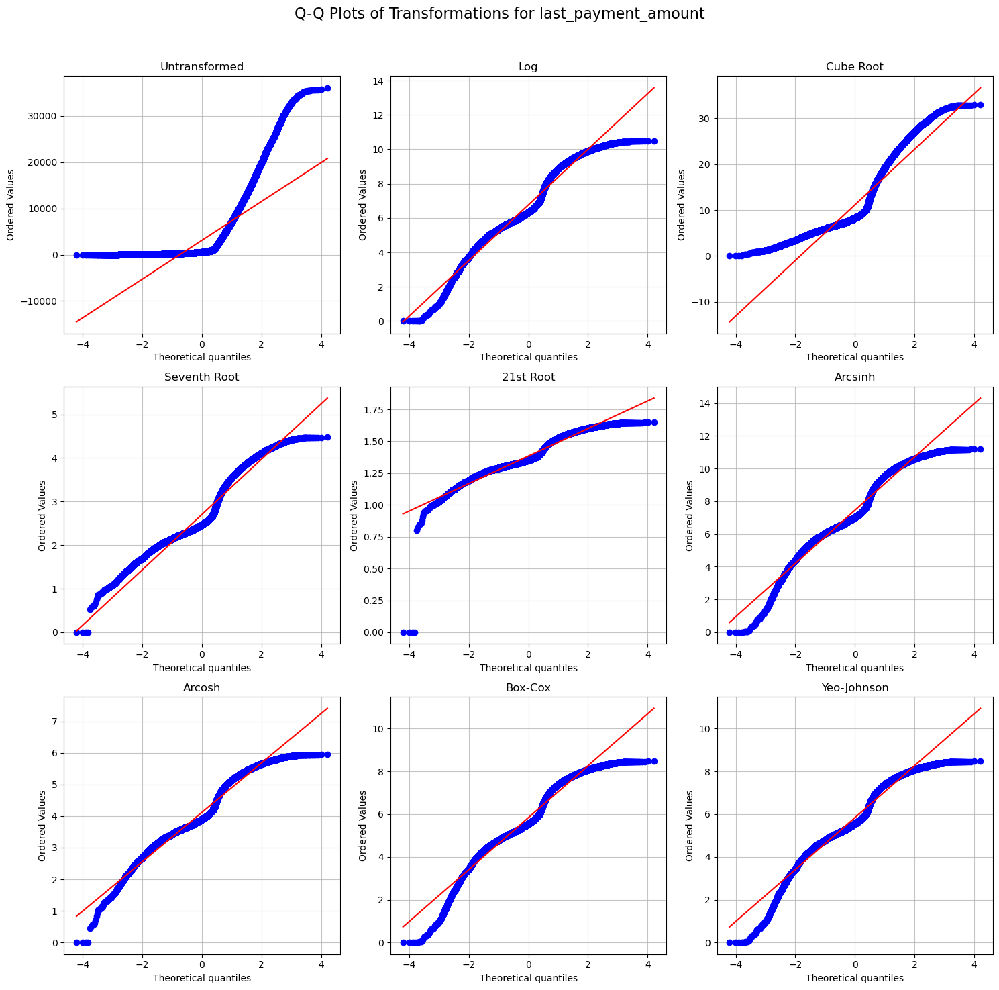

Comparing transformations for column: collections_12_mths_ex_med


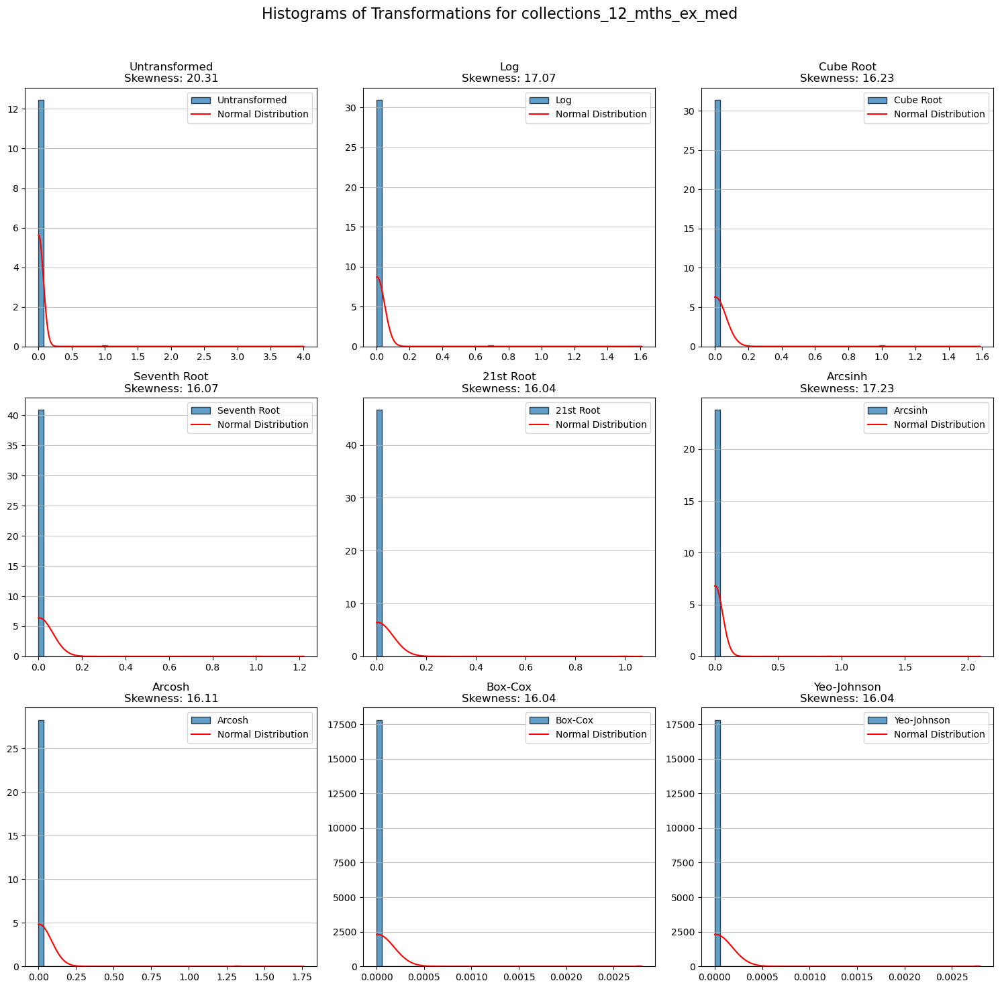

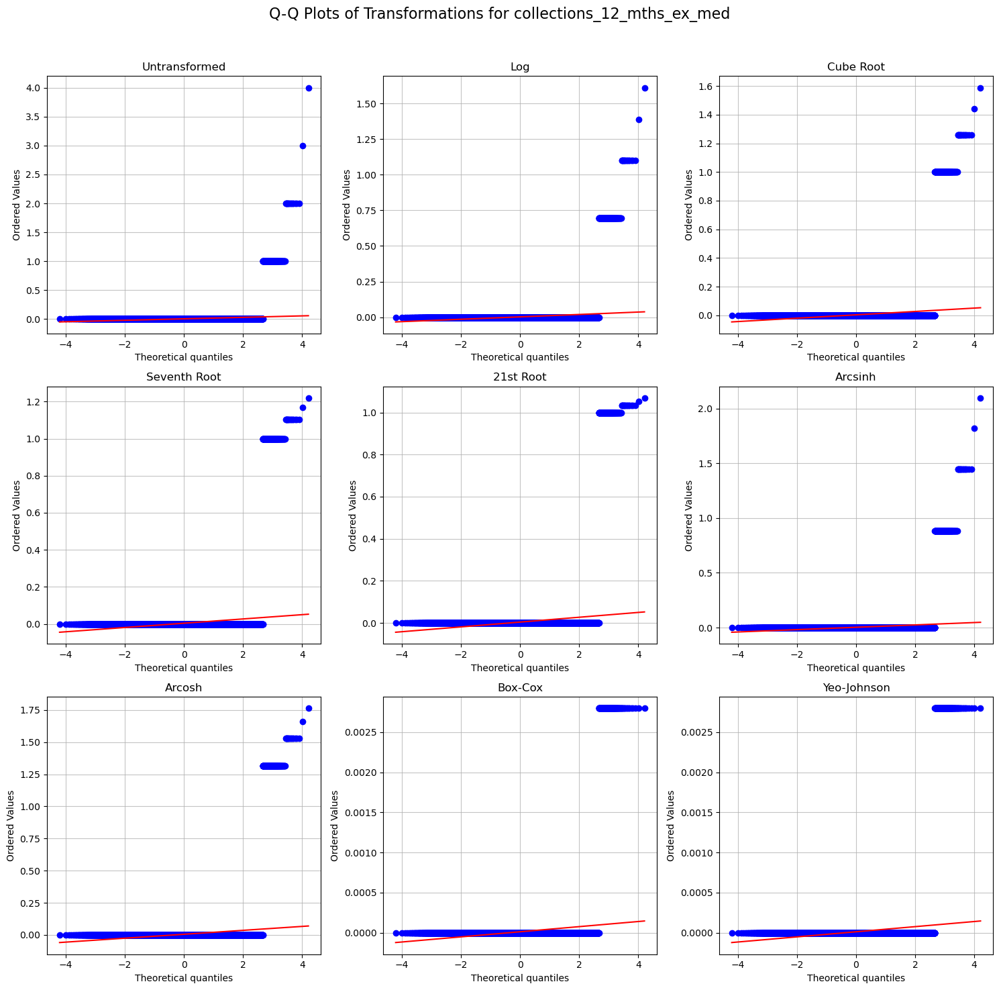

In [17]:
cleaned_data_transform=DataFrameTransform(revised_df)

plot.compare_transformations(cleaned_data_transform.apply_all_transforms())

## Transformations to be used 

### id
Transformation: **Seventh Root**

The following transformation results in biggest reduction of skewness.

### member id
Transformation: **Seventh Root**

Just like for id, power of (1/7) transformation minimises skew.

### loan_amount
Transformation: **Yeo-Johnson**

Reduces skewness.

### funded_amount
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### funded_amount_inv
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### term
Note: **Untransformed / Discard** 

Cannot be modeled by a normal distribution.

### int_rate
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### instalment
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### employment_length
Transformation: **Untransformed**

Optimal for skewness reduction. Can be modelled very well by normal distribution.

### annual_inc
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### dti
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### delinq_2yrs
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### inq_last_6mths
Transformation: **21st Root / Untransformed / Discard** 

Trnasfomration raising to power of (1/21) minimizes skew, but still has a very unastisafactory look against the theoritical normal.
### open_accounts
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### total_accounts
Transformation: **Yeo-Johnson**

Optimal for skewness reduction.

### out_prncp
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### out_prncp_inv
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### total_payment
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### total_payment_inv
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### total_rec_prncp
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### total_rec_int
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### total_rec_late_fee
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### recoveries
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### collection_recovery_fee
Transformation: **21st Root**

Yeo-Johnson offers minimaly more skew reduction, but respectively decision was made to switch to 21st rew, due to instablilty issue of the model used for inversing this transfomation at later stages of project. 

### last_payment_amount
Transformation: **Yeo-Johnson**

Optimal skew reduction.

### collections_12_mths_ex_med
Transformation: **21st Root**

Optimal skew reduction.

In [18]:
column_transform_map = {
    'id': ['seventh_root'],
    'member_id': ['seventh_root'],
    'loan_amount': ['yeo_johnson'],
    'funded_amount': ['yeo_johnson'],
    'funded_amount_inv': ['yeo_johnson'],
    'term': ['untransformed'],  # No transformation or discard
    'int_rate': ['yeo_johnson'],
    'instalment': ['yeo_johnson'],
    'employment_length':['untransformed'],
    'annual_inc': ['yeo_johnson'],
    'dti': ['yeo_johnson'],
    'delinq_2yrs': ['yeo_johnson'],  # Consider discarding based on distribution fit
    'inq_last_6mths': ['twenty_first_root'],  # Consider discarding based on distribution fit
    'open_accounts': ['yeo_johnson'],
    'total_accounts': ['yeo_johnson'],
    'out_prncp': ['yeo_johnson'],  # Consider discarding based on distribution fit
    'out_prncp_inv': ['yeo_johnson'],  # Consider discarding based on distribution fit
    'total_payment': ['yeo_johnson'],
    'total_payment_inv': ['yeo_johnson'],
    'total_rec_prncp': ['yeo_johnson'],
    'total_rec_int': ['yeo_johnson'],
    'total_rec_late_fee': ['yeo_johnson'],  # Consider discarding based on distribution fit
    'recoveries': ['yeo_johnson'],  # Consider discarding based on distribution fit
    'collection_recovery_fee': ['twenty_first_root'],  # Consider discarding based on distribution fit
    'last_payment_amount': ['yeo_johnson'],
    'collections_12_mths_ex_med': ['twenty_first_root']  # Consider discarding based on distribution fit
}

transformer = DataFrameTransform(revised_df)
transformed_df = transformer.apply_selected_transforms(column_transform_map)

#  Save transformation state for inverse later - Box Cox and Yeo-Johnson
state = transformer.export_transformation_state()

### Histograms of transformed data

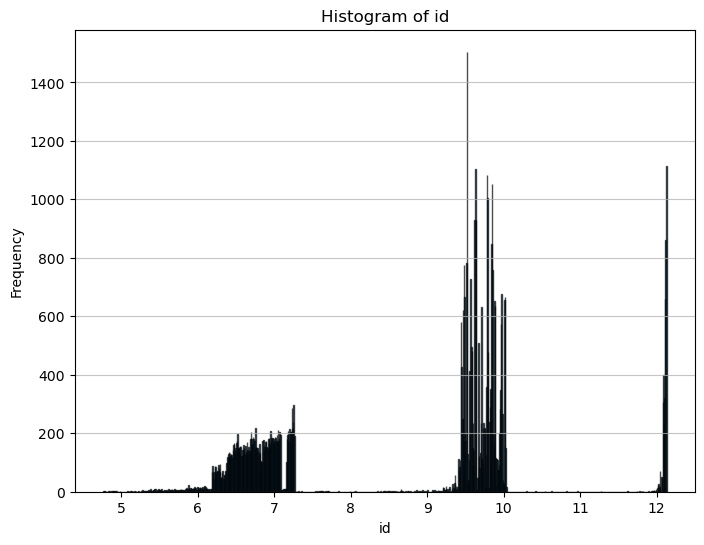

The skew of id column is -0.007691052305248658


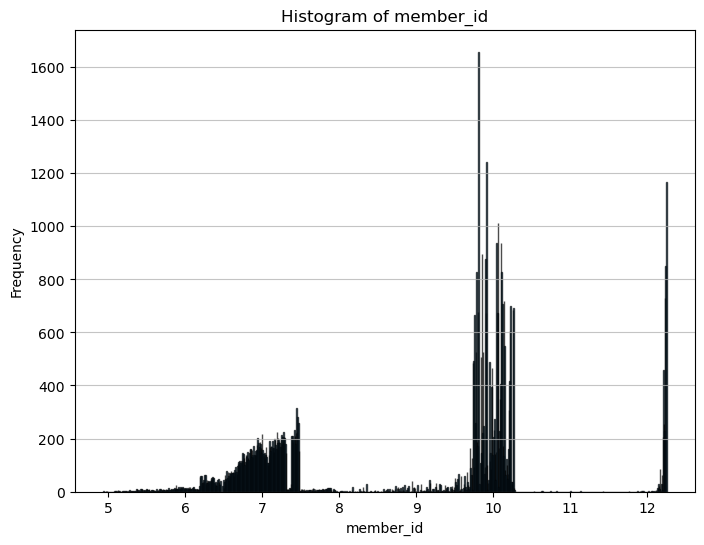

The skew of member_id column is -0.042676039514054985


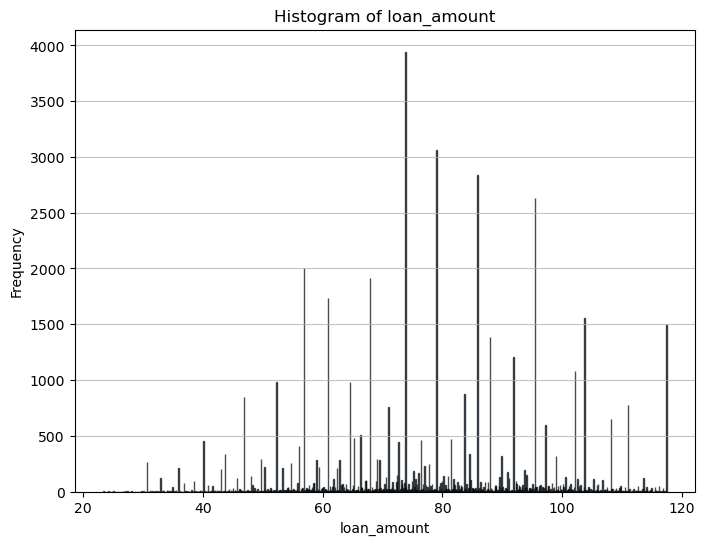

The skew of loan_amount column is -0.04306854934493644


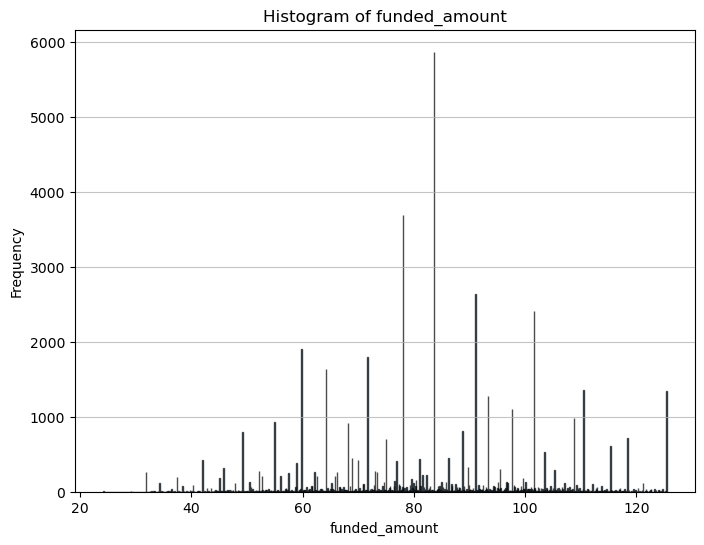

The skew of funded_amount column is -0.03010876679526659


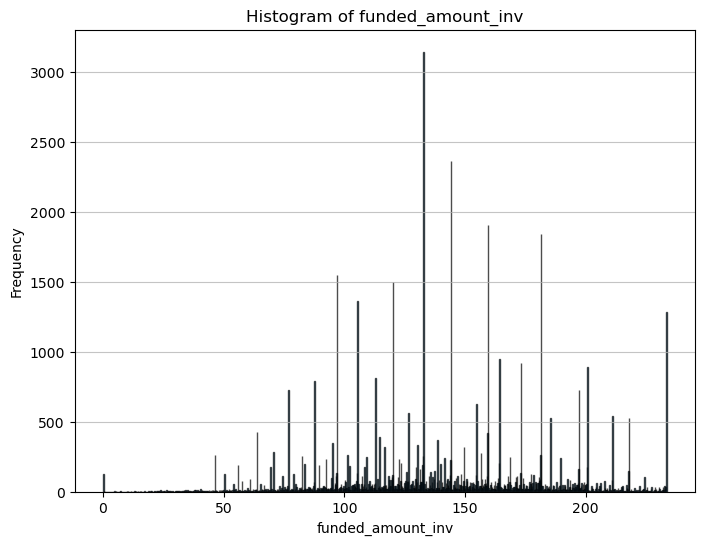

The skew of funded_amount_inv column is -0.03608604717662096


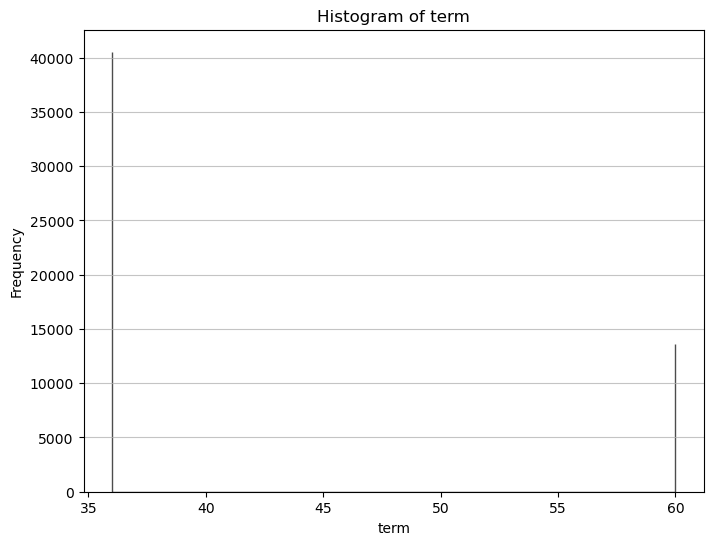

The skew of term column is 1.1477822801014974


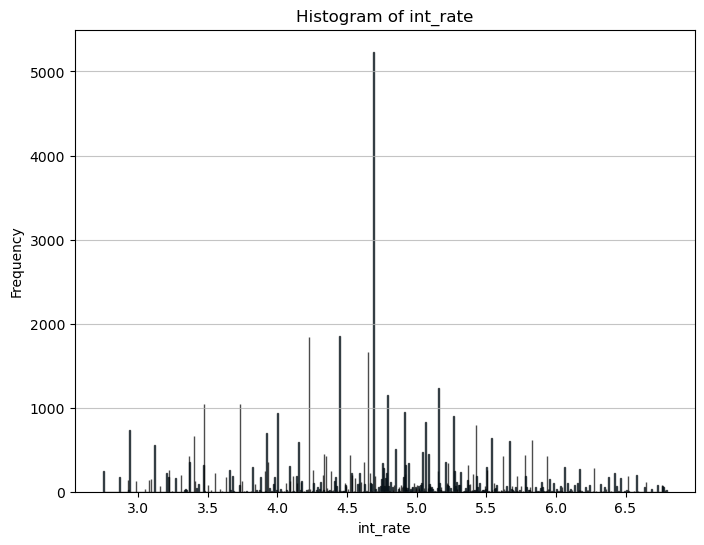

The skew of int_rate column is -0.0110623117756715


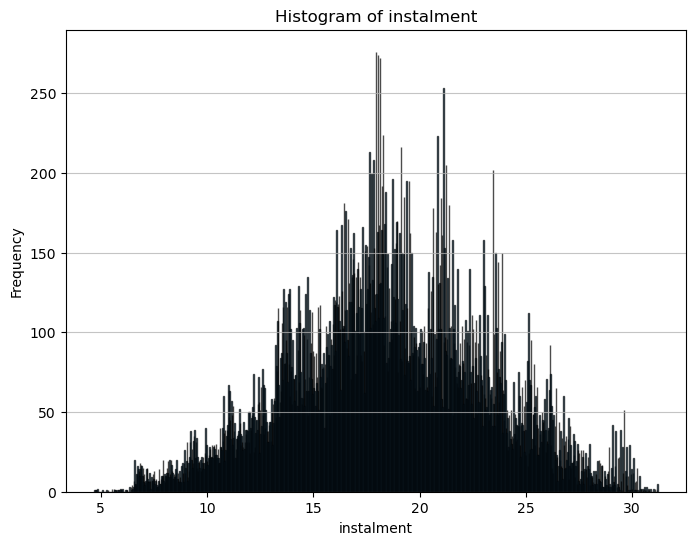

The skew of instalment column is -0.020656371576979367
Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


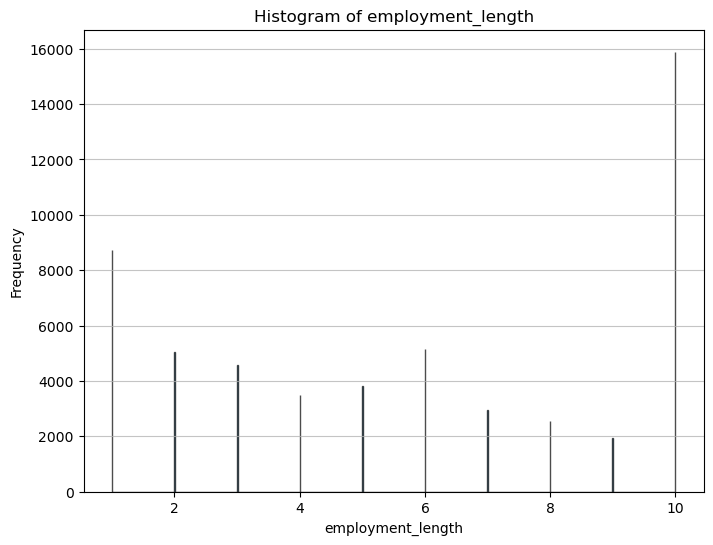

The skew of employment_length column is -0.03950845750136528
Skipping non-numeric column: home_ownership


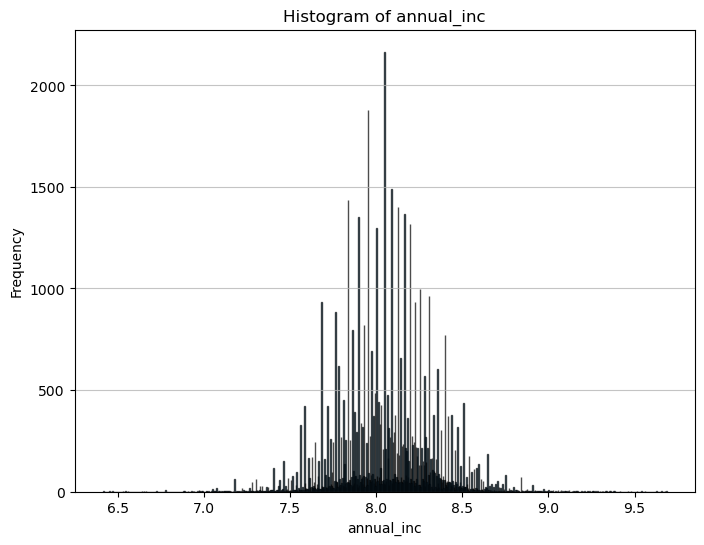

The skew of annual_inc column is -0.012083887415680603
Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


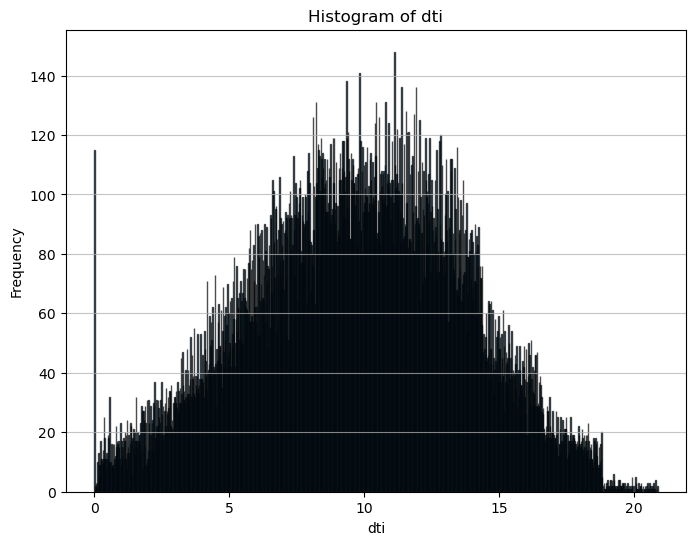

The skew of dti column is -0.0874816995059566


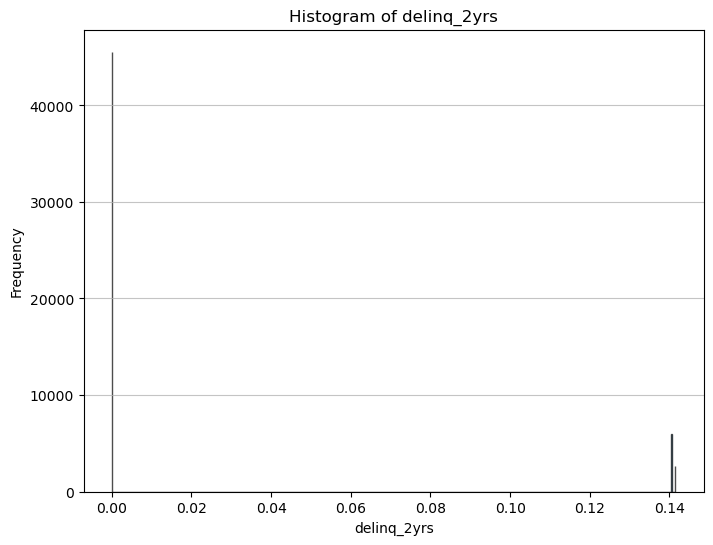

The skew of delinq_2yrs column is 1.869496400096666
Skipping non-numeric column: earliest_credit_line


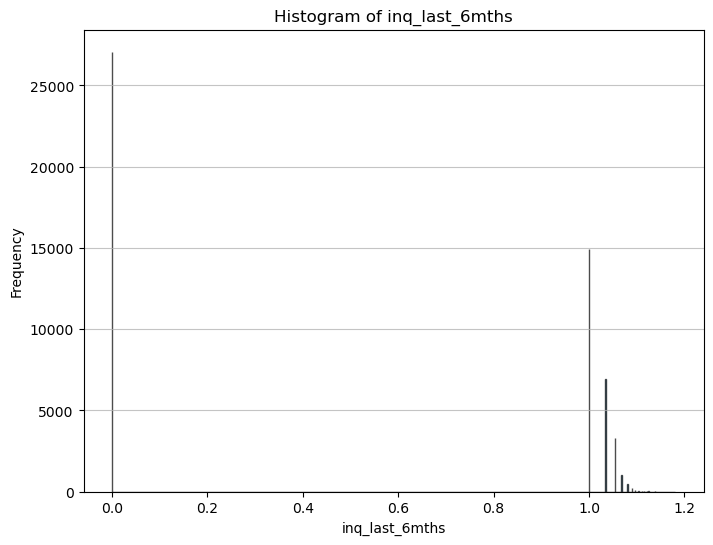

The skew of inq_last_6mths column is 0.0041775802446966815


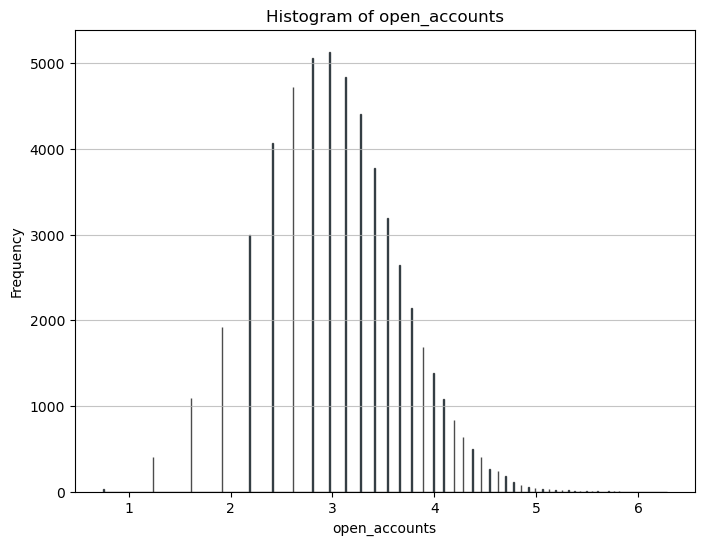

The skew of open_accounts column is 0.0018142269140536558


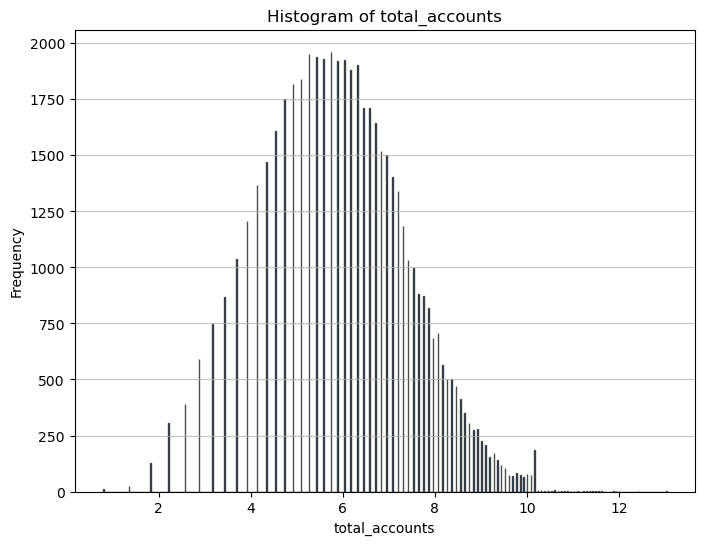

The skew of total_accounts column is -0.012624922088583285


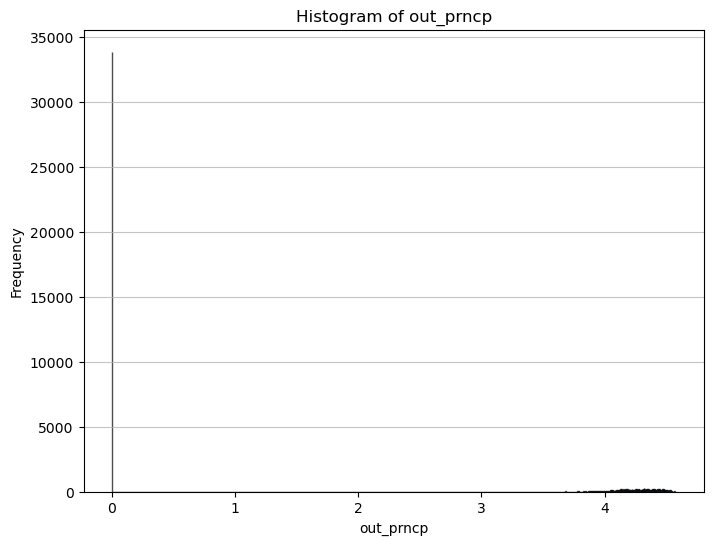

The skew of out_prncp column is 0.5306108723629779


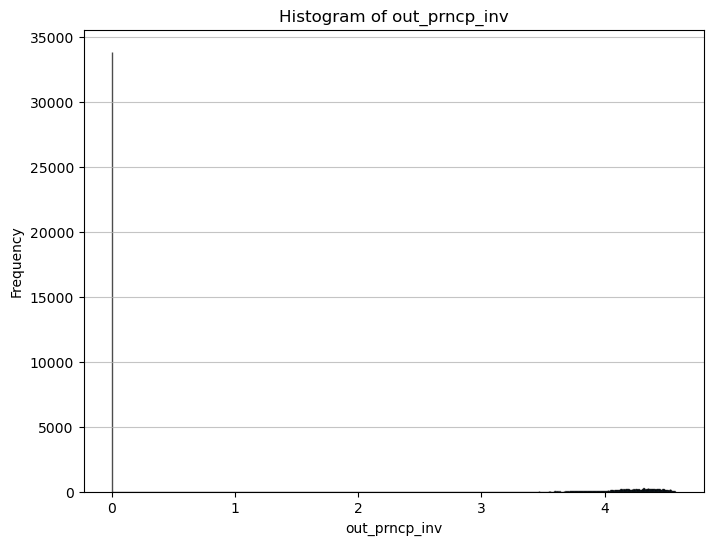

The skew of out_prncp_inv column is 0.5306286784081492


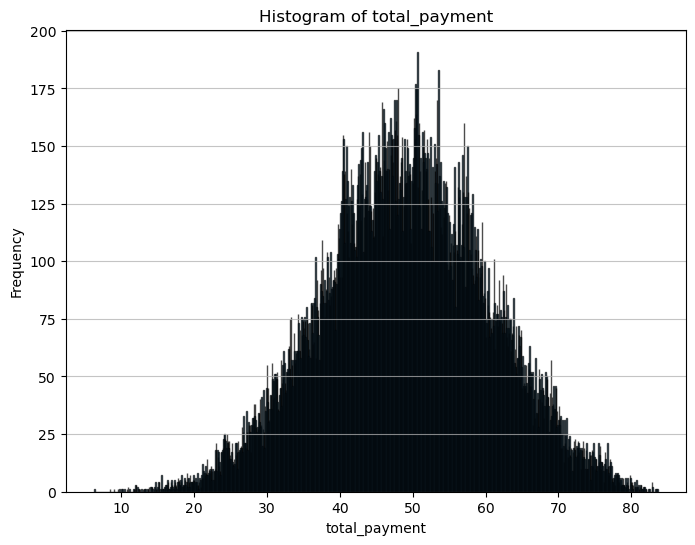

The skew of total_payment column is -0.01383610244829642


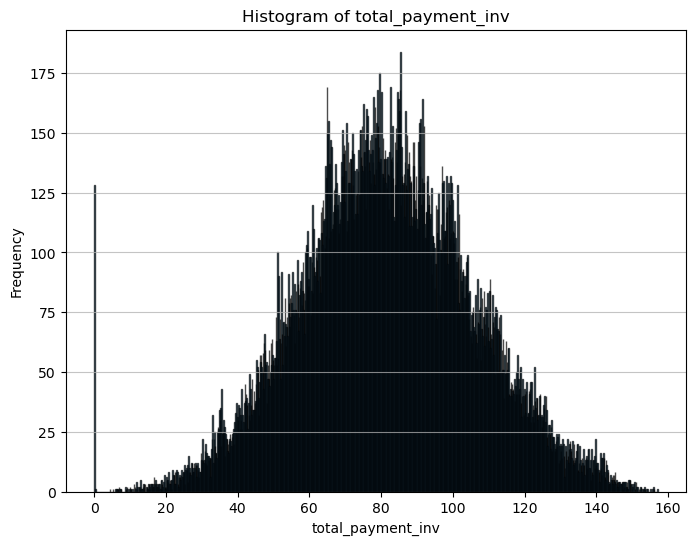

The skew of total_payment_inv column is 0.005207918915878544


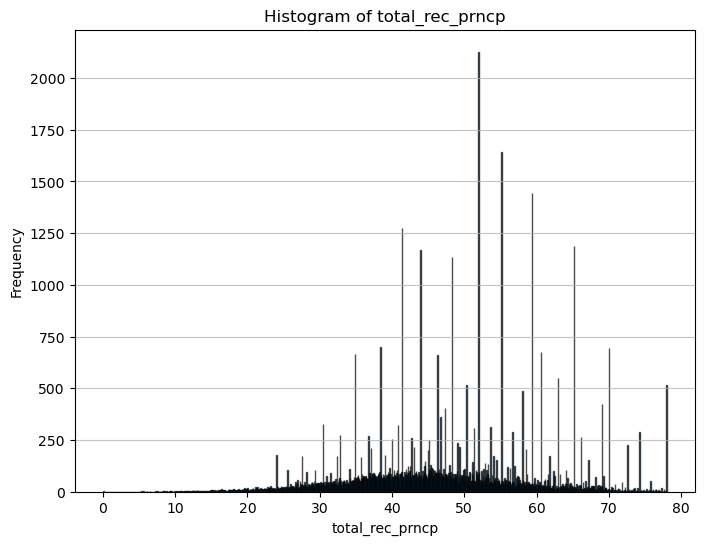

The skew of total_rec_prncp column is -0.017648397911901755


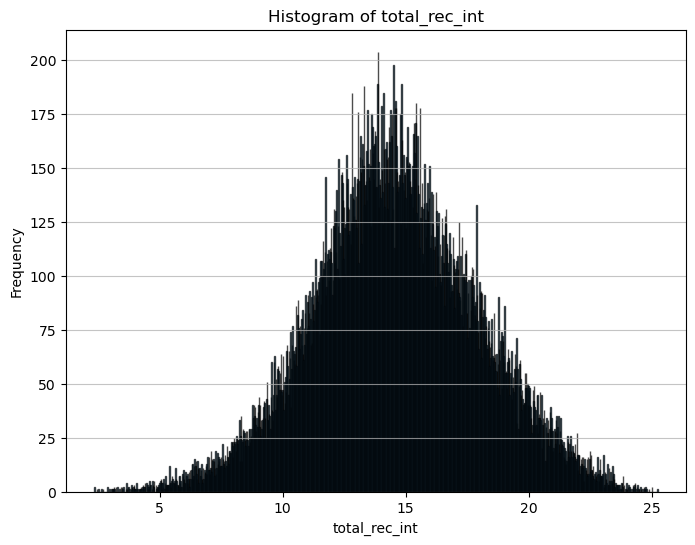

The skew of total_rec_int column is 0.001293101895916376


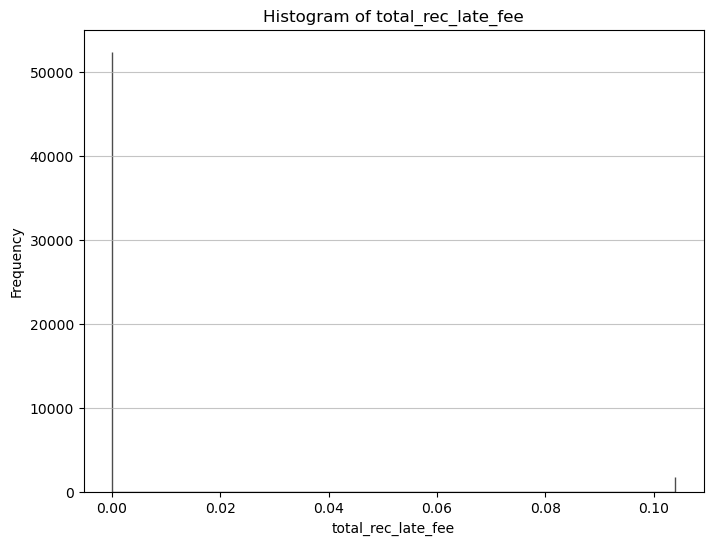

The skew of total_rec_late_fee column is 5.274700695622494


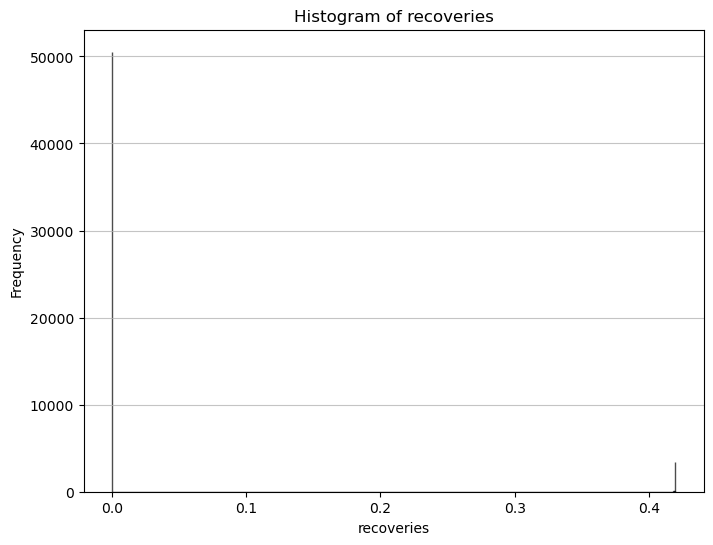

The skew of recoveries column is 3.4749152335656963


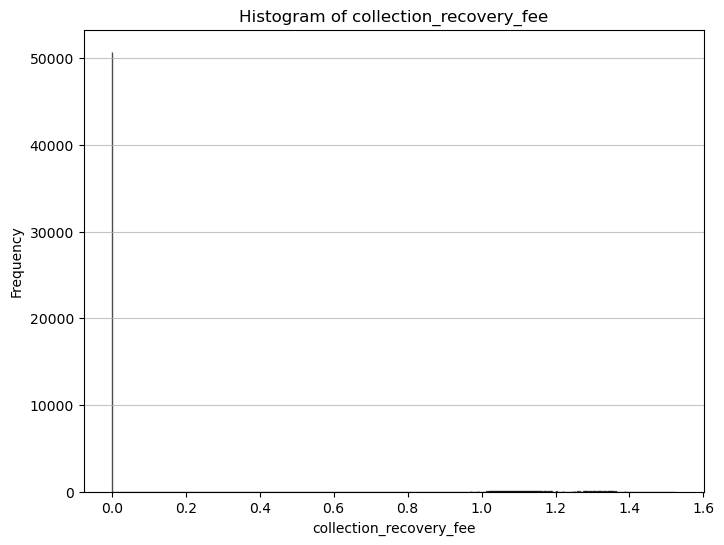

The skew of collection_recovery_fee column is 3.684541964802842
Skipping non-numeric column: last_payment_date


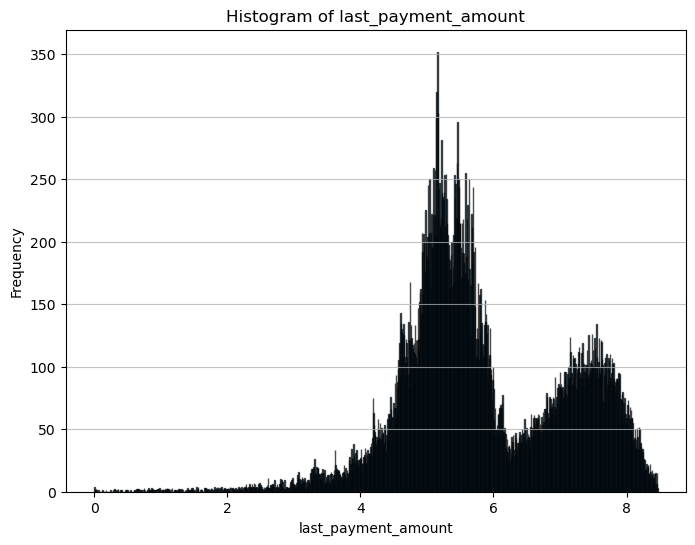

The skew of last_payment_amount column is 0.0013467100721125454
Skipping non-numeric column: last_credit_pull_date


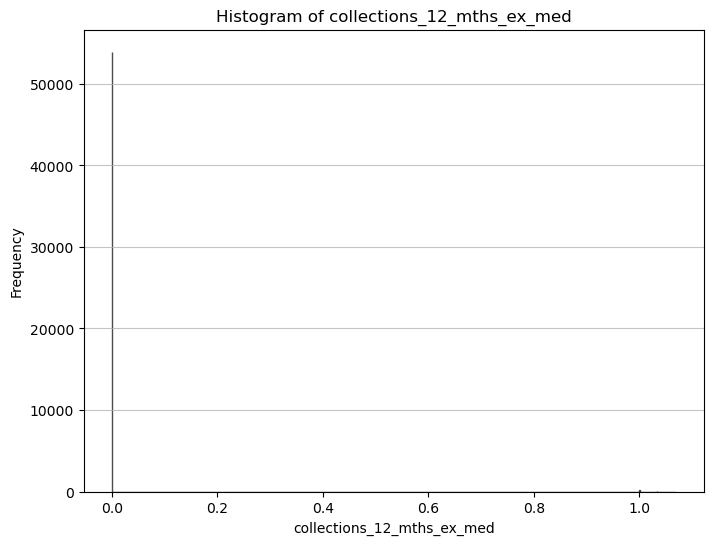

The skew of collections_12_mths_ex_med column is 16.045005653056187


In [19]:
plot_transformed=Plotter(transformed_df)

plot_transformed.histogram()

## Outliers 

There is couple of things to note about outlier removal. Just, because certain data point appears with frequency much greater then others, it does not mean, that it's an outlier. A lot of points which could potentially be classed as outliers at first glance occur at zero value or low end of the range. For instance delinq_2yr: The number of 30+ days past-due payments in the borrower's credit file for the past 2 years has spike near 0. This makes sense as many customers would have no such 30+ day periods. Hence such points will not be classed as outliers. Further more since the data in multidimensional in the sense that one point has one value for each of the many financial variables ,removing one point thus corresponds to removing one row from a data frame. A large loss of data. For this reason a cautions approach was taken when removing outliers. Only values in int_rate was considered to be outlier. For interest rate it seemed strange that there one interest rate that is much more common the others in the middle of the range of values.  

In [20]:
transformer = DataFrameTransform(transformed_df)
revised_df = transformer.remove_strand_outlier('int_rate', bin_count=1000, frequency_ratio_threshold=50.0)


[Strand Outlier Removal] Removed 5237 rows from 'int_rate' in bin range [4.69, 4.69]


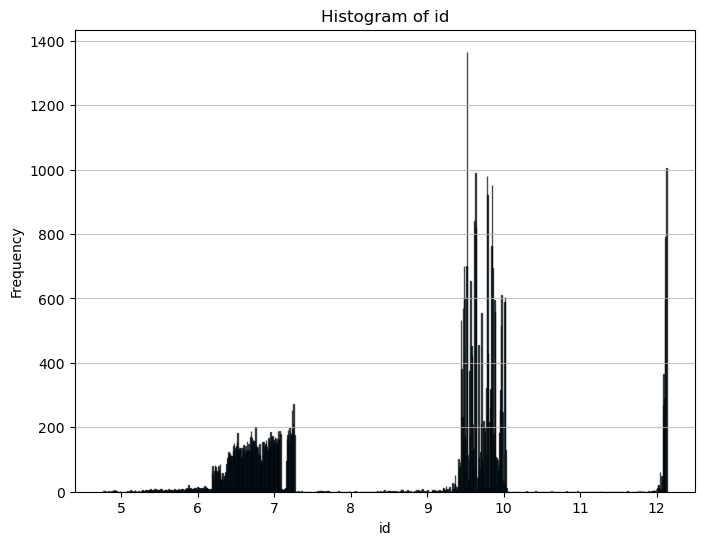

The skew of id column is -0.009138537263136286


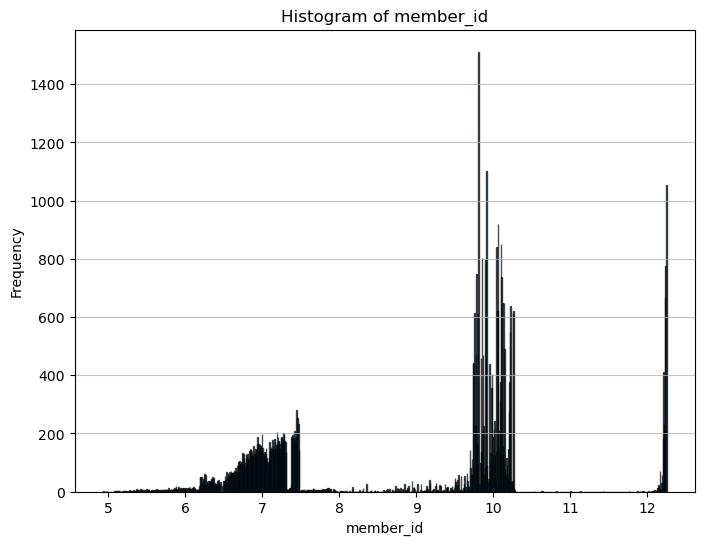

The skew of member_id column is -0.0448745065740226


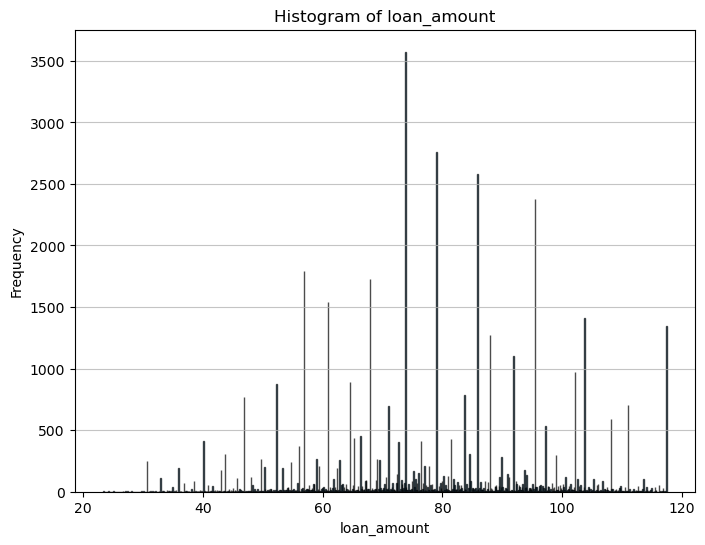

The skew of loan_amount column is -0.047194465127402475


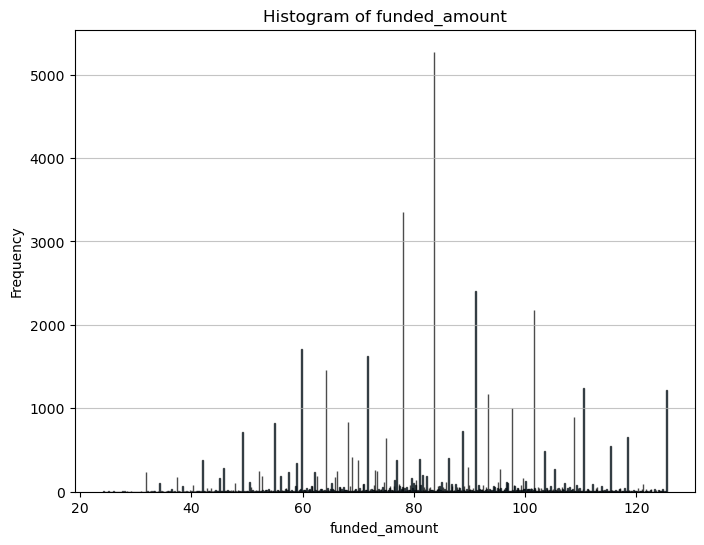

The skew of funded_amount column is -0.03396125734440669


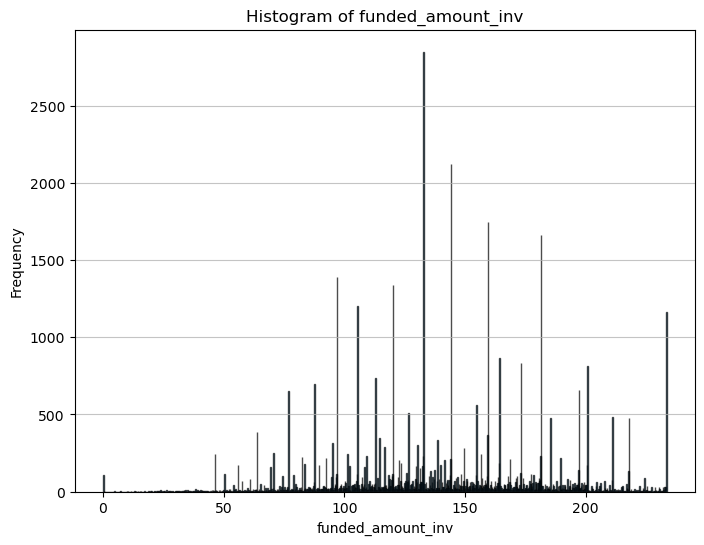

The skew of funded_amount_inv column is -0.03898252562426157


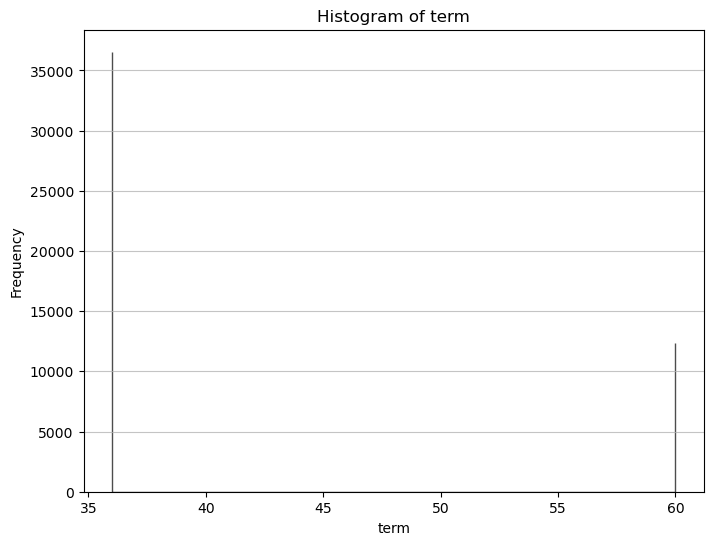

The skew of term column is 1.1382674203921332


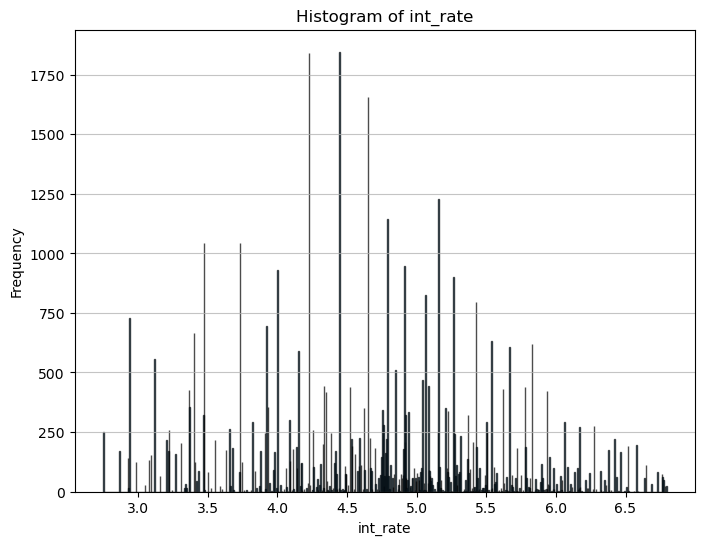

The skew of int_rate column is -0.006604256922058697


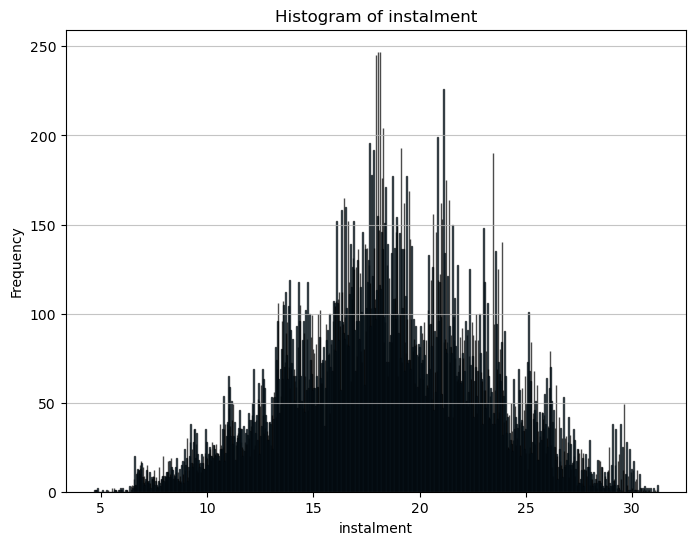

The skew of instalment column is -0.025734647510132925
Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


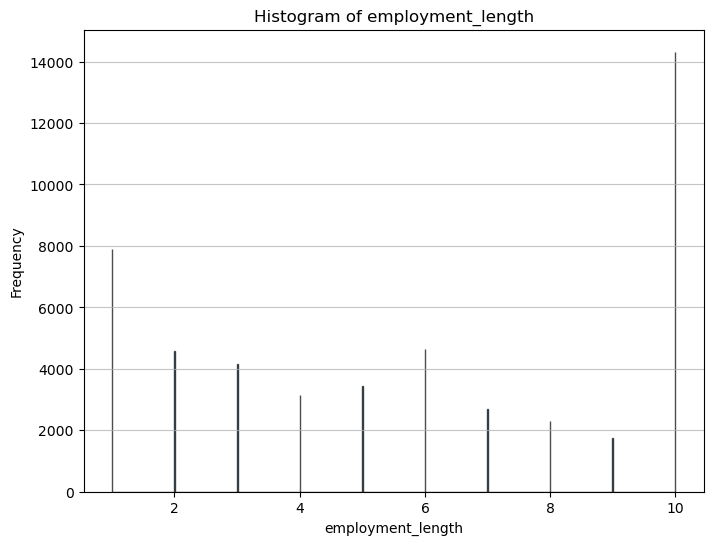

The skew of employment_length column is -0.03675005461174442
Skipping non-numeric column: home_ownership


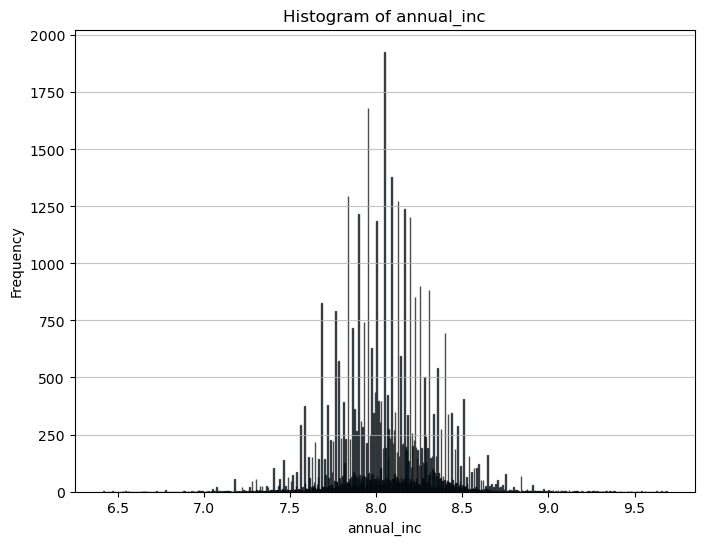

The skew of annual_inc column is -0.01675664669963932
Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


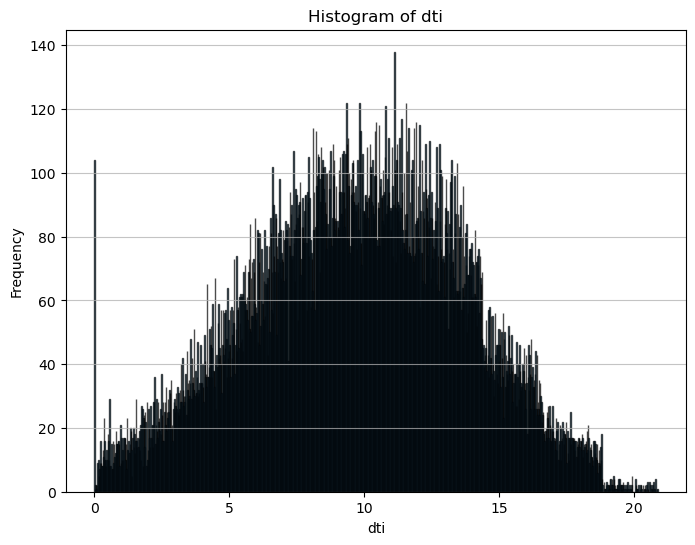

The skew of dti column is -0.08573243741386083


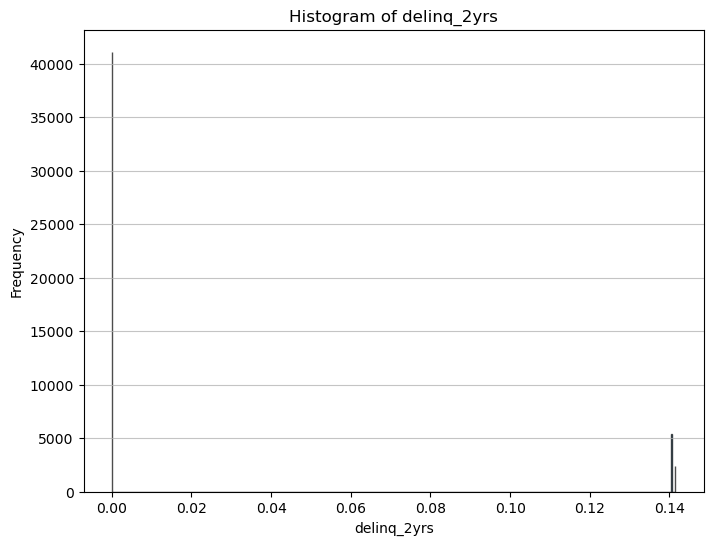

The skew of delinq_2yrs column is 1.8606263041762099
Skipping non-numeric column: earliest_credit_line


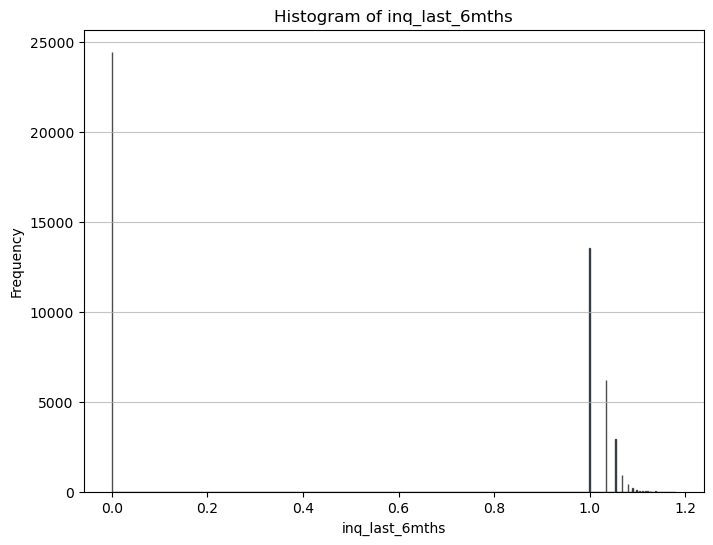

The skew of inq_last_6mths column is 0.0038356192708967974


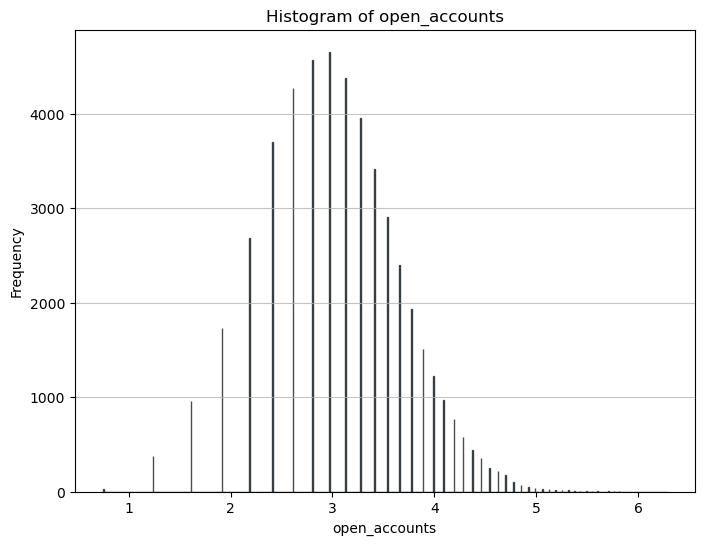

The skew of open_accounts column is 0.004362846266782818


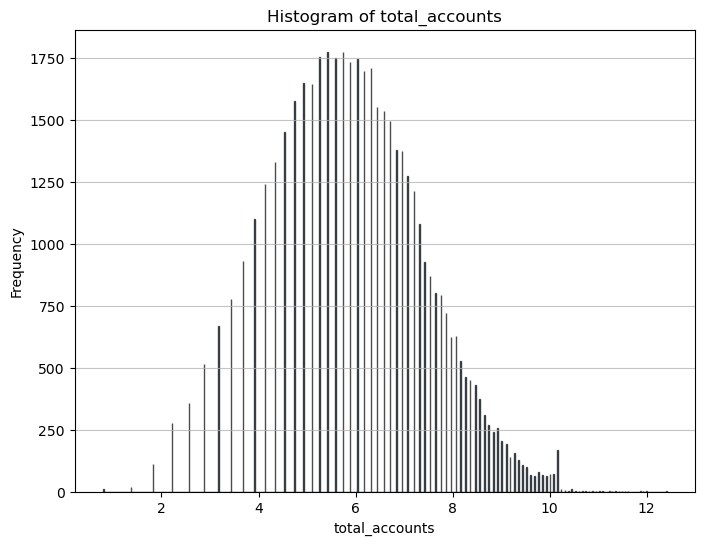

The skew of total_accounts column is -0.00973585316912473


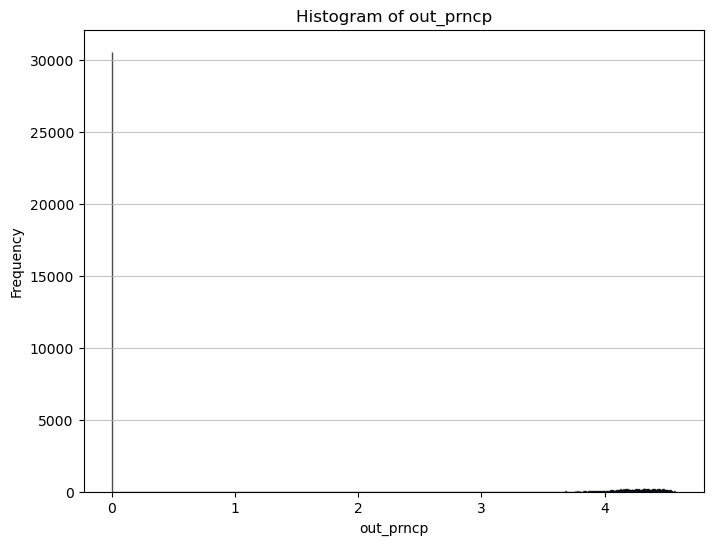

The skew of out_prncp column is 0.5302658621613097


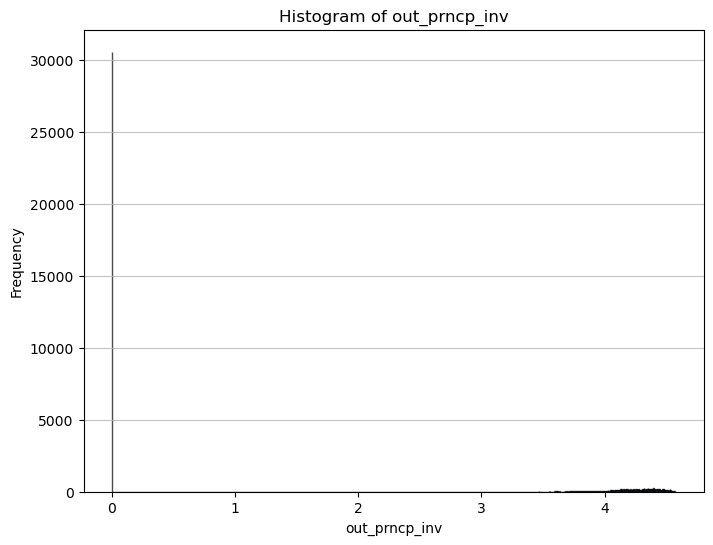

The skew of out_prncp_inv column is 0.5302779306802626


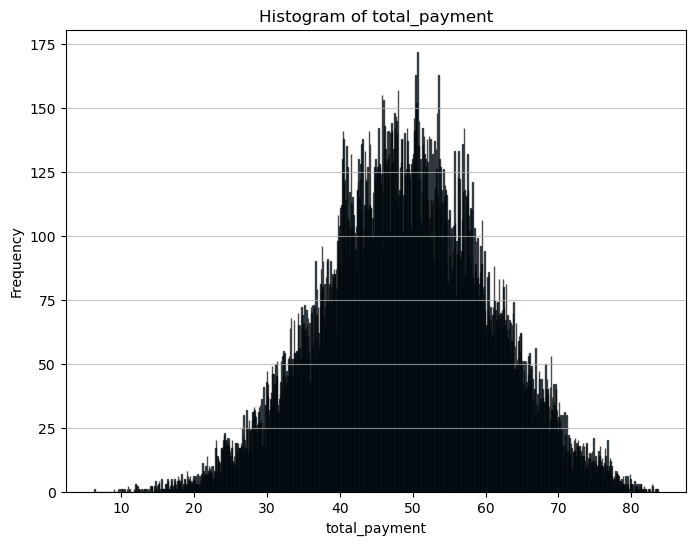

The skew of total_payment column is -0.016697452469525868


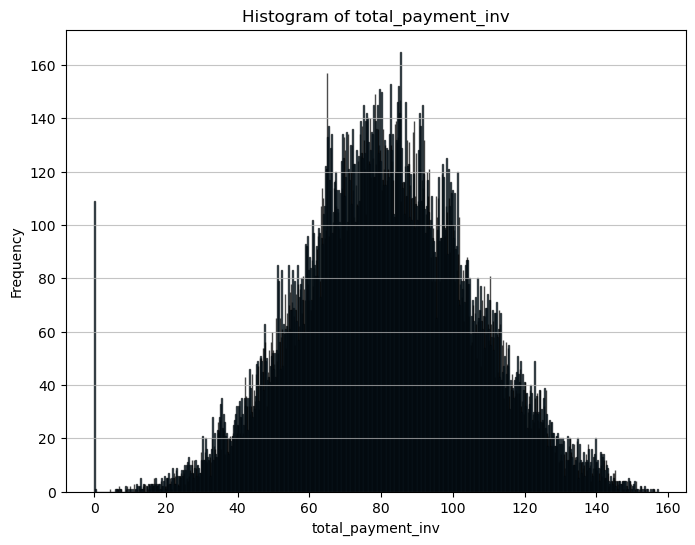

The skew of total_payment_inv column is 0.004836296208955448


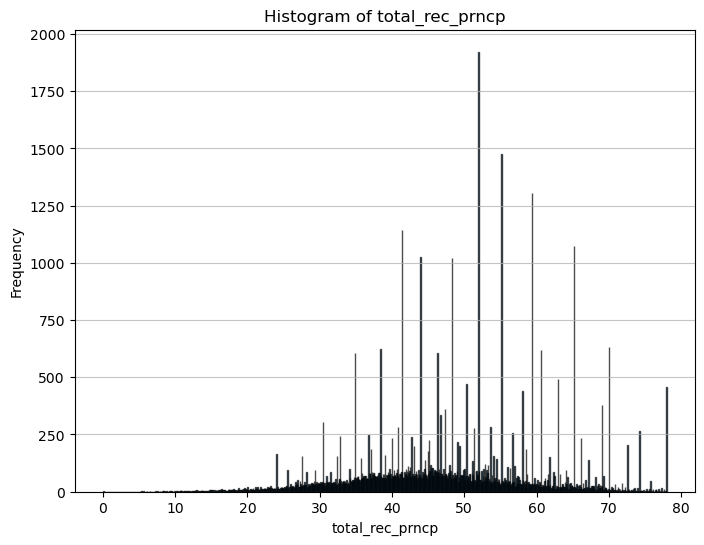

The skew of total_rec_prncp column is -0.01980619955531398


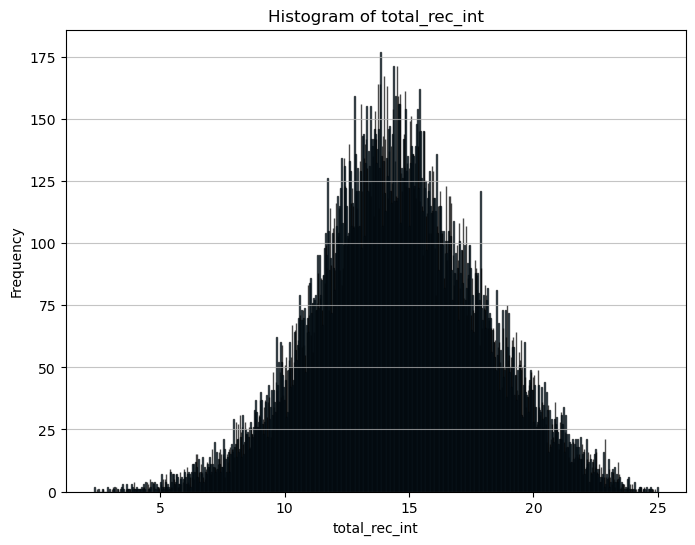

The skew of total_rec_int column is -0.004813172012225826


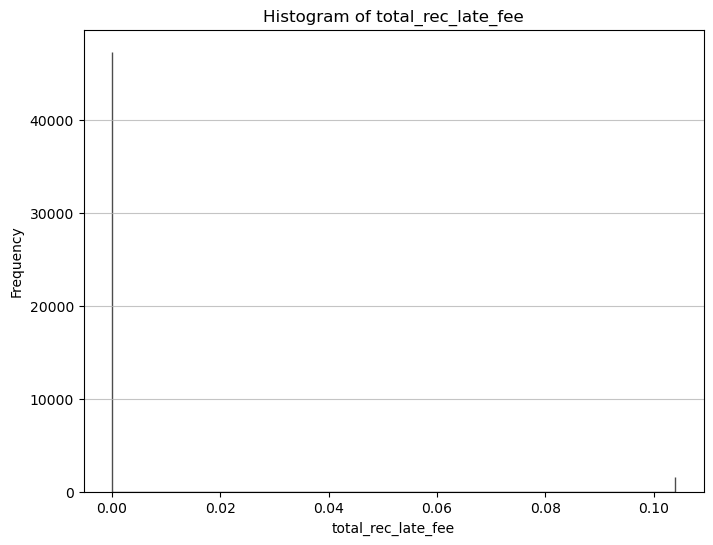

The skew of total_rec_late_fee column is 5.264280426590891


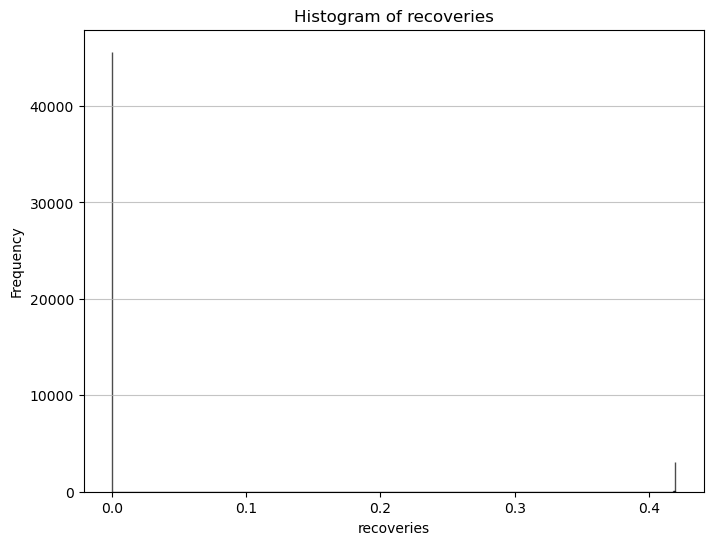

The skew of recoveries column is 3.462410507000958


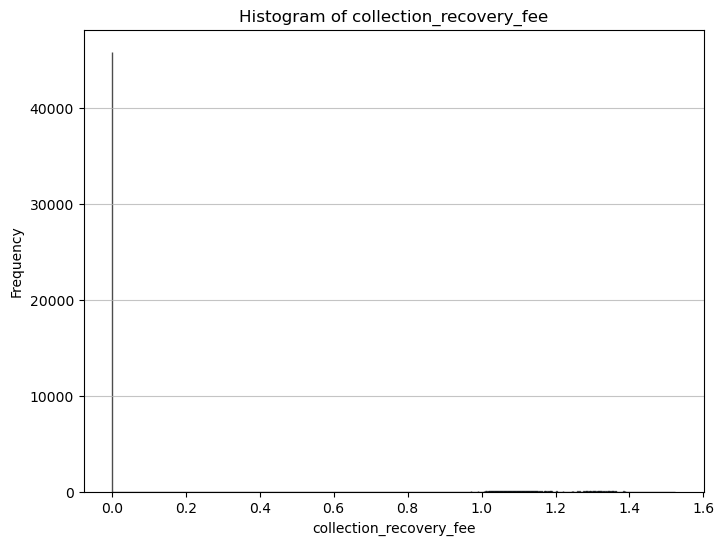

The skew of collection_recovery_fee column is 3.672814492932603
Skipping non-numeric column: last_payment_date


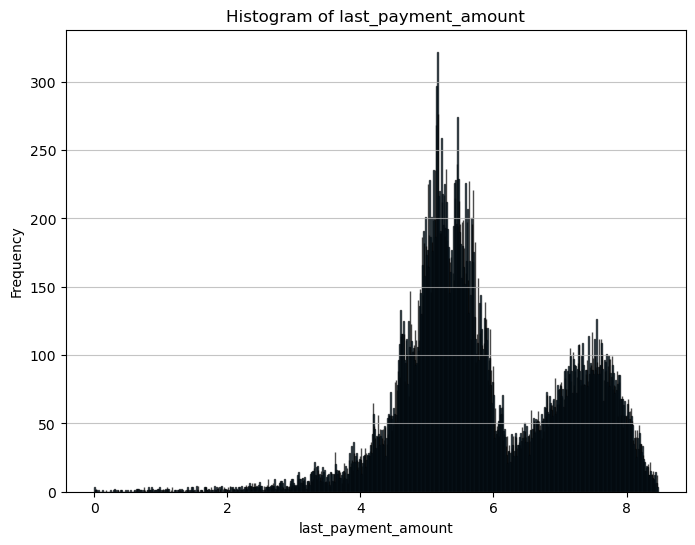

The skew of last_payment_amount column is 0.0019622370845410048
Skipping non-numeric column: last_credit_pull_date


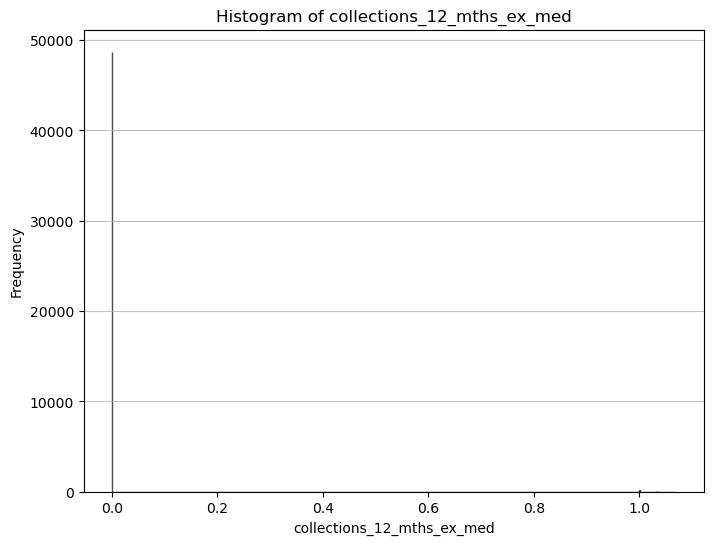

The skew of collections_12_mths_ex_med column is 15.828643761448498


In [21]:
plot_revised=Plotter(revised_df)

plot_revised.histogram()

## Colinearity

Now let's investigate the colinearity. Colinearity happens when two or more indepent variables in a regression model would have very strong correlation between each other, to the extent it would be possible derive one variable directly from the other. That means basically they provide the same info about the dependent variable. In this sense computational load increases without any extra useful information. In AI model this extra collinear data in a training set can sometimes bias the model. Thus it is good practice to drop variables to avoid colinearity. Below is heat map showing the pearson correlation coefficient between variables.

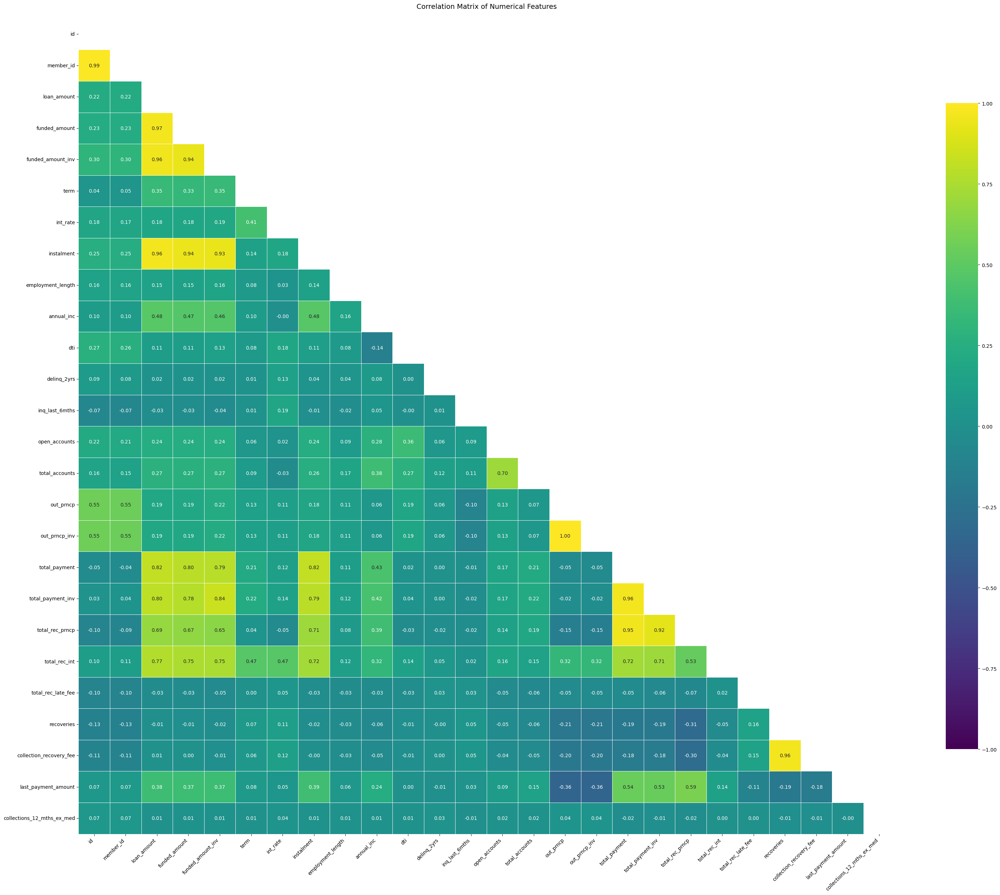

In [22]:
plot_revised.plot_correlation_heat_map()

I will assume that if pearson correlation coefficient value exceeds 0.9 that is an indication of collinearity and that is the indication that one variables may need to be droped.

### id and member_id

Even though a very strong colinearity with pearson coeeficient of 0.99 exists between the two, it is not logical that one can be derived from the other as ids are unique and even the smallest changes to id values result in completly different ids, hence despite the colinearity, neither variable will be dropped. 

### funded_amount & funded_amount_inv & loan amount & instalment 

The following variables are collinear with each other.

We should also keep in mind that:

**loan_amount:** Amount of loan the applicant received

**funded_amount:** The total amount committed to the loan at that point in time

**funded_amount_inv:** The total amount committed by investors for that loan at that point in time

**instalment:** The monthly payment owned by the borrower. This is inclusive of the interest.

Despite the inherent colinearity all these metrics might be useful when doing financial analysis in next section. Also no perfect collinearity (1.0), exists between any metrics, furthermore we will not employ an AI model in this project, so there is no risk of bising the model. For this reason none of those values will be dropped. 

### out_prncp & out_prncp_inv

Perfect collinearity exists between the variables, hence once can be exactly predicted from the other. Dropping the out_prncp_inv column.

### total_payment & total_payment_inv & total_re_prncp

Where:

**total_payment:** Payments received to date for total amount funded

**total_payment_inv:** The total amount of payments received to date for the portion of the loan funded by investors

**total_rec_prncp:** Total principal recieved to date.

All of these variables could be useful in fiancial analysis and there is no perfect colinearity between them. None will be dropped.

### collection_recovery_fee & total_recoveries

Again these variables could be useful in fiancial analysis and there is no perfect colinearity between them. 

In [23]:
revised_df = transformer.drop_column('out_prncp_inv')

Column 'out_prncp_inv' has been dropped.


/home/micha/Exploratory-Data-Analysis---Customer-Loans-in-Finance/data_manipulations.py:517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.eda_data_frame.drop(columns=[column_name], inplace=True)


In [24]:
plot_revised=Plotter(revised_df)

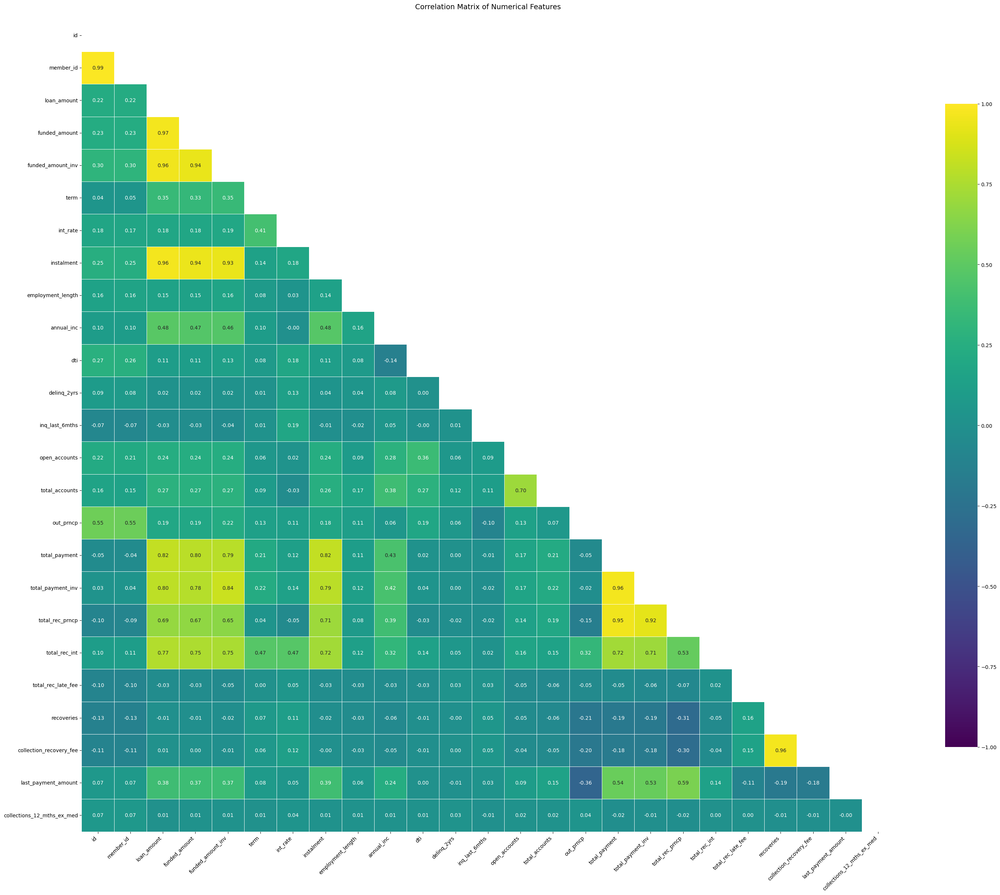

In [25]:
plot_revised.plot_correlation_heat_map()

The correlation matrix looks good, column out_prncp_inv has been dropped. The columns of the orginal dataframe have been transfomred to reduce skew. Let's now transform all the columns back so that we can conduct fincial analysis on the data. 

In [26]:
#Now that all data cleaning is complete let's get transofer object for inverse transforms
transformer_cleaned = DataFrameTransform(revised_df)
#For stateful inverse transforms we need to load states saved (box cox & yeo-johnson)
transformer_cleaned.import_transformation_state(state)

# Apply inverse transformations
recovered_df = transformer_cleaned.apply_inverse_column_transforms(column_transform_map)

/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountere

[Inverse] Column 'out_prncp_inv' not applied. Reason: not in current frame or inverse output.


/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/home/micha/miniconda3/envs/work_env/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:3453: RuntimeWarning: divide by zero encountere

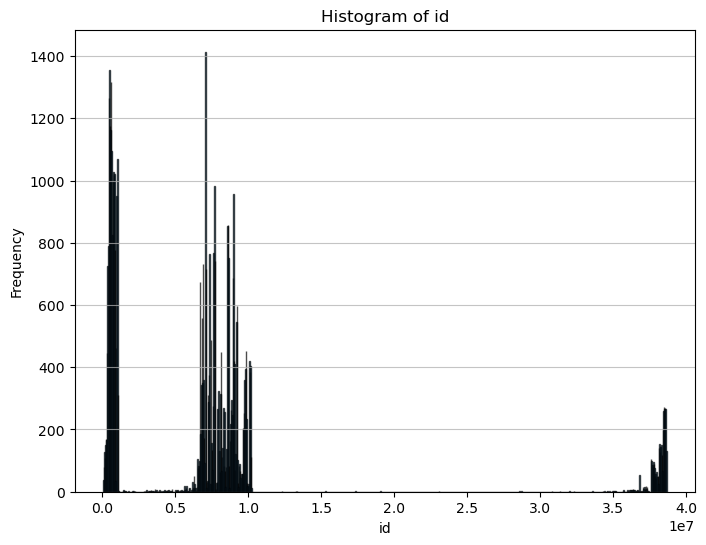

The skew of id column is 2.3675089047965847


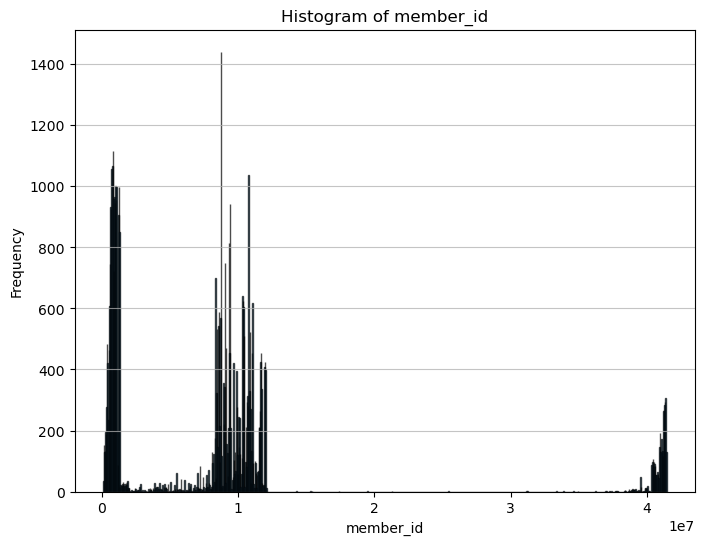

The skew of member_id column is 2.202881678751748


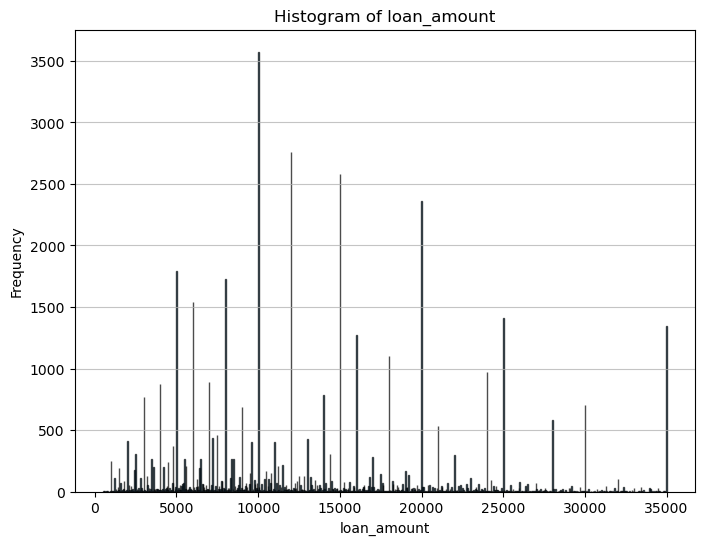

The skew of loan_amount column is 0.8022400975658456


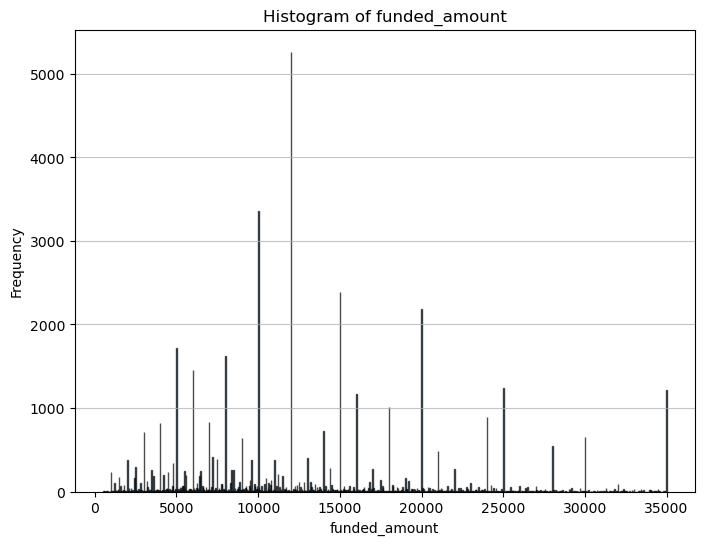

The skew of funded_amount column is 0.8658204665760612


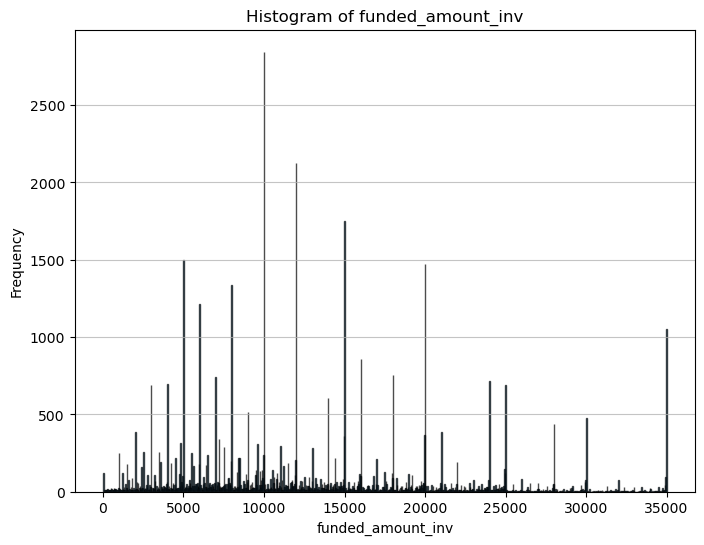

The skew of funded_amount_inv column is 0.8102675347772809


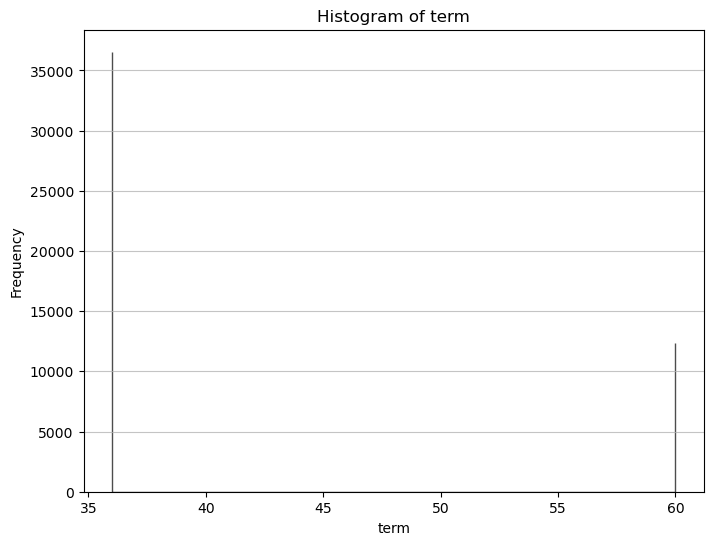

The skew of term column is 1.1382674203921332


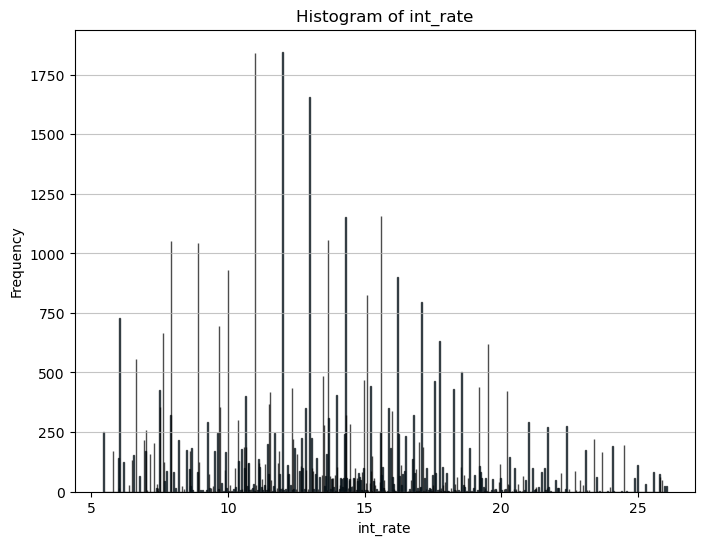

The skew of int_rate column is 0.41156040733331317


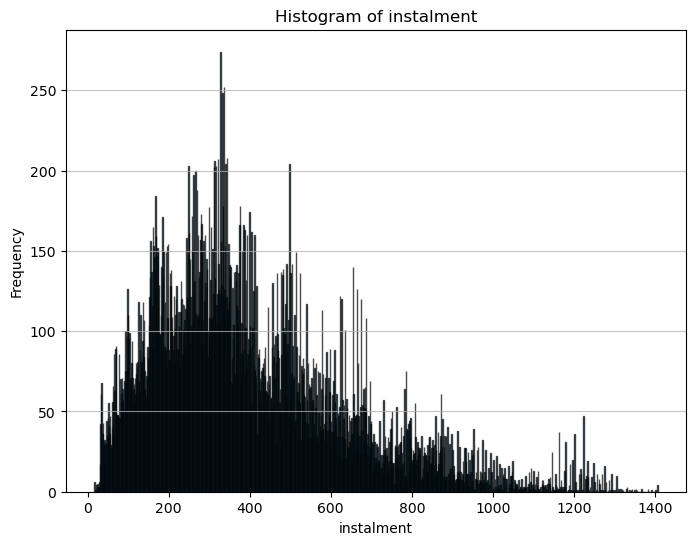

The skew of instalment column is 0.9948830458554936
Skipping non-numeric column: grade
Skipping non-numeric column: sub_grade


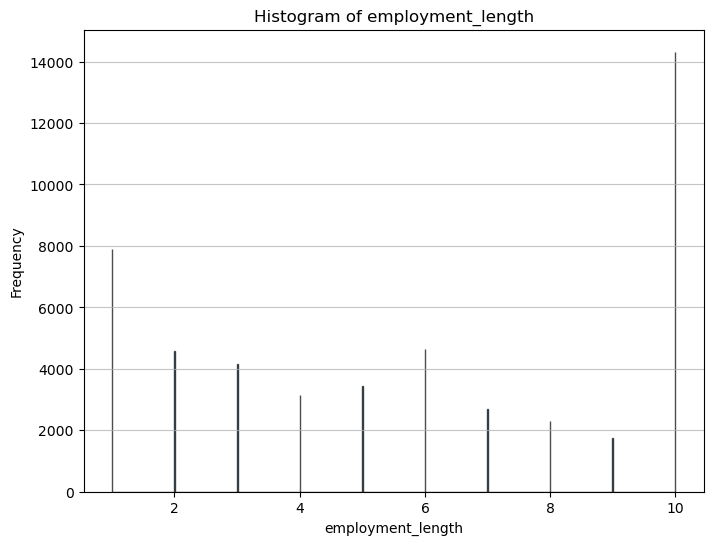

The skew of employment_length column is -0.03675005461174442
Skipping non-numeric column: home_ownership


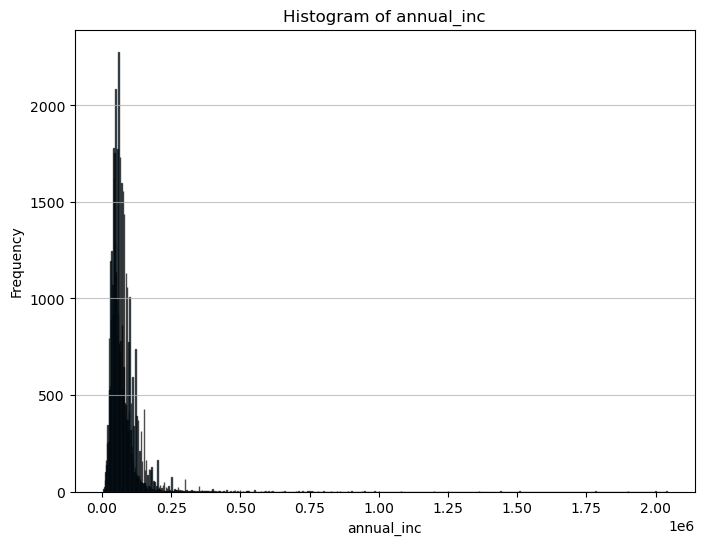

The skew of annual_inc column is 9.055060341470437
Skipping non-numeric column: verification_status
Skipping non-numeric column: issue_date
Skipping non-numeric column: loan_status
Skipping non-numeric column: payment_plan
Skipping non-numeric column: purpose


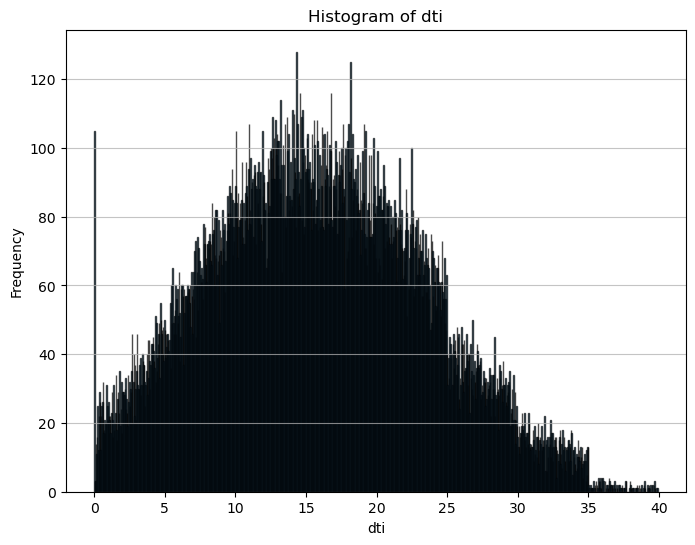

The skew of dti column is 0.19036238937644331


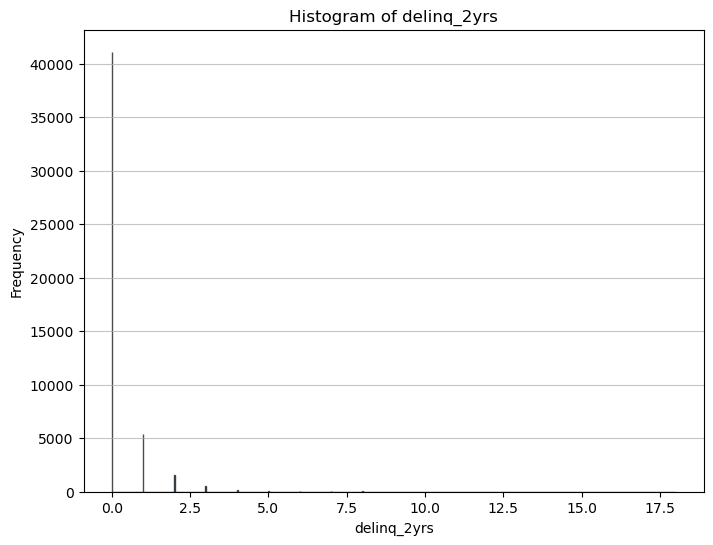

The skew of delinq_2yrs column is 5.449076623121758
Skipping non-numeric column: earliest_credit_line


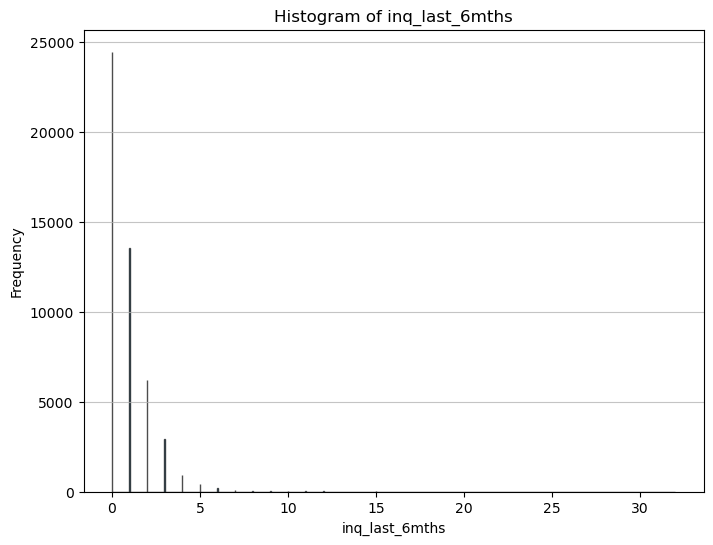

The skew of inq_last_6mths column is 3.0071060811013264


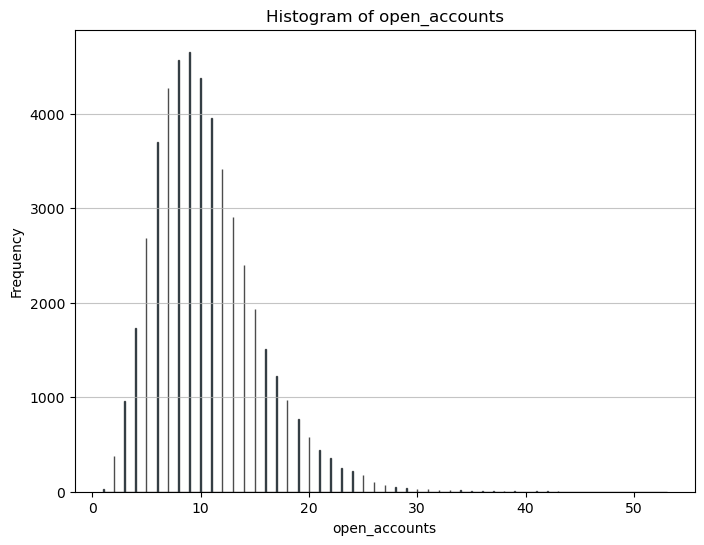

The skew of open_accounts column is 1.068263554049449


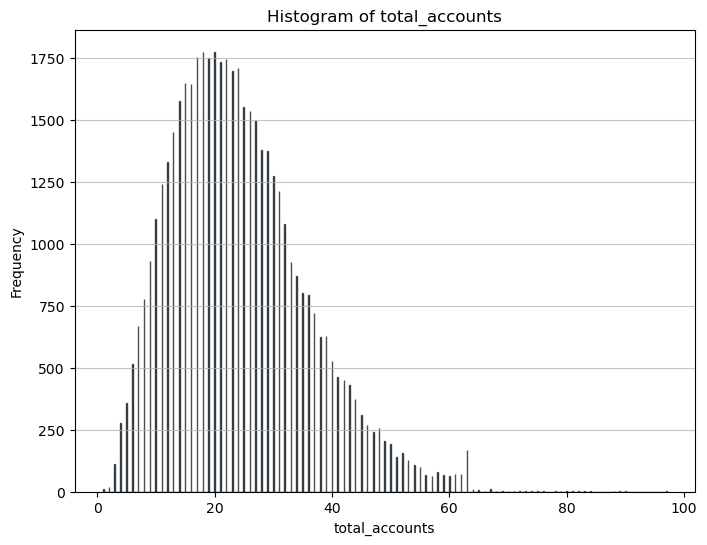

The skew of total_accounts column is 0.7793120428979106


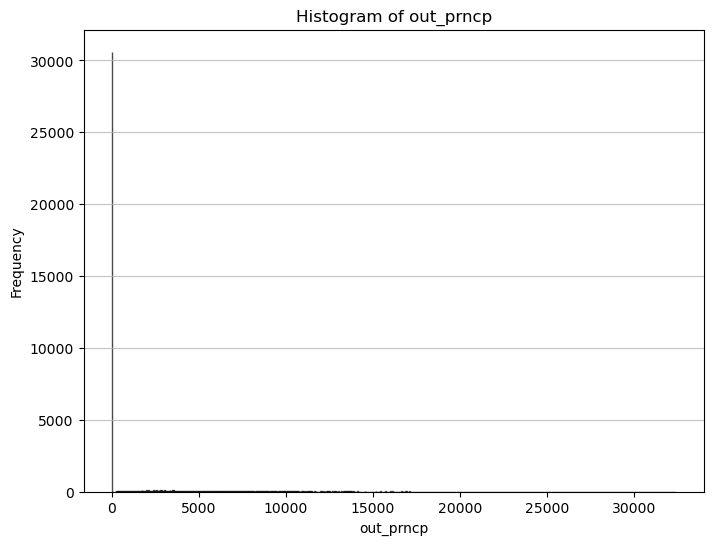

The skew of out_prncp column is 2.352240366655432


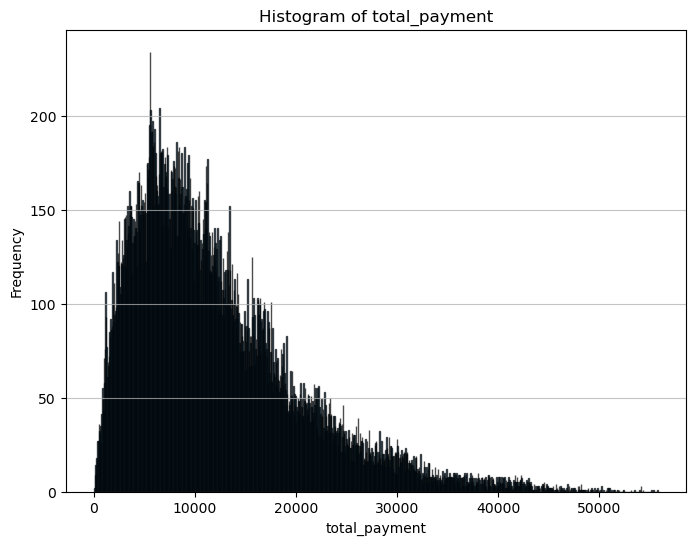

The skew of total_payment column is 1.2670466295819711


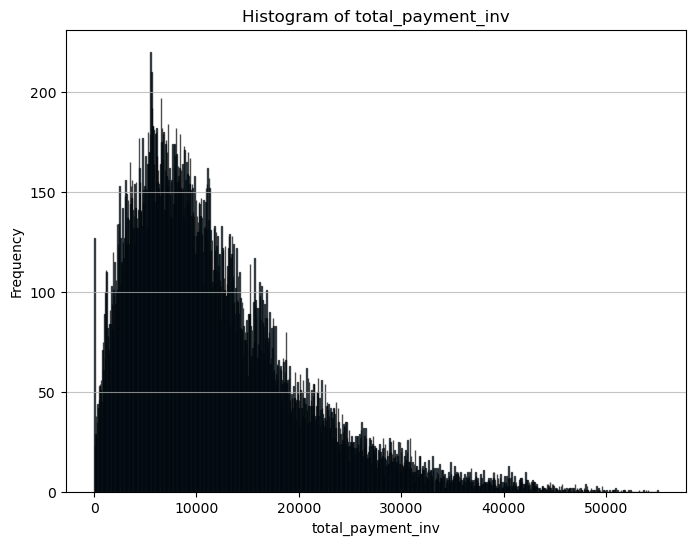

The skew of total_payment_inv column is 1.2557692305116788


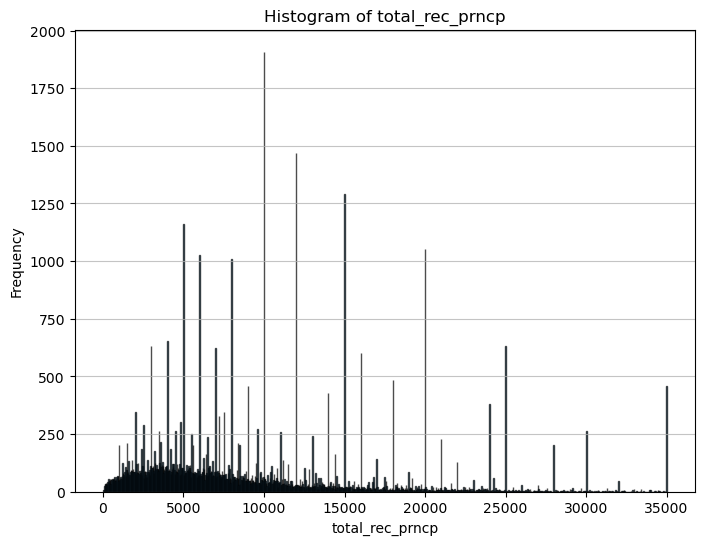

The skew of total_rec_prncp column is 1.2622016798617153


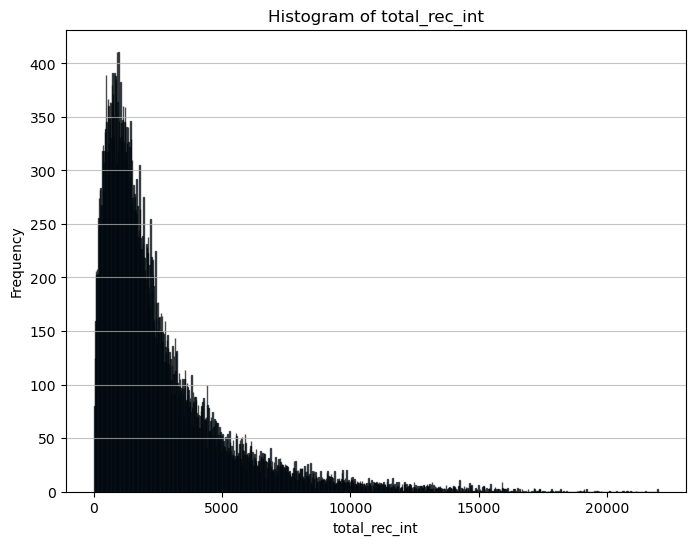

The skew of total_rec_int column is 2.1946972091571837


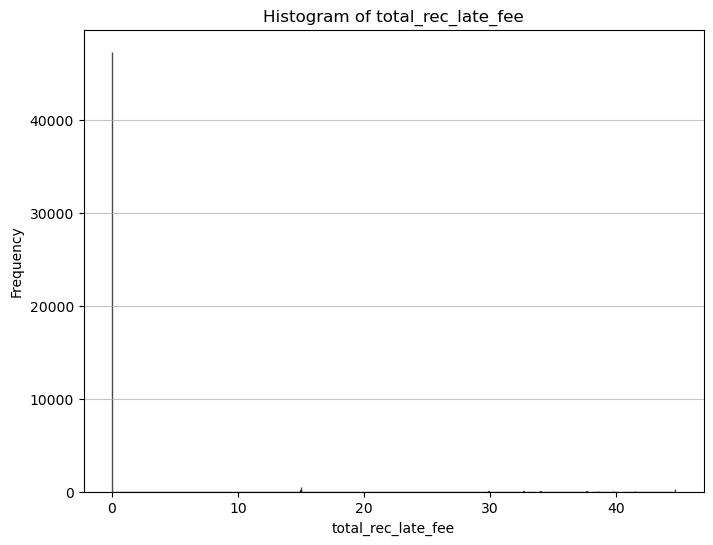

The skew of total_rec_late_fee column is 6.840614884118623


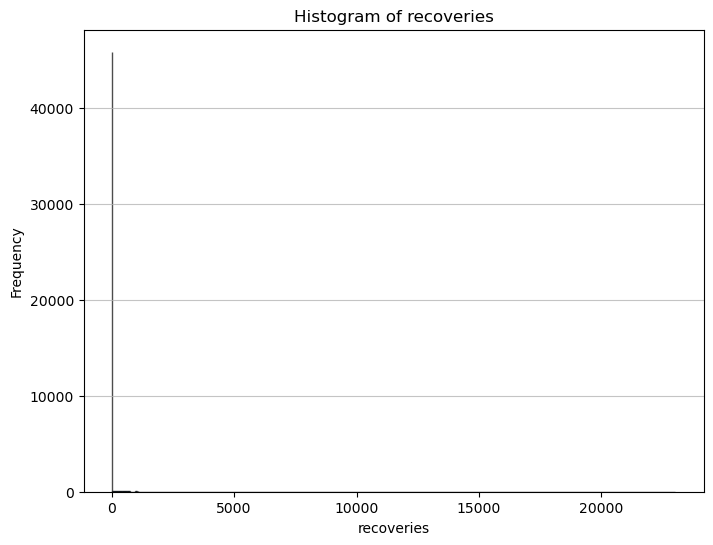

The skew of recoveries column is 13.628819245696132


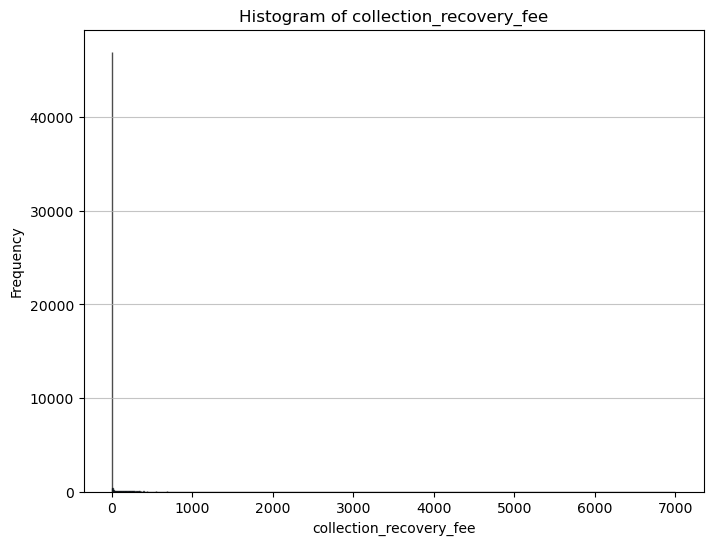

The skew of collection_recovery_fee column is 28.217271264024475
Skipping non-numeric column: last_payment_date


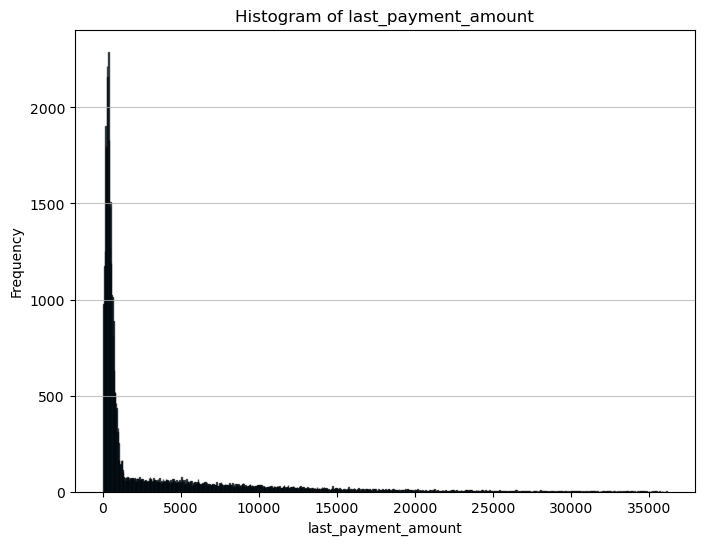

The skew of last_payment_amount column is 2.4927123682520644
Skipping non-numeric column: last_credit_pull_date


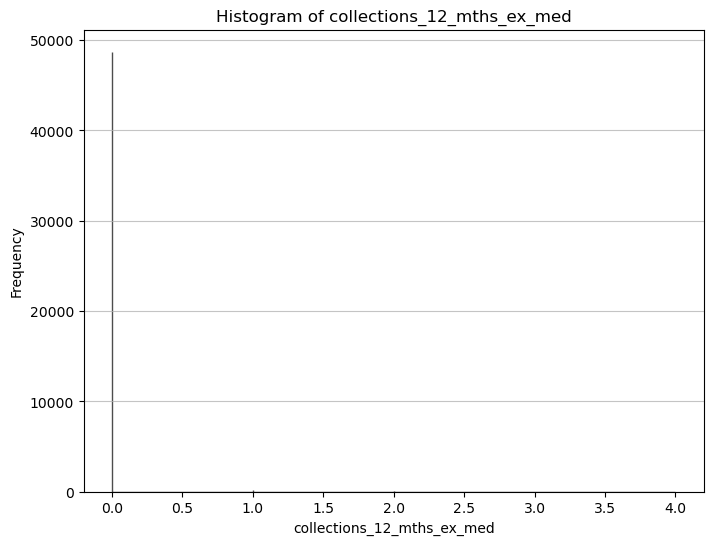

The skew of collections_12_mths_ex_med column is 20.2100017028605


In [27]:
plot_recovered=Plotter(recovered_df)

plot_recovered.histogram()

Total expected payment (sum): $591,642,171.51
Total principal recovered:    $460,768,823.83
Total interest recovered:     $126,323,521.55
Total late fees recovered:    $39,258.87
Recoveries:                   $4,505,570.78
Total paid (sum):             $591,637,175.03
Remaining to be paid:         $4,996.48
Total to be Paid (with Interest): $591,642,171.51
Total Paid So Far: $591,637,175.03
Recovery Percentage: 100.00%
Next 6 Months Payment Projection: $4,996.48


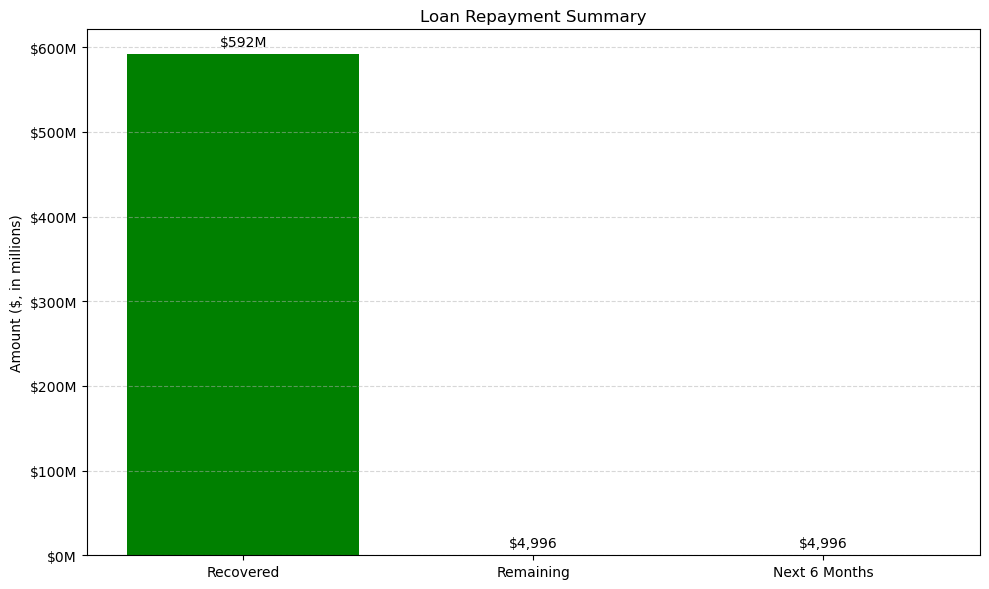

In [28]:
# Step 1: Analyze loan repayment
loan_analysis = LoanAnalyzer(recovered_df)
summary = loan_analysis.get_repayment_summary()

# Step 2: Print summary
print(f"Total to be Paid (with Interest): ${summary['total_expected']:,.2f}")
print(f"Total Paid So Far: ${summary['total_paid']:,.2f}")
print(f"Recovery Percentage: {summary['recovery_percentage']:.2f}%")
print(f"Next 6 Months Payment Projection: ${summary['next_6_months_projection']:,.2f}")

# Step 3: Visualize using Plotter
plotter = Plotter(recovered_df)
plotter.plot_loan_repayment_summary(
    total_paid=summary['total_paid'],
    total_expected=summary['total_expected'],
    next_6_months_payment=summary['next_6_months_projection']
)